# Assignment 3 Part 1 - Regression Models
**Group D - Members:**
1. Venkateshprasad Kulkarni
2. Reena Sajad Hyder
3. Pravinkumar Yadav
4. Milad Ghavami

As part of the assignment, we had to perform EDA and prepare the data for Regression Analysis. The EDA consists of the following tasks:
1. Initial Exploration and Summary Statistics
2. Data Structure and Missing Values
3. Comparing Column Names Across Years
4. Distribution of Key Variables
5. Correlation Analysis
6. Combining Datasets
7. Standardizing Continuous Variables
8. Temporal Analysis
9. Vehicle Manufacturer Analysis
10. Creating a Clean Dataset for Regression

# Pretasks: Importing required libraries, creating a logger for the code, and loading the data files into a dataframe

## 1. Importing libraries

In [1]:
import logging
import datetime
import pandas as pd
from sklearn.utils import resample
import matplotlib.pyplot as plt
import io
import numpy as np
import seaborn as sns
from soupsieve.util import lower
from textblob import TextBlob
from bs4 import BeautifulSoup
import re
from sklearn.neighbors import LocalOutlierFactor  # For the LOF model
from sklearn.ensemble import IsolationForest  # For the Isolation Forest model
from sklearn.covariance import EllipticEnvelope  # For the Robust Covariance model
import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from unicodedata import numeric

## 2. Creating a logger to generate logs for the entire code

In [2]:
# Configure the logging
logging.basicConfig(
    level=logging.DEBUG,
    format='%(asctime)s - %(levelname)s - %(message)s',
    datefmt='%Y-%m-%d %H:%M:%S'
)

# Create a logger
logger = logging.getLogger(__name__)
logging.getLogger('matplotlib').setLevel(logging.WARNING)

## 3. Loading datafiles in dataframe

Adding the datasets for all the years in a single dataframe and checking the number of rows and columns for each year's dataset

In [3]:
# Start time
start_time = datetime.datetime.now()

# List of file paths and corresponding years
# The file_paths list contains the paths to each data file, which are either in CSV or Excel format. 
# The 'years' list holds the corresponding year for each file.
file_paths = [
    "data/15tstcar.csv",
    "data/16tstcar.csv",
    "data/17tstcar-2018-05-30.xlsx",
    "data/18tstcar-2018-10-24.xlsx",
    "data/19tstcar-2020-10-02.xlsx",
    "data/20tstcar-2021-03-02.xlsx",
    "data/21-tstcar-2022-04-15.xlsx",
    "data/22-testcar-2023-06-13.xlsx",
    "data/23-testcar-2024-05-17_0.xlsx",
    "data/24-testcar-2024-05-17_0(1).xlsx"
]

# Corresponding years for each file
# This list stores the year associated with each file, ensuring the correct year is mapped when data is loaded.
years = [
    2015, 2016, 2017, 2018, 2019, 
    2020, 2021, 2022, 2023, 2024
]

# Load all files into a list of DataFrames and add the Year column
input_data = []
for i, file in enumerate(file_paths):
    if file.endswith('.csv'):
        # Load CSV files
        df = pd.read_csv(file)
    elif file.endswith('.xlsx'):
        # Load Excel files
        df = pd.read_excel(file)
    
    # Add the 'Year' column to the DataFrame using the 'years' list
    df['Year'] = years[i]
    # Append the DataFrame to the input_data list
    input_data.append(df)

# Concatenate all the DataFrames into one
# After loading all files and adding the 'Year' column, we merge them into a single DataFrame
merged_data = pd.concat(input_data, ignore_index=True)

# Log the time taken to load and merge the files
# Capture the stop time and calculate the duration taken for this entire process
stop_time = datetime.datetime.now()
logger.info(f"Time taken to load and merge the files: {stop_time - start_time}")

# Log the shape of the merged DataFrame
rows, columns = merged_data.shape
logger.info(f"The merged DataFrame has {rows} rows and {columns} columns.")


2024-11-05 13:29:58 - INFO - Time taken to load and merge the files: 0:01:19.206926
2024-11-05 13:29:59 - INFO - The merged DataFrame has 45479 rows and 68 columns.


# Tasks
## 1. Initial Exploration and Summary Statistics
Task Description: Load the datasets for all the years and compare the basic summary statistics. What are the key summary statistics (mean, median, standard deviation, etc.) for continuous variables such as "Test Veh Displacement (L)" and "Set Coef A (lbf)" in each dataset? Identify any outliers or anomalies.

###  Merging the datasets and removing duplicates from the datasets so they don't skew the summary statistcs

In [4]:
start_time = datetime.datetime.now()

# Merged dataset
# Concatenate all dataframes in the input_data list and add a new 'source' column to indicate the origin of each row.
# 'source' helps track from which file each row originated (e.g., File_1 for the first file).
merged_data = pd.concat([df.assign(source=f"File_{i+1}") for i, df in enumerate(input_data)])


# Removing duplicate values across all dataframes
# Drop duplicate rows across the entire merged dataset. The 'keep=False' parameter ensures that all duplicates are removed, retaining only unique rows.
unique_rows = merged_data.drop_duplicates(keep=False)

# Display a sample of the unique rows
# Print a sample of the unique rows after duplicates have been removed to inspect the data.
print("\nSample of unique rows:")
print(unique_rows)
# Log the time taken to process the block
# Capture the stop time and log the duration for merging and processing the dataset, as well as removing duplicates.
stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

2024-11-05 13:29:59 - INFO - Time taken to process the block: 0:00:00.541494



Sample of unique rows:
      Model Year Vehicle Manufacturer Name Veh Mfr Code  \
0           2015              aston martin          ASX   
1           2015              aston martin          ASX   
2           2015              aston martin          ASX   
3           2015              aston martin          ASX   
4           2015              aston martin          ASX   
...          ...                       ...          ...   
4132        2024                     Volvo          VVX   
4133        2024                     Volvo          VVX   
4134        2024                     Volvo          VVX   
4135        2024                     Volvo          VVX   
4136        2024                     Volvo          VVX   

     Represented Test Veh Make Represented Test Veh Model Test Vehicle ID  \
0                 Aston Martin                        DB9       143TT1042   
1                 Aston Martin                        DB9       143TT1042   
2                 Aston Martin      

## Conclusion
 
&nbsp;&nbsp;&nbsp;&nbsp;The summary statistics for **"Test Veh Displacement (L)"** and **"Set Coef A (lbf)"** reveal interesting trends in vehicle performance and design from **2015 to 2024**. Over the years, the **mean vehicle displacement** shows a moderate increase, particularly in **2023** and **2024**, with higher variability as indicated by the increasing **standard deviation**, suggesting a wider range of engine sizes in recent years. The displacement values range from very small (**0.001 L**) to extremely large (**99.999 L**), possibly indicating the inclusion of both **very compact** and **large commercial vehicles**.
 
&nbsp;&nbsp;&nbsp;&nbsp;For **"Set Coef A (lbf)"**, which represents the **aerodynamic drag** or **road load**, the mean decreases after **2015**, with a significant drop in **2023** and **2024**, suggesting advancements in vehicle design for **better efficiency**. The wide range, especially the large **negative** and **positive extremes**, points to **diverse vehicle characteristics**, including potential outliers with highly unusual aerodynamic properties. These trends suggest an ongoing shift towards **more varied** and potentially **more fuel-efficient vehicle designs**.
 
> The increase in variability for both engine displacement and road load values may indicate growing differentiation in vehicle types, likely reflecting broader industry changes in response to regulatory and market demands for both high-performance and more environmentally friendly vehicles.

### Display what each column has to get an idea of the attributes we have

In [5]:
start_time = datetime.datetime.now()

# Ensure column names are stripped of extra spaces
# Strip any extra spaces from the column names in 'unique_rows' to avoid issues related to inconsistent naming.
unique_rows.columns = unique_rows.columns.str.strip()

# Collect unique values for each column
# For each column in 'unique_rows', collect the unique values. These unique values are converted to strings and joined 
# by commas for display purposes. The result is a dictionary where each key is a column name and the value is a string
# of all unique values for that column.
unique_data = {
    col: [", ".join(map(str, unique_rows[col].unique()))]  # Join unique values as strings
    for col in unique_rows.columns
}

# Convert the dictionary to a DataFrame for display
# The dictionary is transposed into a DataFrame where column names become row indices. This way, the unique values for 
# each column are listed in a more readable format.
unique_df = pd.DataFrame(unique_data).T  # Transpose to make columns into rows
unique_df.columns = ['Unique Values']  # Rename the single column

# Display the table of unique values
# Print the DataFrame showing the unique values for each column, allowing for a quick view of column uniqueness.
print("Unique Values Table:")
print(unique_df)

# Log the time taken to process the block
# Capture the stop time and log the duration taken to strip spaces, gather unique values, and display them.
stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

2024-11-05 13:30:00 - INFO - Time taken to process the block: 0:00:00.381401


Unique Values Table:
                                                                Unique Values
Model Year                  2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022...
Vehicle Manufacturer Name   aston martin, Audi, Bentley, BMW, Bugatti, BYD...
Veh Mfr Code                ASX, ADX, BEX, BMX, BGT, BYD, FTG, CRX, FEX, F...
Represented Test Veh Make   Aston Martin, AUDI, BENTLEY, Bentley, BMW, Min...
Represented Test Veh Model  DB9, Rapide S, V12 Vantage S, V8 VANTAGE, V8 V...
...                                                                       ...
Averaging Weighting Factor         nan, 0.5, 0.35, 0.65, 0.8, 0.2, 0.45, 0.55
Averaging Method Cd                                                      N, H
Averging Method Desc        No averaging, Harmonic averaging (1/(Sum(i=1 t...
Year                        2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022...
source                      File_1, File_2, File_3, File_4, File_5, File_6...

[69 rows x 1 columns]


### Creating a bar chart to visually display the count of unique values per column

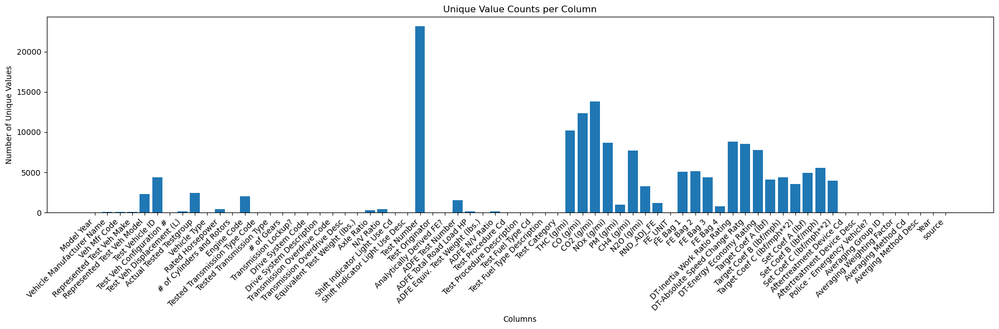

2024-11-05 13:30:02 - INFO - Time taken to process the block: 0:00:01.967362


In [6]:
start_time = datetime.datetime.now()

# Strip extra spaces from column names
# Ensure that column names in 'unique_rows' are free from extra spaces, which could cause issues during analysis.
unique_rows.columns = unique_rows.columns.str.strip()
# Calculate the number of unique values for each column
# Create a dictionary where the keys are the column names and the values are the number of unique values in each column.
unique_counts = {col: len(unique_rows[col].unique()) for col in unique_rows.columns}

# Create a bar chart to visualize unique value counts per column
# Set the figure size for better visibility. Plot a bar chart with the column names on the x-axis and the count of unique 
# values on the y-axis.
plt.figure(figsize=(18, 6))
plt.bar(unique_counts.keys(), unique_counts.values())
# Adjust the x-axis labels for readability
# Rotate the x-axis labels for better readability, especially if there are many columns.
plt.xticks(rotation=45, ha='right')
# Add labels and title
plt.xlabel('Columns')
plt.ylabel('Number of Unique Values')
plt.title('Unique Value Counts per Column')
# Adjust layout to ensure everything fits well
plt.tight_layout()

# Display the bar chart
plt.show()
# Log the time taken to process the block
# Capture the stop time and log the duration for stripping spaces, calculating unique values, and plotting the bar chart.
stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Getting the unique car models across datasets

In [7]:
start_time = datetime.datetime.now()

# Retrieve unique car models
# Extract the unique values from the 'Test Number' column, which presumably represents car models or test identifiers.
unique_models = unique_rows['Test Number'].unique()
# Display the unique car models
# Print the unique car models (or test numbers) across the datasets to get an overview of distinct entities.
print("Unique car models across datasets:")
print(unique_models)
# Log the time taken to process the block
# Capture the stop time and log the duration taken to extract and display the unique car models.
stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

2024-11-05 13:30:02 - INFO - Time taken to process the block: 0:00:00.015843


Unique car models across datasets:
['DASX10022045' 'DASX10022046' 'FASX10032202' ... 'RVVX10080265'
 'RVVX91005436' 'RVVX91005450']


### Print the count of non-numeric values for each relevant column in each DataFrame

In [8]:
# List of relevant columns to check for non-numeric values
# These columns are likely numerical in nature (e.g., displacement, horsepower, coefficients) and will be checked 
# for any non-numeric values that might cause issues during analysis.
relevant_columns = [
    "Test Veh Displacement (L)", "Set Coef A (lbf)", "Model Year", 
    "Rated Horsepower", "Set Coef B (lbf/mph)", "Set Coef C (lbf/mph**2)", 
    "# of Gears", "Equivalent Test Weight (lbs.)", "Axle Ratio"
]

# Function to count non-numeric values in a series
# This function converts the input series to numeric values. Non-numeric values will be coerced to NaN, and the function 
# will count the number of NaNs, representing non-numeric entries.
def count_non_numeric(series):
    # Convert to numeric, coerce errors to NaN, and count NaN values
    return pd.to_numeric(series, errors='coerce').isna().sum()

# Loop through each DataFrame in the list and check non-numeric counts
# For each DataFrame in 'input_data', the script checks how many non-numeric values exist in each of the relevant columns.
for i, df in enumerate(input_data):
    print(f"\nNon-numeric values in DataFrame {i + 1}:")
    
    # Apply the 'count_non_numeric' function to each relevant column in the current DataFrame
    # The result is a count of non-numeric values in each column.
    non_numeric_counts = df[relevant_columns].apply(count_non_numeric, axis=0)

   # Print the results for the current DataFrame
    print(non_numeric_counts)



Non-numeric values in DataFrame 1:
Test Veh Displacement (L)        0
Set Coef A (lbf)                 0
Model Year                       0
Rated Horsepower                 0
Set Coef B (lbf/mph)             0
Set Coef C (lbf/mph**2)          0
# of Gears                       0
Equivalent Test Weight (lbs.)    0
Axle Ratio                       0
dtype: int64

Non-numeric values in DataFrame 2:
Test Veh Displacement (L)        0
Set Coef A (lbf)                 0
Model Year                       0
Rated Horsepower                 0
Set Coef B (lbf/mph)             0
Set Coef C (lbf/mph**2)          0
# of Gears                       0
Equivalent Test Weight (lbs.)    0
Axle Ratio                       0
dtype: int64

Non-numeric values in DataFrame 3:
Test Veh Displacement (L)        0
Set Coef A (lbf)                 0
Model Year                       0
Rated Horsepower                 0
Set Coef B (lbf/mph)             0
Set Coef C (lbf/mph**2)          0
# of Gears                

### The key summary statistics (mean, median, standard deviation, etc.) for continuous variables

In [9]:
# List of years corresponding to each dataset
# The 'years' list contains the years corresponding to each dataset in 'input_data', which will be used as keys
# for storing summary statistics.
years = ["2015", "2016", "2017", "2018", "2019", 
         "2020", "2021", "2022", "2023", "2024"]

# Initialize an empty dictionary to store statistics for each year
# The 'summary_stats' dictionary will hold the summary statistics for each year as key-value pairs.
summary_stats = {}

# Step 1: Calculate key statistics for each dataset
# Loop through each DataFrame in 'input_data', computing key statistics for the relevant columns.
for i, df in enumerate(input_data):

    # Compute summary statistics: mean, median, std, min, and max
    # For each DataFrame, calculate these summary statistics for the 'relevant_columns' (e.g., horsepower, weight).
    stats = df[relevant_columns].agg(['mean', 'median', 'std', 'min', 'max'])

    # Store the statistics in the dictionary using the corresponding year as the key
    summary_stats[years[i]] = stats

# Step 2: Convert the dictionary of summary stats into a multi-index DataFrame
# Combine the statistics from the dictionary into a single DataFrame, with the years as part of the multi-index.
summary_df = pd.concat(summary_stats, axis=1)

# Display the summary statistics
# Print the final DataFrame that contains the computed summary statistics for each year and each relevant column.
print("Summary Statistics for Continuous Variables:")
print(summary_df)


Summary Statistics for Continuous Variables:
                            2015                                               \
       Test Veh Displacement (L) Set Coef A (lbf) Model Year Rated Horsepower   
mean                    3.334225        12.015613     2015.0       277.807947   
median                  3.000000        12.117000     2015.0       260.000000   
std                     4.992816        10.256352        0.0       123.726710   
min                     0.001000       -28.100000     2015.0        11.000000   
max                    99.999000       150.200000     2015.0      1200.000000   

                                                                \
       Set Coef B (lbf/mph) Set Coef C (lbf/mph**2) # of Gears   
mean               0.106497                0.023431   6.129346   
median             0.099250                0.019685   6.000000   
std                0.233939                0.033399   2.019372   
min               -0.983300                0.002900   1.0

### Compare the mean of each column in each year

<Figure size 1200x600 with 0 Axes>

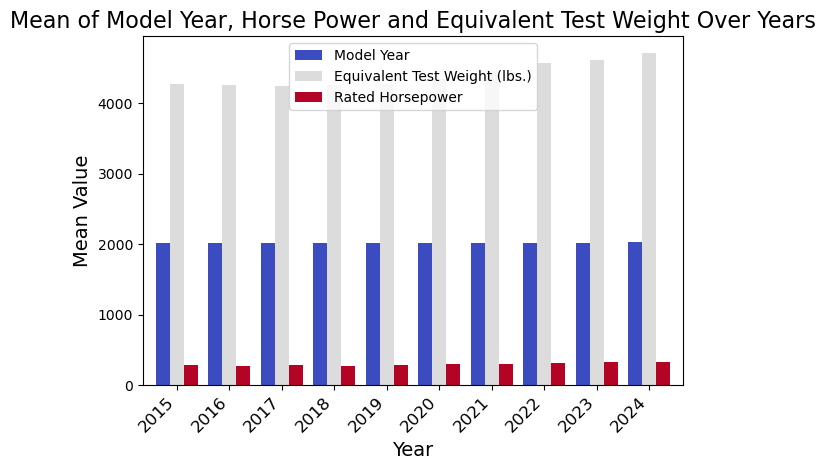

<Figure size 2400x1200 with 0 Axes>

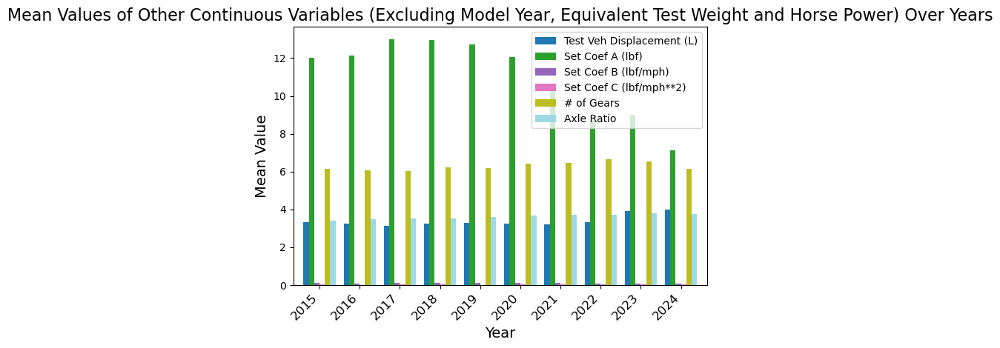

In [10]:
# Initialize an empty dictionary to store mean values for each year
# 'mean_stats' will hold the mean values for the relevant columns, grouped by year.
mean_stats = {}

# Step 1: Calculate mean values for each dataset
# Loop through each DataFrame in 'input_data' to compute the mean for the relevant columns.
for i, df in enumerate(input_data):

    # Compute the mean for the relevant columns
    # Calculate the mean of all the columns listed in 'relevant_columns'.
    means = df[relevant_columns].mean()
    
    # Store the mean values in 'mean_stats' using the year as the key
    mean_stats[years[i]] = means

# Step 2: Create a DataFrame from the mean values
# Convert the dictionary of mean values into a DataFrame, and transpose it so that the years become rows.
mean_df = pd.DataFrame(mean_stats).T  # Transpose for better visualization
mean_df.index.name = 'Year'  # Set the index name to 'Year'

# Columns to plot together: "Model Year", "Rated Horsepower", and "Equivalent Test Weight (lbs.)"
# These specific columns are selected to visualize in the first plot.
rated_horsepower = "Rated Horsepower"
model_year_column = "Model Year"
equivalent_test_weight_column = "Equivalent Test Weight (lbs.)"
columns_to_plot_1 = [model_year_column, equivalent_test_weight_column, rated_horsepower]

# Remaining columns
# The remaining columns, excluding the ones already chosen for the first plot, are listed here for a second plot.
other_columns = [col for col in relevant_columns if col not in columns_to_plot_1]

# Plot for "Model Year", "Rated Horsepower", and "Equivalent Test Weight (lbs.)"
# Create a bar plot for the selected columns, using a 'coolwarm' colormap for distinction.
plt.figure(figsize=(12, 6))
mean_df[columns_to_plot_1].plot(kind='bar', colormap='coolwarm', width=0.8)
plt.title("Mean of Model Year, Horse Power and Equivalent Test Weight Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Mean Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot for the remaining columns
# A second bar plot is created for the rest of the relevant columns, using a different colormap ('tab20').
plt.figure(figsize=(24, 12))
mean_df[other_columns].plot(kind='bar', colormap='tab20', width=0.8)
plt.title("Mean Values of Other Continuous Variables (Excluding Model Year, Equivalent Test Weight and Horse Power) Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Mean Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


### Compare the std of each column in each year

<Figure size 1200x600 with 0 Axes>

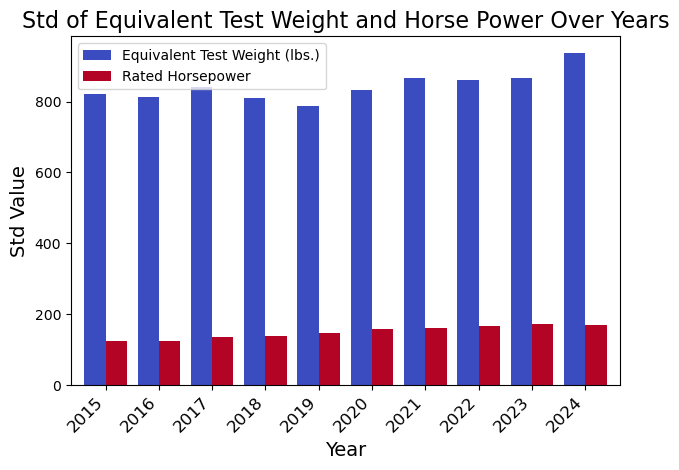

<Figure size 2400x1200 with 0 Axes>

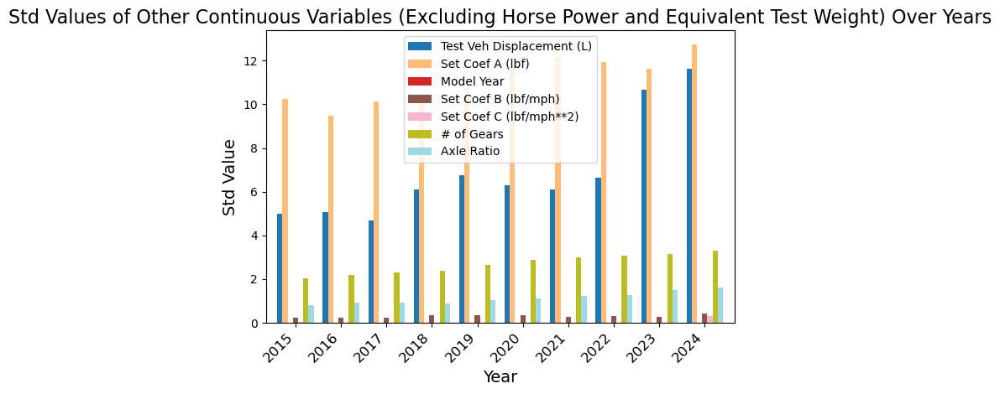

In [11]:
# Initialize an empty dictionary to store std values for each year
# 'std_stats' will hold the standard deviation values for the relevant columns, grouped by year.
std_stats = {}

# Step 1: Calculate std values for each dataset
# Loop through each DataFrame in 'input_data' to compute the standard deviation for the relevant columns.
for i, df in enumerate(input_data):

    # Compute the standard deviation for the relevant columns
    # Calculate the standard deviation of all the columns listed in 'relevant_columns'.
    stds = df[relevant_columns].std()

    # Store the std values in 'std_stats' using the year as the key
    std_stats[years[i]] = stds

# Step 2: Create a DataFrame from the std values
# Convert the dictionary of standard deviation values into a DataFrame, and transpose it so that the years become rows.
std_df = pd.DataFrame(std_stats).T  # Transpose for better visualization
std_df.index.name = 'Year'  # Set the index name to 'Year'

# Columns to plot together: "Rated Horsepower" and "Equivalent Test Weight (lbs.)"
# These specific columns are selected to visualize in the first plot.
rated_horsepower = "Rated Horsepower"
equivalent_test_weight_column = "Equivalent Test Weight (lbs.)"
columns_to_plot_1 = [equivalent_test_weight_column, rated_horsepower]

# Remaining columns
# The remaining columns, excluding the ones already chosen for the first plot, are listed here for a second plot.
other_columns = [col for col in relevant_columns if col not in columns_to_plot_1]

# Plot for "Rated Horsepower" and "Equivalent Test Weight (lbs.)"
# Create a bar plot for the selected columns, using a 'coolwarm' colormap for distinction.
plt.figure(figsize=(12, 6))
std_df[columns_to_plot_1].plot(kind='bar', colormap='coolwarm', width=0.8)
plt.title("Std of Equivalent Test Weight and Horse Power Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Std Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot for the remaining columns
# A second bar plot is created for the rest of the relevant columns, using a different colormap ('tab20').
plt.figure(figsize=(24, 12))
std_df[other_columns].plot(kind='bar', colormap='tab20', width=0.8)
plt.title("Std Values of Other Continuous Variables (Excluding Horse Power and Equivalent Test Weight) Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Std Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


### Compare the min of each column in each year

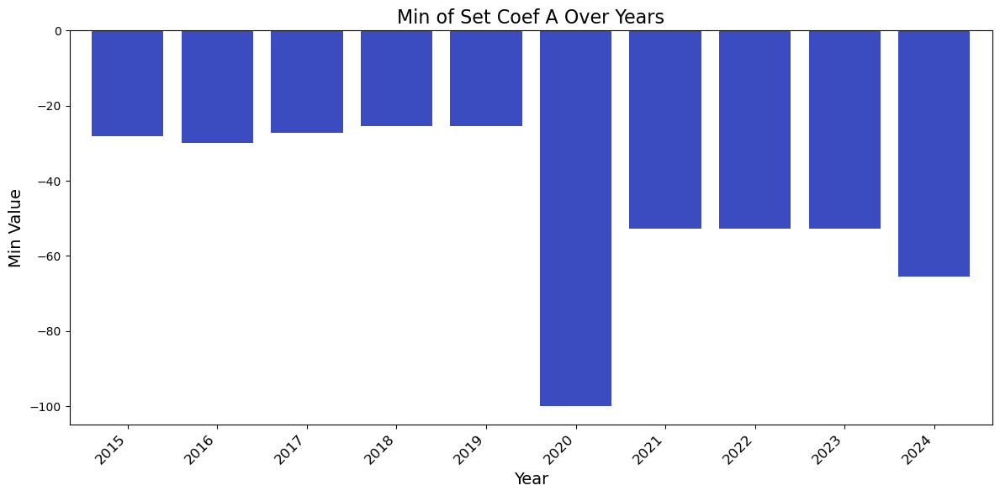

<Figure size 1200x600 with 0 Axes>

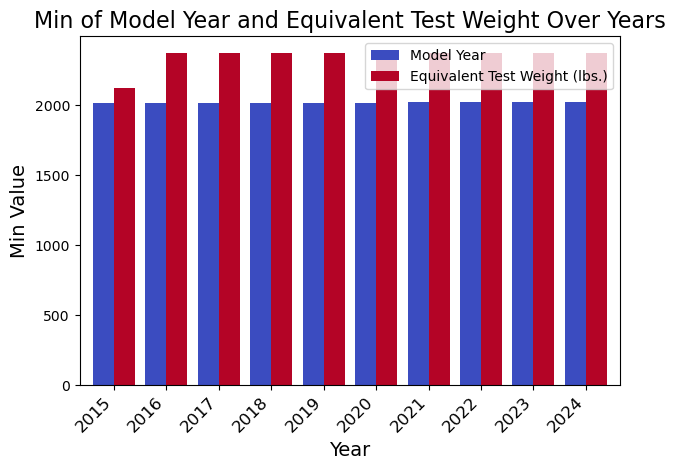

<Figure size 2400x1200 with 0 Axes>

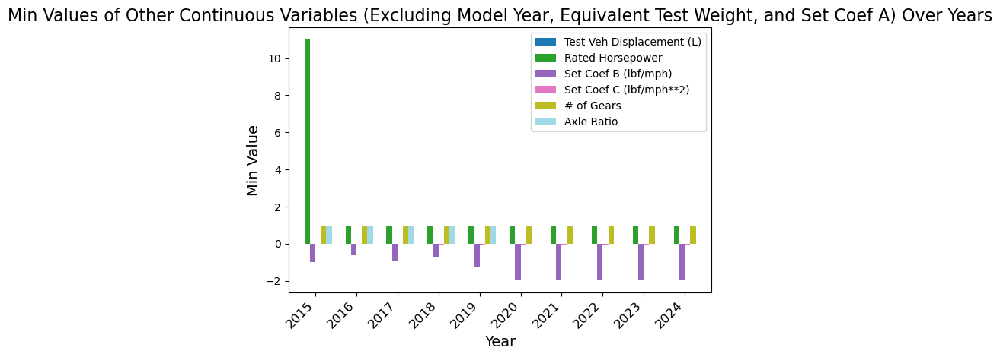

In [12]:
# Initialize an empty dictionary to store min values for each year
# 'min_stats' will hold the minimum values for the relevant columns, grouped by year.
min_stats = {}

# Step 1: Calculate min values for each dataset
# Loop through each DataFrame in 'input_data' to compute the minimum values for the relevant columns.
for i, df in enumerate(input_data):

    # Compute the minimum for the relevant columns
    # Calculate the minimum values for all the columns listed in 'relevant_columns'.
    mins = df[relevant_columns].min()

    # Store the min values in 'min_stats' using the year as the key
    min_stats[years[i]] = mins

# Step 2: Create a DataFrame from the min values
# Convert the dictionary of minimum values into a DataFrame, and transpose it so that the years become rows.
min_df = pd.DataFrame(min_stats).T  # Transpose for better visualization
min_df.index.name = 'Year'  # Set the index name to 'Year'

# Columns to plot together: "Model Year", "Equivalent Test Weight (lbs.)", and "Set Coef A (lbf)"
# Specific columns are selected to visualize in the first and second plots.
coeff_A = "Set Coef A (lbf)"
model_year_column = "Model Year"
equivalent_test_weight_column = "Equivalent Test Weight (lbs.)"
columns_to_plot_1 = [model_year_column, equivalent_test_weight_column]
other_columns1 = [coeff_A]

# Remaining columns
# The remaining columns, excluding the ones already chosen for the first two plots, are listed here for the final plot.
other_columns = [col for col in relevant_columns if (col not in columns_to_plot_1 and col not in other_columns1)]

# Plot for "Set Coef A (lbf)"
# Create a bar plot for the column "Set Coef A (lbf)", using a 'coolwarm' colormap for distinction.
plt.figure(figsize=(12, 6))
min_df[coeff_A].plot(kind='bar', colormap='coolwarm', width=0.8)
plt.title("Min of Set Coef A Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Min Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot for "Model Year" and "Equivalent Test Weight (lbs.)"
# Create a bar plot for "Model Year" and "Equivalent Test Weight (lbs.)" using a 'coolwarm' colormap.
plt.figure(figsize=(12, 6))
min_df[columns_to_plot_1].plot(kind='bar', colormap='coolwarm', width=0.8)
plt.title("Min of Model Year and Equivalent Test Weight Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Min Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot for the remaining columns
# A final bar plot is created for the rest of the relevant columns, using a different colormap ('tab20').
plt.figure(figsize=(24, 12))
min_df[other_columns].plot(kind='bar', colormap='tab20', width=0.8)
plt.title("Min Values of Other Continuous Variables (Excluding Model Year, Equivalent Test Weight, and Set Coef A) Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Min Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


### Compare the max of each column in each year

<Figure size 1200x600 with 0 Axes>

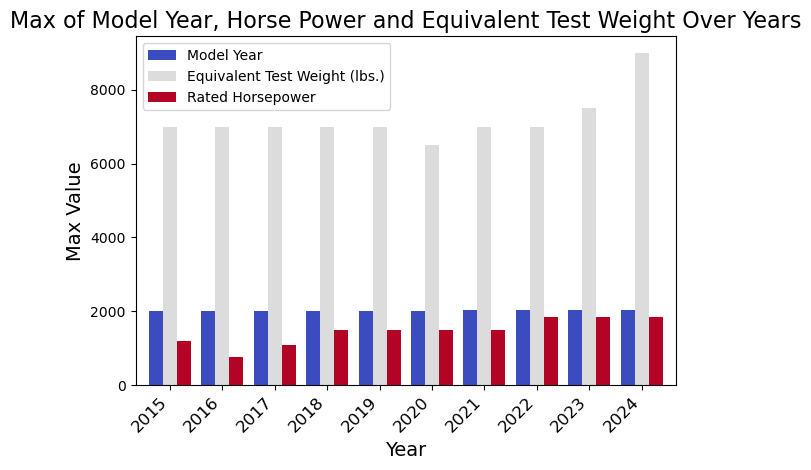

<Figure size 2400x1200 with 0 Axes>

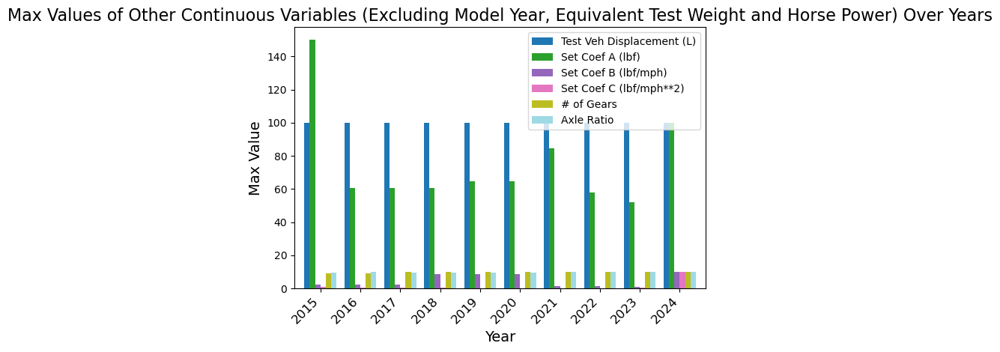

In [13]:
# Initialize an empty dictionary to store max values for each year
# 'max_stats' will hold the maximum values for the relevant columns, grouped by year.
max_stats = {}

# Step 1: Calculate max values for each dataset
# Loop through each DataFrame in 'input_data' to compute the maximum values for the relevant columns.
for i, df in enumerate(input_data):

    # Compute the maximum for the relevant columns
    # Calculate the maximum values for all the columns listed in 'relevant_columns'.
    maxs = df[relevant_columns].max()

    # Store the max values in 'max_stats' using the year as the key
    max_stats[years[i]] = maxs

# Step 2: Create a DataFrame from the max values
# Convert the dictionary of maximum values into a DataFrame, and transpose it so that the years become rows.
max_df = pd.DataFrame(max_stats).T  # Transpose for better visualization
max_df.index.name = 'Year'  # Set the index name to 'Year'

# Columns to plot together: "Model Year", "Rated Horsepower", and "Equivalent Test Weight (lbs.)"
# These specific columns are selected to visualize in the first plot.
rated_horsepower = "Rated Horsepower"
model_year_column = "Model Year"
equivalent_test_weight_column = "Equivalent Test Weight (lbs.)"
columns_to_plot_1 = [model_year_column, equivalent_test_weight_column, rated_horsepower]

# Remaining columns
# The remaining columns, excluding the ones already chosen for the first plot, are listed here for the second plot.
other_columns = [col for col in relevant_columns if col not in columns_to_plot_1]

# Plot for "Model Year", "Rated Horsepower", and "Equivalent Test Weight (lbs.)"
# Create a bar plot for the selected columns, using a 'coolwarm' colormap for distinction.
plt.figure(figsize=(12, 6))
max_df[columns_to_plot_1].plot(kind='bar', colormap='coolwarm', width=0.8)
plt.title("Max of Model Year, Horse Power and Equivalent Test Weight Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Max Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot for the remaining columns
# A second bar plot is created for the rest of the relevant columns, using a different colormap ('tab20').
plt.figure(figsize=(24, 12))
max_df[other_columns].plot(kind='bar', colormap='tab20', width=0.8)
plt.title("Max Values of Other Continuous Variables (Excluding Model Year, Equivalent Test Weight and Horse Power) Over Years", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Max Value", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


### Compare the count of each column in each year

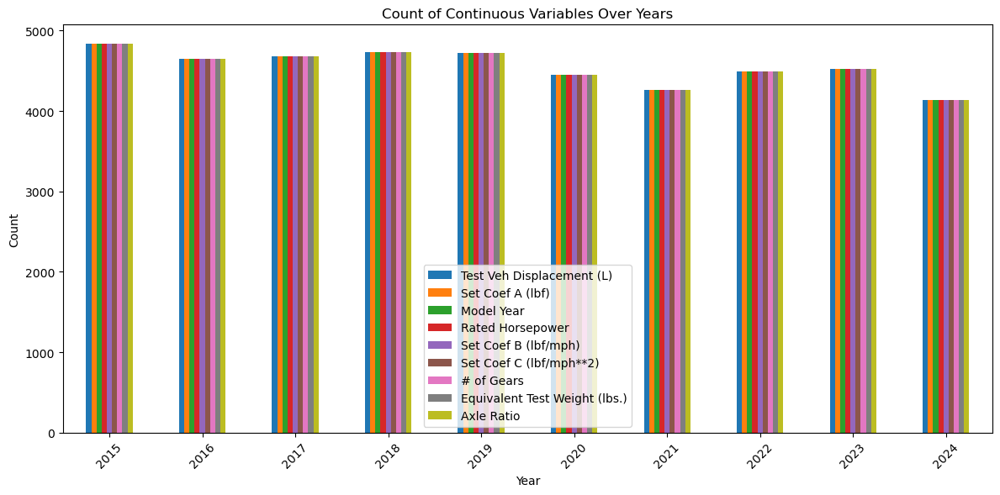

In [14]:
# Initialize an empty dictionary to store count values for each year
# 'count_stats' will hold the count of non-null values for the relevant columns, grouped by year.
count_stats = {}

# Step 1: Calculate count values for each dataset
# Loop through each DataFrame in 'input_data' to compute the count of non-null values for the relevant columns.
for i, df in enumerate(input_data):

    # Compute the count for the relevant columns
    # This calculates the number of non-null entries for each column in 'relevant_columns'.
    counts = df[relevant_columns].count()

    # Store the count values in 'count_stats' using the year as the key
    count_stats[years[i]] = counts

# Step 2: Create a DataFrame from the count values
# Convert the dictionary of count values into a DataFrame, and transpose it so that the years become rows.
count_df = pd.DataFrame(count_stats).T  # Transpose for better visualization
count_df.index.name = 'Year'  # Set the index name to 'Year'

# Step 3: Plot the count values for each variable
# Create a bar plot to show the count of non-null values for each relevant column over the years.
count_df.plot(kind='bar', figsize=(12, 6))

# Set the title and axis labels for the plot
plt.title("Count of Continuous Variables Over Years")  # Title of the plot
plt.xlabel("Year")  # Label for the x-axis
plt.ylabel("Count")  # Label for the y-axis
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Adjust layout and show the plot
plt.tight_layout()  # Adjust the layout to avoid overlap
plt.show()  # Display the plot


### Select a few important numerical features for outlier detection.
These attributes are important because they impact vehicle performance, fuel consumption, and emissions:

* **Test Vehicle Displacement (L)** – Larger engines typically burn more fuel, leading to higher emissions.
* **Set Coef A (lbf)** – Represents resistance to movement, affecting fuel use.
* **Model Year** – Newer cars have stricter emissions standards and better fuel efficiency.
* **Rated Horsepower** – More horsepower often means higher fuel consumption and emissions.
* **Set Coef B (lbf/mph) and Set Coef C (lbf/mph²)** – Reflect how resistance increases with speed, impacting fuel use.
* **\# of Gears** – More gears improve efficiency, reducing fuel use.
* **Equivalent Test Weight (lbs.)** – Heavier vehicles require more energy, increasing emissions.
* **Axle Ratio** – Affects engine RPM and fuel efficiency, with higher ratios generally leading to more emissions.


In [15]:
# Define the numerical columns to be used in the analysis
# These columns include important numerical features like vehicle displacement, horsepower, test weight, and others.
num_cols = [
    "Test Veh Displacement (L)", "Set Coef A (lbf)", "Model Year", 
    "Rated Horsepower", "Set Coef B (lbf/mph)", "Set Coef C (lbf/mph**2)", 
    "# of Gears", "Equivalent Test Weight (lbs.)", "Axle Ratio"
]

# Extract the relevant numerical columns from 'merged_data'
# 'car_markers' is a subset of the DataFrame containing only the specified numerical columns.
car_markers = merged_data[num_cols]

# Drop rows with missing values (NaN) from 'car_markers'
# This removes any rows where one or more of the selected columns have missing data, ensuring a clean dataset for further analysis.
car_markers = car_markers.dropna()

# Print the shape of the cleaned DataFrame
# Display the number of rows and columns in the 'car_markers' DataFrame after dropping rows with missing values.
print(car_markers.shape)


(45479, 9)


### Outlier Detection
We use three different outlier detection techniques. 
- **Step 3a:** Local Outlier Factor (KNN-based) to identify 5% outliers.
- **Step 3b:** Isolation Forest (tree-based) to detect 5% outliers.
- **Step 3c:** Robust Covariance (Mahalanobis distance) for 5% outliers.
- Add predictions to DataFrame and convert to binary labels (-1 = outlier, 0 = inlier).


In [16]:
# -----------------------------------------------------------------------------
# Step 3a: Fit the Local Outlier Factor (LOF) model
# The LOF model is based on K-Nearest Neighbors (KNN) and is used to detect outliers.
# The 'contamination' parameter is set to 0.05, meaning that we assume 5% of the data points are outliers.
# -----------------------------------------------------------------------------

lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
# Predict the labels for each data point as either outlier (-1) or inlier (1).
y_pred_lof = lof.fit_predict(car_markers)

# Type of 'y_pred_lof'
# Display the type of the predictions, which should be a numpy array.
print(type(y_pred_lof))

# Frequency of each label in 'y_pred_lof'
# Display the count of outliers (-1) and inliers (1) to understand the distribution.
print(np.unique(y_pred_lof, return_counts=True))


# -----------------------------------------------------------------------------
# Step 3b: Fit the Isolation Forest model
# The Isolation Forest model is based on decision trees and is also used to detect outliers.
# The 'contamination' parameter is set to 0.05, assuming 5% of the data are outliers.
# -----------------------------------------------------------------------------

iforest = IsolationForest(n_estimators=100, contamination=0.05)
# Predict the labels for each data point as either outlier (-1) or inlier (1).
y_pred_if = iforest.fit_predict(car_markers)

# Type of 'y_pred_if'
# Display the type of the predictions, which should be a numpy array.
print(type(y_pred_if))

# Frequency of each label in 'y_pred_if'
# Display the count of outliers (-1) and inliers (1) for the Isolation Forest model.
print(np.unique(y_pred_if, return_counts=True))


# -----------------------------------------------------------------------------
# Step 3c: Fit the robust covariance model (Elliptic Envelope)
# This model uses Mahalanobis distance to identify outliers and assumes the data is normally distributed.
# -----------------------------------------------------------------------------

rob_cov = EllipticEnvelope(contamination=0.05)
# Fit the model and predict labels for each data point as either outlier (-1) or inlier (1).
rob_cov.fit(car_markers)
y_pred_rob = rob_cov.predict(car_markers)

# Type of 'y_pred_rob'
# Display the type of the predictions, which should be a numpy array.
print(type(y_pred_rob))

# Frequency of each label in 'y_pred_rob'
# Display the count of outliers (-1) and inliers (1) for the robust covariance model.
print(np.unique(y_pred_rob, return_counts=True))


# -----------------------------------------------------------------------------
# Add the newly predicted labels (from LOF, Isolation Forest, and robust covariance) to 'car_markers' DataFrame
# -----------------------------------------------------------------------------
car_markers["y_pred_lof"] = y_pred_lof
car_markers["y_pred_if"] = y_pred_if
car_markers["y_pred_rob"] = y_pred_rob


# -----------------------------------------------------------------------------
# Convert the outlier predictions to binary format (-1, 0) where -1 denotes outliers.
# This will allow us to easily sum up how many methods identified a data point as an outlier.
# -----------------------------------------------------------------------------
car_markers["y_pred_lof_2"] = np.where(car_markers["y_pred_lof"] < 0, -1, 0)
car_markers["y_pred_if_2"] = np.where(car_markers["y_pred_if"] < 0, -1, 0)
car_markers["y_pred_rob_2"] = np.where(car_markers["y_pred_rob"] < 0, -1, 0)


# Display the last 20 rows of the updated 'car_markers' DataFrame
car_markers.tail(n=20)


<class 'numpy.ndarray'>
(array([-1,  1]), array([ 2274, 43205], dtype=int64))
<class 'numpy.ndarray'>
(array([-1,  1]), array([ 2274, 43205], dtype=int64))
<class 'numpy.ndarray'>
(array([-1,  1]), array([ 2274, 43205], dtype=int64))


,Test Veh Displacement (L),Set Coef A (lbf),Model Year,Rated Horsepower,Set Coef B (lbf/mph),Set Coef C (lbf/mph**2),# of Gears,Equivalent Test Weight (lbs.),Axle Ratio,y_pred_lof,y_pred_if,y_pred_rob,y_pred_lof_2,y_pred_if_2,y_pred_rob_2
4117,0.001,6.200,2024,248,0.25400,0.020700,1,4750,8.77,1,1,-1,0,0,-1
4118,0.001,6.200,2024,248,0.25400,0.020700,1,4750,8.77,1,1,-1,0,0,-1
4119,0.001,-8.300,2024,402,0.18900,0.020600,1,5000,8.67,1,-1,-1,0,-1,-1
4120,0.001,-8.300,2024,402,0.18900,0.020600,1,5000,8.67,1,-1,-1,0,-1,-1
4121,1.969,23.614,2024,247,0.26676,0.022329,8,4500,3.33,1,1,1,0,0,0
4122,1.969,23.614,2024,247,0.26676,0.022329,8,4500,3.33,1,1,1,0,0,0
4123,1.969,-1.268,2024,312,0.41240,0.020571,8,5000,3.33,1,1,1,0,0,0
4124,1.969,-1.268,2024,312,0.41240,0.020571,8,5000,3.33,1,1,1,0,0,0
4125,1.969,-1.268,2024,312,0.41240,0.020571,8,5000,3.33,1,1,1,0,0,0
4126,1.969,-1.268,2024,312,0.41240,0.020571,8,5000,3.33,1,1,1,0,0,0


In [17]:
# Display the last three columns of 'car_markers'
# This includes the binary outlier predictions (-1 or 0) from the three different models.
car_markers.iloc[:, -3:]

# Create a crosstab to compare the outlier predictions between Isolation Forest and robust covariance (Elliptic Envelope)
# This will show the frequency of outliers (-1) and inliers (0) for both methods.
pd.crosstab(car_markers["y_pred_if_2"], car_markers["y_pred_rob_2"])

# Create a new column 'all_out' by summing the outlier predictions from all three methods (LOF, Isolation Forest, and robust covariance)
# The sum will give an indication of how many methods identified each point as an outlier. If the sum is -3, the point is an outlier in all methods, and so on.
car_markers["all_out"] = car_markers.loc[:, ["y_pred_if_2", "y_pred_rob_2", "y_pred_lof_2"]].sum(axis=1)

# Count the frequency of the values in the 'all_out' column
# This will show how many data points were identified as outliers by 0, 1, 2, or 3 methods.
car_markers["all_out"].value_counts()

# -----------------------------------------------------------------------------
# List of car attributes identified as outliers by at least two methods
# -----------------------------------------------------------------------------
# Filter 'car_markers' to include only rows where the 'all_out' column has a value less than -1,
# meaning that the point was identified as an outlier by at least two methods.
car_markers[car_markers["all_out"] < -1]


,Test Veh Displacement (L),Set Coef A (lbf),Model Year,Rated Horsepower,Set Coef B (lbf/mph),Set Coef C (lbf/mph**2),# of Gears,Equivalent Test Weight (lbs.),Axle Ratio,y_pred_lof,y_pred_if,y_pred_rob,y_pred_lof_2,y_pred_if_2,y_pred_rob_2,all_out
2,6.000,1.093,2015,552,2.198,0.02800,8,4750,2.73,-1,1,-1,-1,0,-1,-2
3,6.000,1.093,2015,552,2.198,0.02800,8,4750,2.73,-1,1,-1,-1,0,-1,-2
952,0.010,8.700,2015,168,-0.085,0.01967,1,3125,9.70,-1,-1,-1,-1,-1,-1,-3
953,0.010,8.700,2015,168,-0.085,0.01967,1,3125,9.70,-1,-1,-1,-1,-1,-1,-3
954,0.600,6.900,2015,11,-0.067,0.02022,1,3375,9.70,-1,-1,-1,-1,-1,-1,-3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4092,0.001,1.500,2024,415,0.076,0.01510,1,5000,8.67,1,-1,-1,0,-1,-1,-2
4093,0.001,16.200,2024,295,0.077,0.01660,1,4750,8.77,-1,1,-1,-1,0,-1,-2
4094,0.001,16.200,2024,295,0.077,0.01660,1,4750,8.77,-1,1,-1,-1,0,-1,-2
4119,0.001,-8.300,2024,402,0.189,0.02060,1,5000,8.67,1,-1,-1,0,-1,-1,-2


### Detecting outliers using IQR

Number of outliers in Test Veh Displacement (L): 223
     Test Veh Displacement (L)
515                        5.7
516                        5.7
520                        5.7
521                        5.7
522                        6.2 

Number of outliers in Set Coef A (lbf): 112
      Set Coef A (lbf)
839             -24.46
840             -24.46
1136             49.70
1137             49.70
1138             49.70 

Number of outliers in Model Year: 0
Empty DataFrame
Columns: [Model Year]
Index: [] 

Number of outliers in Rated Horsepower: 126
     Rated Horsepower
4                 707
5                 707
6                 715
7                 715
474              1839 

Number of outliers in Set Coef B (lbf/mph): 218
     Set Coef B (lbf/mph)
2                 -0.5318
3                 -0.5318
4                 -0.5318
5                 -0.5318
246               -0.8680 

Number of outliers in Set Coef C (lbf/mph**2): 114
     Set Coef C (lbf/mph**2)
474                  0.18

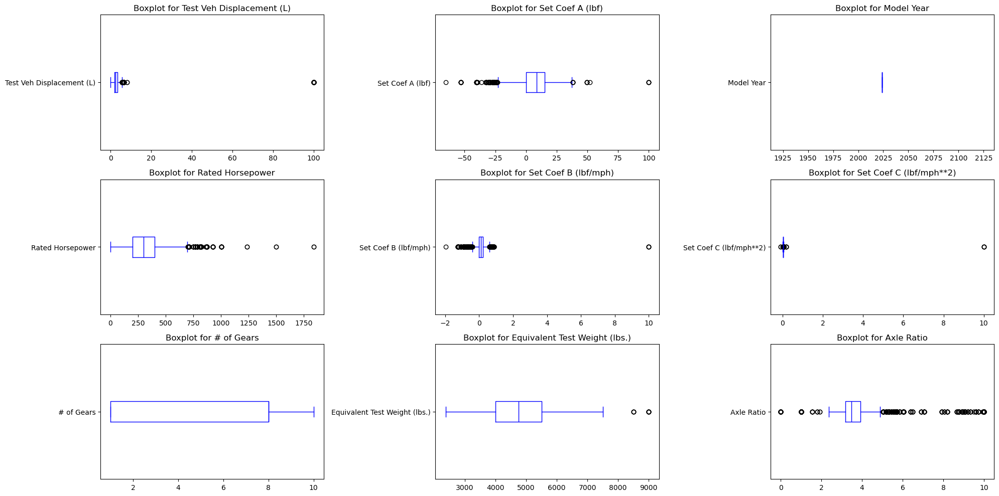

In [18]:
# Assuming 'df' is the original DataFrame containing the data
# List of relevant columns to check for outliers
# These columns include key numerical attributes like vehicle displacement, horsepower, test weight, and others.
relevant_columns = [
    "Test Veh Displacement (L)", "Set Coef A (lbf)", "Model Year", 
    "Rated Horsepower", "Set Coef B (lbf/mph)", "Set Coef C (lbf/mph**2)", 
    "# of Gears", "Equivalent Test Weight (lbs.)", "Axle Ratio"
]

# Function to detect outliers using the Interquartile Range (IQR) method
# The IQR method identifies outliers as values that lie beyond 1.5 times the IQR from the first or third quartile.
def detect_outliers_iqr(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)  # Calculate the first quartile
    Q3 = dataframe[column].quantile(0.75)  # Calculate the third quartile
    IQR = Q3 - Q1  # Calculate the interquartile range
    lower_bound = Q1 - 1.5 * IQR  # Calculate the lower bound for outliers
    upper_bound = Q3 + 1.5 * IQR  # Calculate the upper bound for outliers
    outliers = dataframe[(dataframe[column] < lower_bound) | (dataframe[column] > upper_bound)]  # Identify outliers
    return outliers

# Dictionary to store outliers for each relevant column
# The outliers for each column are stored in this dictionary with the column name as the key.
outliers_dict = {}

# Detect outliers for each column and store them in the dictionary
# Loop through the 'relevant_columns' and detect outliers for each, storing the results in 'outliers_dict'.
for column in relevant_columns:
    outliers_dict[column] = detect_outliers_iqr(df, column)

# Combine all outliers into a single DataFrame, removing duplicates
# This combines the outliers detected across all columns and removes duplicate entries.
all_outliers = pd.concat(outliers_dict.values()).drop_duplicates()

# Create a DataFrame without outliers
# Filter the original DataFrame to remove the rows identified as outliers.
df_no_outliers = df[~df.index.isin(all_outliers.index)]

# Visualizing outliers with boxplots for each relevant column
# This generates boxplots for each numerical column to visually assess the presence of outliers.
plt.figure(figsize=(20, 10))
for i, column in enumerate(relevant_columns, 1):
    plt.subplot(3, 3, i)  # Arrange plots in a 3x3 grid
    df[column].plot(kind='box', vert=False, color='blue')  # Create a horizontal boxplot for each column
    plt.title(f'Boxplot for {column}')  # Set the title for each subplot

# Display the number of outliers detected for each column
# For each column, print the count of outliers and display a sample of the detected outliers.
for column, outliers in outliers_dict.items():
    print(f"Number of outliers in {column}: {len(outliers)}")
    print(outliers[[column]].head(), "\n")  # Show a sample of the detected outliers

# Display the total number of unique outliers detected across all columns
print(f"\nTotal number of unique outliers detected: {len(all_outliers)}")

# Adjust the layout of the plots and display them
plt.tight_layout()  # Adjust layout to ensure all plots fit without overlap
plt.show()  # Display the boxplots


### Detecting outliers using Z Score

Number of outliers per column:
Test Veh Displacement (L)         59
Set Coef A (lbf)                  39
Model Year                         0
Rated Horsepower                  48
Set Coef B (lbf/mph)              29
Set Coef C (lbf/mph**2)            4
# of Gears                         0
Equivalent Test Weight (lbs.)     12
Axle Ratio                       181
dtype: int64


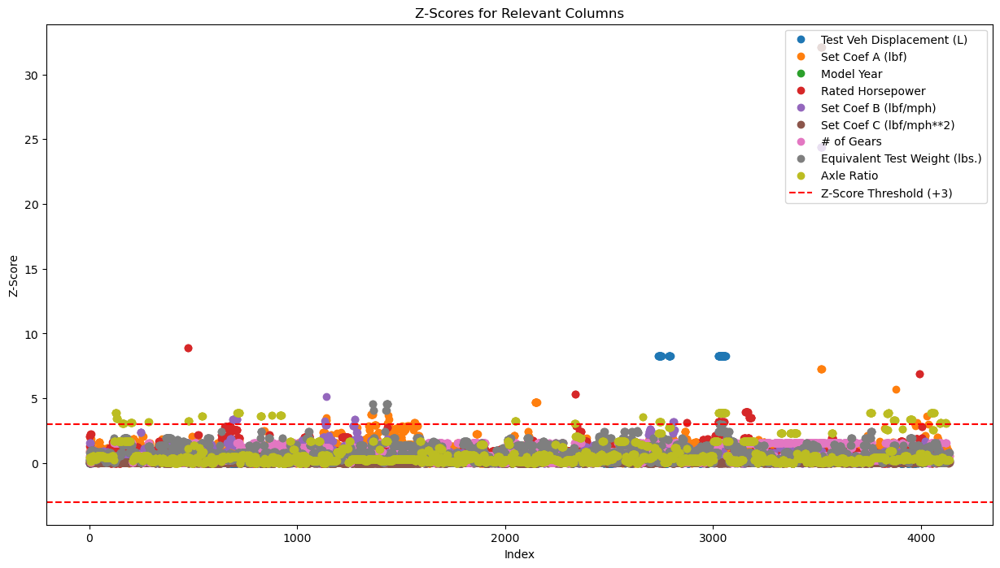

In [19]:
def remove_outliers_z_score(dataframe, outlier_columns, threshold=3):
    """
    Remove outliers from the DataFrame using the Z-Score method and store them in a new DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The DataFrame containing the data.
    outlier_columns (list): List of columns to check for outliers.
    threshold (float): Z-score threshold for detecting outliers (default is 3).

    Returns:
    pd.DataFrame: DataFrame without outliers.
    pd.Series: Series with the number of outliers detected per column.
    """
    # Calculate Z-scores for the specified columns
    # Z-scores measure how far each data point is from the mean in terms of standard deviations.
    z_scores = np.abs((dataframe[outlier_columns] - dataframe[outlier_columns].mean()) / dataframe[outlier_columns].std())

    # Identify outliers based on the threshold
    # Outliers are data points with a Z-score greater than the specified threshold.
    outliers = z_scores > threshold

    # Count the number of outliers per column
    outliers_per_column = outliers.sum()

    # Display the number of outliers per column
    print("Number of outliers per column:")
    print(outliers_per_column)

    # Remove rows with any outliers from the DataFrame
    # This filters out rows where any of the specified columns have outliers.
    dataframe_no_outliers = dataframe[~outliers.any(axis=1)]

    # Plotting Z-scores for all relevant columns
    plt.figure(figsize=(15, 8))

    # Plot each column's Z-scores with a unique color
    # Loop through each column and plot the Z-scores.
    for column in outlier_columns:
        plt.plot(z_scores[column], label=f'{column}', marker='o', linestyle='')

    # Add horizontal lines to indicate the Z-score threshold
    plt.axhline(y=threshold, color='red', linestyle='--', label=f'Z-Score Threshold (+{threshold})')
    plt.axhline(y=-threshold, color='red', linestyle='--')

    # Add labels, title, and legend to the plot
    plt.title('Z-Scores for Relevant Columns')
    plt.xlabel('Index')
    plt.ylabel('Z-Score')
    plt.legend(loc='upper right')

    # Show the plot
    plt.show()

    # Return the DataFrame without outliers and the number of outliers per column
    return dataframe_no_outliers, outliers_per_column

# List of relevant columns to analyze for outliers
# These are the numerical columns where we want to detect and remove outliers.
outlier_columns = [
    "Test Veh Displacement (L)", "Set Coef A (lbf)", "Model Year", 
    "Rated Horsepower", "Set Coef B (lbf/mph)", "Set Coef C (lbf/mph**2)", 
    "# of Gears", "Equivalent Test Weight (lbs.)", "Axle Ratio"
]

# Assuming 'df' is your original DataFrame
# Call the function to remove outliers using Z-scores and store the cleaned DataFrame and outlier counts.
listings_no_outliers_Z, outliers_per_column = remove_outliers_z_score(df, outlier_columns)


We detected outliers using three different methods: 
* A combination of Local Outlier Factor(KNN Based), Isolation Forest (tree-based) and Robust Covariance (Mahalanobis Distance): 
We apply three outlier detection models—Local Outlier Factor (LOF), Isolation Forest, and Elliptic Envelope—on the car_markers dataset to identify outliers. Each model assumes 5% of the data are outliers, labeling points as either outlier (-1) or inlier (1). The outlier labels from all models are added to the car_markers DataFrame, converted to binary format (-1 for outliers, 0 for inliers), and the final DataFrame with these labels is displayed.
* IQR: 
It detects outliers in key numerical columns using the Interquartile Range (IQR) method. It stores outliers for each column in a dictionary, combines them into a single DataFrame, and removes duplicates to create a new DataFrame without outliers. Boxplots are generated to visually inspect the outliers, and the number of outliers for each column is displayed, along with a total count of unique outliers across all columns.
* Z Score: 
It removes outliers from specified numerical columns using the Z-score method, with a default threshold of 3. It calculates Z-scores to measure how far each data point deviates from the mean and identifies outliers. Rows containing outliers are removed, and the number of outliers per column is displayed. Additionally, it generates a plot of Z-scores for visual inspection. The cleaned DataFrame and outlier counts per column are returned.
 
<ins>NOTE:</ins> We used a merged dataset for outlier removal task. Removing outliers on the combined dataset across all ten years is better because it ensures consistency, as outliers are detected based on the overall distribution rather than year-specific variations. It captures trends over time, prevents misclassification of changes in data (e.g., technological shifts), and leverages a larger sample size, making outlier detection more reliable.
has context menu

## 2. Data Structure and Missing Values:
Task Description: Explore the structure of each dataset. Are there any missing values? If so, which columns have the most missing data, and how do you plan to handle them?

### Checking the structure of each dataset, calculating the percentage of missing values for each column, and storing the results for columns that have missing data

In [20]:
import pandas as pd
import datetime

# Start time
start_time = datetime.datetime.now()

# Initialize a dictionary to store missing value summaries
# This dictionary will store the percentage of missing values for each dataset (by year).
missing_values_summary = {}

# Step 1: Explore the structure and missing values for each dataset
# Loop through each DataFrame in 'input_data' to explore the structure and detect missing values.
for i, df in enumerate(input_data):
    print(f"\n=== Data Structure: {years[i]} ===")
    
    # Print data structure
    # This provides an overview of the dataset, including column names, data types, and non-null counts.
    print(df.info())  
    
    # Display the first few rows of the dataset
    # This helps inspect a sample of the data to understand its content.
    print(df.head())  
    
    # Calculate the percentage of missing values for each column
    # The missing percentage is calculated as the proportion of null values in each column, multiplied by 100.
    missing_percent = df.isnull().mean() * 100
    
    # Store missing value percentages if any column has missing values
    # Only columns with missing values are stored, and they are sorted in decreasing order of missing percentages.
    missing_values_summary[years[i]] = missing_percent[missing_percent > 0].sort_values(ascending=False)

# Step 2: Display the missing values summary for each dataset
# For each dataset (year), print a summary of the columns with missing values and their respective percentages.
print("\n=== Missing Values Summary ===")
for year, summary in missing_values_summary.items():
    print(f"\nYear: {year}")
    print(summary)

# Optional: Save the missing values summary to a CSV file for further analysis
# The missing values summary is saved as a CSV file, with the years as rows and missing value percentages as columns.
pd.DataFrame(missing_values_summary).T.to_csv("missing_values_summary.csv")

# End time
stop_time = datetime.datetime.now()

# Log the time taken to process the block
logger.info(f"Time taken to process the block: {stop_time - start_time}")



=== Data Structure: 2015 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4832 entries, 0 to 4831
Data columns (total 68 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Model Year                      4832 non-null   int64  
 1   Vehicle Manufacturer Name       4832 non-null   object 
 2   Veh Mfr Code                    4832 non-null   object 
 3   Represented Test Veh Make       4832 non-null   object 
 4   Represented Test Veh Model      4832 non-null   object 
 5   Test Vehicle ID                 4832 non-null   object 
 6   Test Veh Configuration #        4832 non-null   int64  
 7   Test Veh Displacement (L)       4832 non-null   float64
 8   Actual Tested Testgroup         4832 non-null   object 
 9   Vehicle Type                    4832 non-null   object 
 10  Rated Horsepower                4832 non-null   int64  
 11  # of Cylinders and Rotors       4666 non-null   float64
 12  Engi

2024-11-05 13:30:46 - INFO - Time taken to process the block: 0:00:00.872042


Engine Code                          24
RND_ADJ_FE                          601
# of Cylinders and Rotors          2376
Aftertreatment Device Desc         2444
Aftertreatment Device Cd           2444
CO2 (g/mi)                         2913
CO (g/mi)                          5902
THC (g/mi)                         6008
NOx (g/mi)                         6266
CH4 (g/mi)                         8816
DT-Energy Economy Rating           9389
DT-Absolute Speed Change Ratg      9389
DT-Inertia Work Ratio Rating       9389
N2O (g/mi)                        23976
FE Bag 1                          24410
FE Bag 2                          24410
FE Bag 3                          27793
PM (g/mi)                         38232
ADFE Equiv. Test Weight (lbs.)    40742
ADFE N/V Ratio                    40746
ADFE Total Road Load HP           40746
ADFE Test Number                  40746
Averaging Group ID                43686
Averaging Weighting Factor        43686
FE Bag 4                          43715


2024-11-05 13:30:51 - INFO - Time taken to process the block: 0:00:04.850983


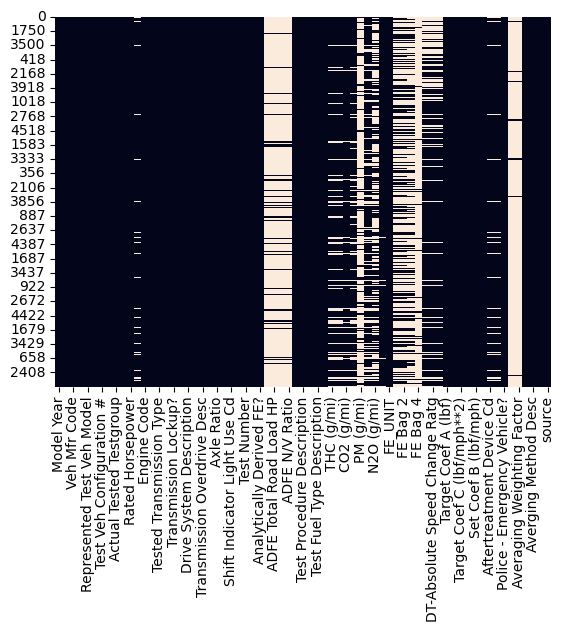

In [21]:
start_time = datetime.datetime.now()

# Step 1: Create a missing value report
# Calculate the total number of missing values in each column of the 'merged_data' DataFrame.
# Only columns with missing values are considered for the report.
missing = merged_data.isnull().sum()

# Filter columns with missing values and sort them in ascending order for easier visualization.
missingcols = missing[missing > 0]
missingcols.sort_values(inplace=True)

# Print the missing value summary, showing the number of missing values in each column.
print(missingcols)

# Step 2: Visualize missing values with bar plot
# Create a bar plot of the columns with missing values to visualize the extent of missing data.
missingcols.plot.bar()

# Step 3: Visualize missing values in the dataset with a heatmap
# Use a heatmap to show where missing values exist in the dataset. Each missing value is represented by a blank spot.
# 'cbar=False' removes the color bar from the heatmap for clarity.
sns.heatmap(merged_data.isnull(), cbar=False)

stop_time = datetime.datetime.now()

# Log the time taken to process the block
logger.info(f"Time taken to process the block: {stop_time - start_time}")


### Calculate the percentage of missing values for specific columns across datasets for each year

In [22]:
import datetime

# List of specific columns to analyze for missing values
# These columns represent particular attributes that we want to check for missing values across datasets.
specific_columns = [
    'ADFE Test Number', 'ADFE Total Road Load HP', 'ADFE Equiv. Test Weight (lbs.)',
    'ADFE N/V Ratio', 'PM (g/mi)',
    'FE Bag 4', 'Averaging Group ID', 'Averaging Weighting Factor'
]

# Initialize a dictionary to store missing value percentages for each year
# This will hold the percentage of missing values for the specified columns, organized by year.
missing_values_summary = {}

# Start time
start_time = datetime.datetime.now()

# Step 1: Calculate missing value percentages for the specific columns in each dataset
# Loop through each DataFrame in 'input_data' and calculate the percentage of missing values for the specified columns.
for i, df in enumerate(input_data):
    
    # Ensure the specific columns are present in the dataset
    # Check if the specified columns exist in the current DataFrame, as some datasets might not contain all columns.
    columns_to_check = [col for col in specific_columns if col in df.columns]
    
    # Calculate the percentage of missing values for each of the specified columns
    # The percentage is calculated as the proportion of null values in each column, multiplied by 100.
    missing_percent = df[columns_to_check].isnull().mean() * 100
    
    # Store missing value percentages in a dictionary for each year
    missing_values_summary[years[i]] = missing_percent

# Step 2: Display the missing values summary for each year
# For each dataset (year), print the missing values percentages for the specific columns of interest.
print("\n=== Missing Values Summary for Specific Attributes ===")
for year, summary in missing_values_summary.items():
    print(f"\nYear: {year}")
    print(summary)

# Optional: Save the missing values summary to a CSV file
# Save the summary of missing values as a CSV file, with years as rows and missing value percentages as columns.
pd.DataFrame(missing_values_summary).T.to_csv("specific_attributes_missing_values_summary.csv")

# End time
stop_time = datetime.datetime.now()

# Log the time taken to process the block
logger.info(f"Time taken to process the block: {stop_time - start_time}")


2024-11-05 13:30:57 - INFO - Time taken to process the block: 0:00:00.104058



=== Missing Values Summary for Specific Attributes ===

Year: 2015
ADFE Test Number                  92.032285
ADFE Total Road Load HP           92.032285
ADFE Equiv. Test Weight (lbs.)    91.990894
ADFE N/V Ratio                    92.032285
PM (g/mi)                         86.154801
FE Bag 4                          98.137417
Averaging Group ID                93.377483
Averaging Weighting Factor        93.377483
dtype: float64

Year: 2016
ADFE Test Number                  89.978495
ADFE Total Road Load HP           89.978495
ADFE Equiv. Test Weight (lbs.)    89.935484
ADFE N/V Ratio                    89.978495
PM (g/mi)                         85.956989
FE Bag 4                          97.483871
Averaging Group ID                92.322581
Averaging Weighting Factor        92.322581
dtype: float64

Year: 2017
ADFE Test Number                  87.918890
ADFE Total Road Load HP           87.918890
ADFE Equiv. Test Weight (lbs.)    87.918890
ADFE N/V Ratio                    87.91889

All of the above chosen columns have the most missing data (greater than 80%). So, we can just drop them. 

### Dropping columns with missing data > 80%

In [23]:
# Create a copy of 'merged_data' to preserve the original DataFrame
# This ensures that any modifications we make to the DataFrame (such as dropping columns) do not affect the original data.
merged_data_missing_dropped = merged_data.copy()

# Drop the specified columns (those in 'specific_columns') from the DataFrame
# This removes the specific attributes from the 'merged_data' DataFrame that are being analyzed for missing values.
merged_data_missing_dropped = merged_data_missing_dropped.drop(specific_columns, axis=1)

# Print a message indicating the completion of column removal and display the first few rows of the updated DataFrame
# This allows us to inspect the DataFrame after the columns have been dropped to ensure the operation was successful.
print("After Dropping:")
merged_data_missing_dropped.head()


After Dropping:


,Model Year,Vehicle Manufacturer Name,Veh Mfr Code,Represented Test Veh Make,Represented Test Veh Model,Test Vehicle ID,Test Veh Configuration #,Test Veh Displacement (L),Actual Tested Testgroup,Vehicle Type,...,Set Coef A (lbf),Set Coef B (lbf/mph),Set Coef C (lbf/mph**2),Aftertreatment Device Cd,Aftertreatment Device Desc,Police - Emergency Vehicle?,Averaging Method Cd,Averging Method Desc,Year,source
0,2015,aston martin,ASX,Aston Martin,DB9,143TT1042,0,5.9,DASXV05.9VH1,Car,...,8.350,0.2990,0.0192,TWC,Three-way catalyst,N,N,No averaging,2015,File_1
1,2015,aston martin,ASX,Aston Martin,DB9,143TT1042,0,5.9,DASXV05.9VH1,Car,...,8.350,0.2990,0.0192,TWC,Three-way catalyst,N,N,No averaging,2015,File_1
2,2015,aston martin,ASX,Aston Martin,Rapide S,410TT4202,0,6.0,FASXV06.0VHB,Car,...,1.093,2.1980,0.0280,TWC,Three-way catalyst,N,N,No averaging,2015,File_1
3,2015,aston martin,ASX,Aston Martin,Rapide S,410TT4202,0,6.0,FASXV06.0VHB,Car,...,1.093,2.1980,0.0280,TWC,Three-way catalyst,N,N,No averaging,2015,File_1
4,2015,aston martin,ASX,Aston Martin,V12 Vantage S,288TT2087,0,6.0,FASXV06.0VHB,Car,...,17.420,0.4063,0.0186,TWC,Three-way catalyst,N,N,No averaging,2015,File_1


### MICE Imputation for Car Markers Data
- Copy numerical columns from `merged_data_missing_dropped` to `car_markers2`.
- Use MICE (Multivariate Imputation by Chained Equations) to impute missing values.
- Fit an `IterativeImputer` model to estimate and replace missing values in the numerical dataset.
- Impute missing values, convert the result back to a DataFrame, and verify that all missing values are filled.


In [24]:
# Step 1: Filter the DataFrame to include only numerical columns
# We create 'car_markers2' by selecting only numerical columns from 'merged_data_missing_dropped', 
# as the imputation techniques are applied only to numerical data.
car_markers2 = merged_data_missing_dropped.select_dtypes(include=['number']).copy()

# Display the first few rows of the numerical data for inspection
car_markers2.head()

# -----------------------------------------------------------------------------
# Technique 1: MICE - Multivariate Imputation by Chained Equations
# MICE is a robust technique that models each missing value based on other variables in the dataset.
# It performs multiple imputations iteratively, making use of relationships between features.
# -----------------------------------------------------------------------------

from sklearn.experimental import enable_iterative_imputer  # Required to enable MICE
from sklearn.impute import IterativeImputer

# Step 2: Create an instance of the IterativeImputer class
# 'max_iter=10' specifies the maximum number of iterations to perform, and 'random_state=0' ensures reproducibility.
mice_imputer = IterativeImputer(max_iter=10, random_state=0)

# Step 3: Fit the imputer on the numerical data
# This step calculates the necessary statistics and relationships to impute missing values.
mice_imputer.fit(car_markers2)

# Step 4: Impute the missing data
# The 'transform' method fills in the missing values using the trained imputer model.
car_markers_imputed = mice_imputer.transform(car_markers2)

# Step 5: Convert the imputed data into a DataFrame
# The imputed data is returned as a numpy array, so we convert it back into a DataFrame with the original column names.
car_markers_imputed = pd.DataFrame(car_markers_imputed, columns=car_markers2.columns)

# Step 6: Check for missing values in the original and imputed data
# These checks verify that the original data contained missing values and that the imputed data has no missing values left.
print(car_markers2.isnull().sum().sum())  # Prints the total number of missing values in the original data
print(car_markers_imputed.isnull().sum().sum())  # Prints the total number of missing values in the imputed data (should be 0)


C:\Users\vpkul\anaconda3\envs\CS6140\Lib\site-packages\sklearn\impute\_iterative.py:825: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


161638
0


In [25]:
# -----------------------------------------------------------------------------
# Compare the original and imputed data based on MICE using basic statistics
# -----------------------------------------------------------------------------

# Display the descriptive statistics for the original data before imputation
# 'describe().T' provides a summary of basic statistics (mean, std, min, max, etc.) for each numerical column,
# and '.T' transposes the result to make the statistics easier to read by showing columns as rows.
print(car_markers2.describe().T)

# Display the descriptive statistics for the imputed data after MICE imputation
# This allows us to compare how the basic statistics (mean, std, min, max, etc.) have changed as a result of imputation.
car_markers_imputed.describe().T


                                 count         mean         std         min  \
Model Year                     45479.0  2019.392555    2.865135  2015.00000   
Test Veh Configuration #       45479.0     1.176169    2.028842     0.00000   
Test Veh Displacement (L)      45479.0     3.390352    7.182849     0.00100   
Rated Horsepower               45479.0   298.049188  151.481306     1.00000   
# of Cylinders and Rotors      43103.0     5.423381    1.797848     2.00000   
# of Gears                     45479.0     6.281119    2.717309     1.00000   
Transmission Overdrive Code    45479.0     1.951538    0.214743     1.00000   
Equivalent Test Weight (lbs.)  45479.0  4396.410981  858.872627  2125.00000   
Axle Ratio                     45479.0     3.616840    1.154017     0.00000   
N/V Ratio                      45479.0    32.950513   46.049127     0.00000   
Shift Indicator Light Use Cd   45479.0     1.091295    0.501393     1.00000   
Test Procedure Cd              45479.0    26.024429 

,count,mean,std,min,25%,50%,75%,max
Model Year,45479.0,2019.392555,2.865135,2015.000000,2017.000000,2019.000000,2022.000000,2024.000000
Test Veh Configuration #,45479.0,1.176169,2.028842,0.000000,0.000000,0.000000,1.000000,25.000000
Test Veh Displacement (L),45479.0,3.390352,7.182849,0.001000,2.000000,2.500000,3.500000,99.999000
Rated Horsepower,45479.0,298.049188,151.481306,1.000000,183.000000,275.000000,362.000000,1839.000000
# of Cylinders and Rotors,45479.0,5.872333,7.352753,0.921482,4.000000,4.000000,6.000000,110.632687
# of Gears,45479.0,6.281119,2.717309,1.000000,6.000000,7.000000,8.000000,10.000000
Transmission Overdrive Code,45479.0,1.951538,0.214743,1.000000,2.000000,2.000000,2.000000,2.000000
Equivalent Test Weight (lbs.),45479.0,4396.410981,858.872627,2125.000000,3750.000000,4250.000000,5000.000000,9000.000000
Axle Ratio,45479.0,3.616840,1.154017,0.000000,3.140000,3.420000,3.770000,9.990000
N/V Ratio,45479.0,32.950513,46.049127,0.000000,24.300000,26.900000,31.200000,999.900000


# KNN Imputation for Missing Data
- Use KNN Imputation to fill missing values by averaging the 5 nearest neighbors.
- Fit the `KNNImputer` to the numerical data and transform it to impute missing values.
- Convert the imputed data back into a DataFrame and check for any remaining missing values.
- Compare descriptive statistics between the original and KNN-imputed data.


In [26]:
# -----------------------------------------------------------------------------
# Technique 2: K-Nearest Neighbors (KNN) Imputation
# KNN imputation replaces missing values by using the mean of the 'k' nearest neighbors for each missing value.
# In this case, we use 5 nearest neighbors to impute the missing values.
# -----------------------------------------------------------------------------

from sklearn.impute import KNNImputer

# Step 1: Create an instance of the KNNImputer class
# 'n_neighbors=5' specifies that the imputation will be based on the 5 nearest neighbors.
knn_imputer = KNNImputer(n_neighbors=5)

# Step 2: Fit the imputer on the original data
# This step learns the relationships between the columns based on the nearest neighbors.
knn_imputer.fit(car_markers2)

# Step 3: Impute the missing data
# The 'transform' method fills in the missing values using the learned relationships from the nearest neighbors.
car_markers2_imputed_knn = knn_imputer.transform(car_markers2)

# Step 4: Convert the imputed data into a DataFrame
# The imputed data is returned as a numpy array, so we convert it back into a DataFrame with the original column names.
car_markers2_imputed_knn = pd.DataFrame(car_markers2_imputed_knn, columns=car_markers2.columns)

# Step 5: Check for missing values in the original and imputed data
# These checks verify that the original data contained missing values and that the imputed data has no missing values left.
print(car_markers2.isnull().sum().sum())  # Prints the total number of missing values in the original data
print(car_markers2_imputed_knn.isnull().sum().sum())  # Prints the total number of missing values in the imputed data (should be 0)

# -----------------------------------------------------------------------------
# Compare the original and imputed data based on KNN Imputation using basic statistics
# -----------------------------------------------------------------------------

# Display the descriptive statistics for the original data before KNN imputation
print(car_markers2.describe().T)

# Display the descriptive statistics for the imputed data after KNN imputation
# This allows us to compare how the basic statistics (mean, std, min, max, etc.) have changed as a result of imputation.
car_markers2_imputed_knn.describe().T


161638
0
                                 count         mean         std         min  \
Model Year                     45479.0  2019.392555    2.865135  2015.00000   
Test Veh Configuration #       45479.0     1.176169    2.028842     0.00000   
Test Veh Displacement (L)      45479.0     3.390352    7.182849     0.00100   
Rated Horsepower               45479.0   298.049188  151.481306     1.00000   
# of Cylinders and Rotors      43103.0     5.423381    1.797848     2.00000   
# of Gears                     45479.0     6.281119    2.717309     1.00000   
Transmission Overdrive Code    45479.0     1.951538    0.214743     1.00000   
Equivalent Test Weight (lbs.)  45479.0  4396.410981  858.872627  2125.00000   
Axle Ratio                     45479.0     3.616840    1.154017     0.00000   
N/V Ratio                      45479.0    32.950513   46.049127     0.00000   
Shift Indicator Light Use Cd   45479.0     1.091295    0.501393     1.00000   
Test Procedure Cd              45479.0    2

,count,mean,std,min,25%,50%,75%,max
Model Year,45479.0,2019.392555,2.865135,2015.00000,2017.000000,2019.000000,2022.000000,2024.000000
Test Veh Configuration #,45479.0,1.176169,2.028842,0.00000,0.000000,0.000000,1.000000,25.000000
Test Veh Displacement (L),45479.0,3.390352,7.182849,0.00100,2.000000,2.500000,3.500000,99.999000
Rated Horsepower,45479.0,298.049188,151.481306,1.00000,183.000000,275.000000,362.000000,1839.000000
# of Cylinders and Rotors,45479.0,5.442565,1.814956,2.00000,4.000000,5.000000,6.000000,16.000000
# of Gears,45479.0,6.281119,2.717309,1.00000,6.000000,7.000000,8.000000,10.000000
Transmission Overdrive Code,45479.0,1.951538,0.214743,1.00000,2.000000,2.000000,2.000000,2.000000
Equivalent Test Weight (lbs.),45479.0,4396.410981,858.872627,2125.00000,3750.000000,4250.000000,5000.000000,9000.000000
Axle Ratio,45479.0,3.616840,1.154017,0.00000,3.140000,3.420000,3.770000,9.990000
N/V Ratio,45479.0,32.950513,46.049127,0.00000,24.300000,26.900000,31.200000,999.900000


### Conclusion

> In this process, we are conducting a detailed analysis of missing values within the dataset across multiple years, evaluating the extent of missing data in various columns. Initially, we assess the structure and content of each dataset to identify columns with significant missing data. Following this, we create a report on the columns with missing values and visualize the missing patterns using bar plots and heatmaps for easier interpretation. After identifying the specific columns with missing data, we focus on the numerical columns in the dataset. We apply two different imputation techniques—MICE (Multivariate Imputation by Chained Equations) and KNN (K-Nearest Neighbors)—to impute missing values in these numerical columns. MICE models missing values based on relationships with other variables, while KNN uses the values of the nearest neighbors to fill in missing data. Finally, for columns with an overwhelming amount of missing data that would significantly affect analysis, we decide to drop them, ensuring that the remaining data is imputed using the best-suited method for accurate and reliable analysis.

## 3. Comparing Column Names Across Years:
Task Description: Compare the column names across the datasets. Are there any inconsistencies in column naming between the datasets (for example, different names for similar variables)? How would you standardize these column names to prepare the datasets for stacking?

In [27]:
import datetime
import re

start_time = datetime.datetime.now()

# Assuming 'dataframes' is a list of DataFrames, one for each year.
# Replace 'dataframes = [merged_data] * 10' with the actual list of DataFrames for each year.
dataframes = [merged_data] * 10  # Replace this with the actual list of DataFrames

# List of years corresponding to the DataFrames in the list
years = [2015 + i for i in range(len(dataframes))]

# Step 1: Function to clean column names for standardization
# This function converts column names to lowercase, removes special characters, and replaces spaces or multiple
# underscores with a single underscore for consistent formatting.
def clean_column_name(col_name):
    col_name = col_name.lower()
    col_name = re.sub(r'[^a-zA-Z0-9]', '_', col_name)  # Replace non-alphanumeric characters with underscores
    col_name = re.sub(r'_+', '_', col_name)  # Replace multiple underscores with a single one
    return col_name

# Step 2: Standardize column names in each dataset
# Loop through each DataFrame and apply the 'clean_column_name' function to standardize the column names.
standardized_dataframes = []
for df in dataframes:
    df.columns = [clean_column_name(col) for col in df.columns]
    standardized_dataframes.append(df)

# Step 3: Extract column names for each dataset (year) after standardization
# Store the column names for each dataset (by year) in a dictionary for easy comparison.
column_names = {year: set(df.columns) for year, df in zip(years, standardized_dataframes)}

# Compare column names across datasets
# Print the column names for each year, sorted for easier comparison between datasets.
print("\n=== Column Name Comparison Across Datasets ===")
for year, columns in column_names.items():
    print(f"{year}: {sorted(columns)}")

# Step 4: Identify missing or extra columns across datasets
# Get a union of all unique columns across datasets to find out the complete set of columns across all years.
all_columns = set().union(*column_names.values())

# Display all unique columns
# Print the total list of all unique columns across the datasets, sorted for easy reading.
print(f"\nAll unique columns across datasets:\n{sorted(all_columns)}")
print(f"Total unique columns: {len(all_columns)}")

# Step 5: Check if any dataset is missing columns or has extra columns
# For each year, identify columns that are missing or extra by comparing with the complete set of columns.
for year, columns in column_names.items():
    missing_columns = all_columns - columns  # Columns present in 'all_columns' but missing in this year's dataset
    extra_columns = columns - all_columns    # Columns present in this year's dataset but not in 'all_columns'
    
    if missing_columns:
        print(f"\n{year} is missing columns: {sorted(missing_columns)}")
    if extra_columns:
        print(f"{year} has extra columns: {sorted(extra_columns)}")

# Stop time and display the total time taken to process the block
stop_time = datetime.datetime.now()
print(f"\nTime taken to process the block: {stop_time - start_time}")



=== Column Name Comparison Across Datasets ===
2015: ['_of_cylinders_and_rotors', '_of_gears', 'actual_tested_testgroup', 'adfe_equiv_test_weight_lbs_', 'adfe_n_v_ratio', 'adfe_test_number', 'adfe_total_road_load_hp', 'aftertreatment_device_cd', 'aftertreatment_device_desc', 'analytically_derived_fe_', 'averaging_group_id', 'averaging_method_cd', 'averaging_weighting_factor', 'averging_method_desc', 'axle_ratio', 'ch4_g_mi_', 'co2_g_mi_', 'co_g_mi_', 'drive_system_code', 'drive_system_description', 'dt_absolute_speed_change_ratg', 'dt_energy_economy_rating', 'dt_inertia_work_ratio_rating', 'engine_code', 'equivalent_test_weight_lbs_', 'fe_bag_1', 'fe_bag_2', 'fe_bag_3', 'fe_bag_4', 'fe_unit', 'model_year', 'n2o_g_mi_', 'n_v_ratio', 'nox_g_mi_', 'pm_g_mi_', 'police_emergency_vehicle_', 'rated_horsepower', 'represented_test_veh_make', 'represented_test_veh_model', 'rnd_adj_fe', 'set_coef_a_lbf_', 'set_coef_b_lbf_mph_', 'set_coef_c_lbf_mph_2_', 'shift_indicator_light_use_cd', 'shift_indi

### Results:
>The column names across the datasets from 2015 to 2024 are consistent, with identical names for variables like actual_tested_testgroup, co2_g_mi_, and vehicle_type. All datasets share the same 69 unique columns, indicating no missing or extra columns.

### Conclusion
> Upon comparing the column names across datasets for the years 2015 to 2024, we observed the following:
* Inconsistent Naming Conventions: Some columns appear to have different names despite representing similar variables. For instance, variables like 'n_v_ratio' and 'adfe_n_v_ratio', or 'equivalent_test_weight_lbs_' and 'adfe_equiv_test_weight_lbs_' likely refer to the same attributes but have slight variations in their names. These inconsistencies can cause issues when trying to stack or merge the datasets.
* Different Levels of Detail: Certain datasets may have additional columns that don't exist in other years, such as 'fe_bag_4' in some datasets, which might represent an extra test that was not conducted in all years.
* Missing Columns: There are years that may be missing certain columns that are present in others. For example, not all years contain variables like 'pm_g_mi_' (particulate matter emissions), which might reflect changes in emission testing over the years.

## 4. Distribution of Key Variables:
Task Description: Plot the distribution of key continuous variables (such as "Test Veh Displacement (L)" over the years. How do the distributions of these variables change over time? Are there any visible trends?

### Distribution of key variables on data that hasn't been imputed

      model_year vehicle_manufacturer_name veh_mfr_code  \
0           2015              aston martin          ASX   
1           2015              aston martin          ASX   
2           2015              aston martin          ASX   
3           2015              aston martin          ASX   
4           2015              aston martin          ASX   
...          ...                       ...          ...   
4132        2024                     Volvo          VVX   
4133        2024                     Volvo          VVX   
4134        2024                     Volvo          VVX   
4135        2024                     Volvo          VVX   
4136        2024                     Volvo          VVX   

     represented_test_veh_make represented_test_veh_model test_vehicle_id  \
0                 Aston Martin                        DB9       143TT1042   
1                 Aston Martin                        DB9       143TT1042   
2                 Aston Martin                   Rapide S   

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


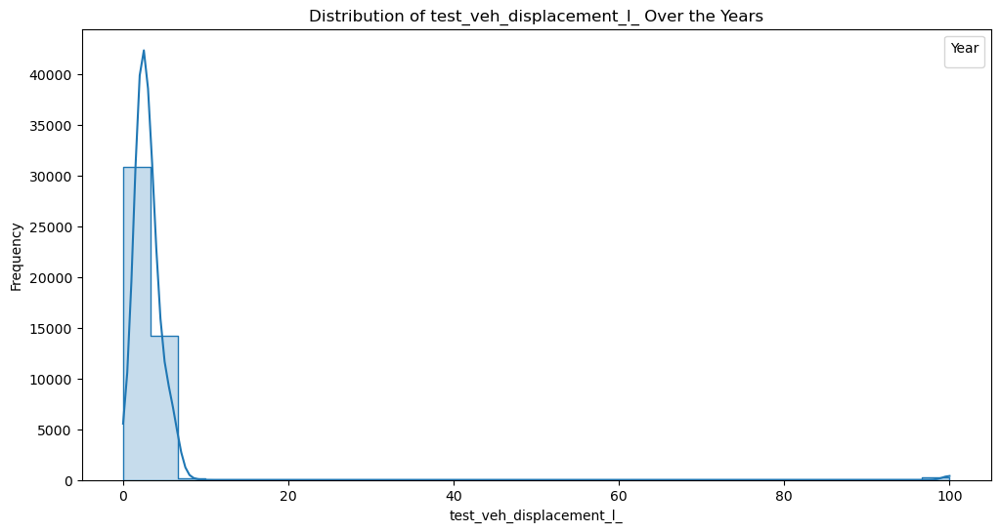

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


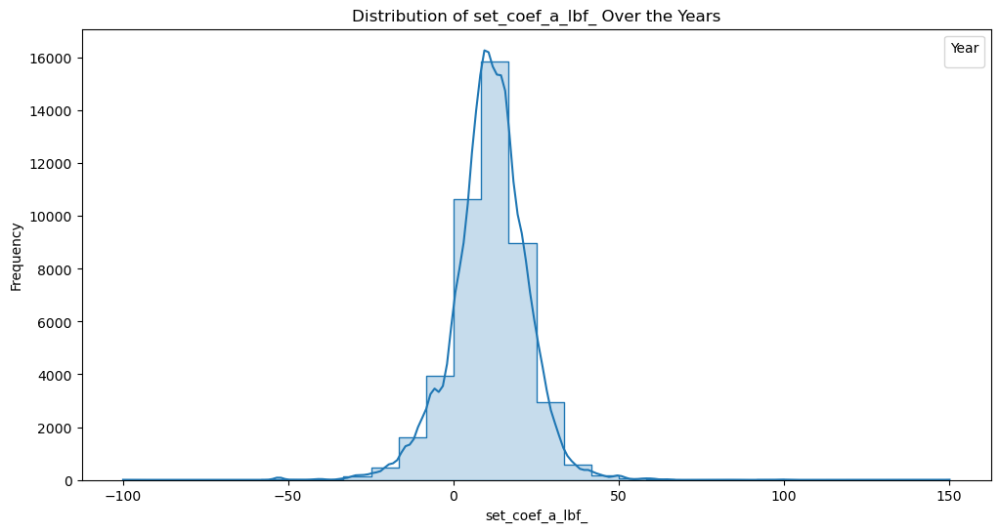

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


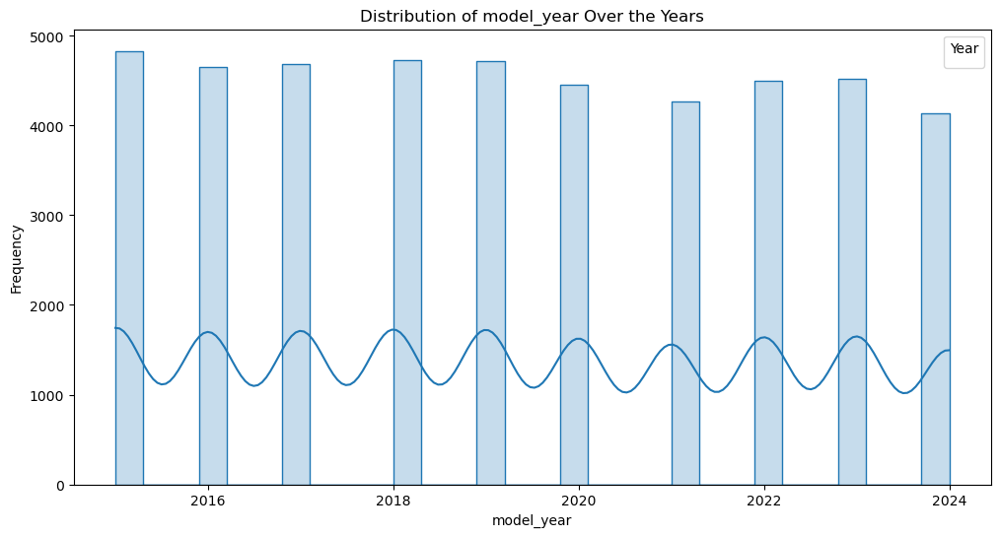

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


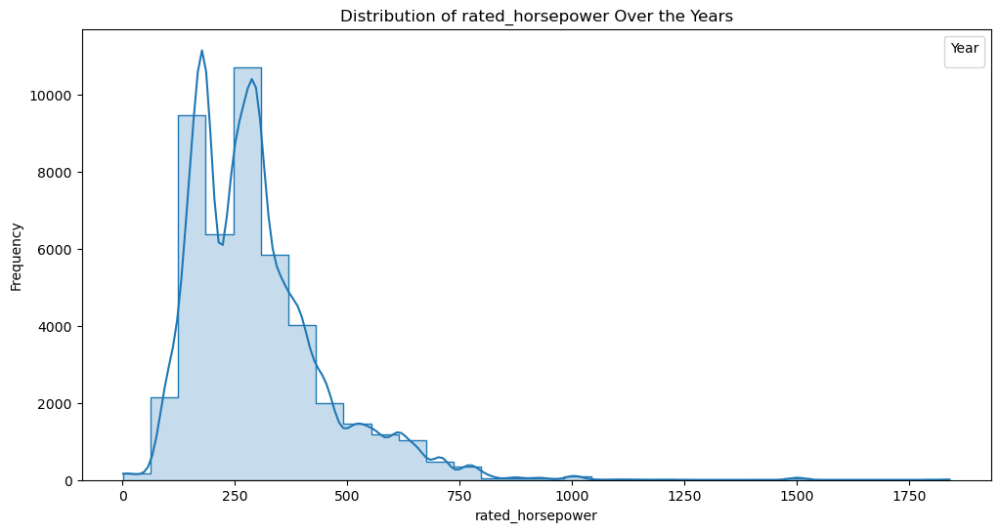

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


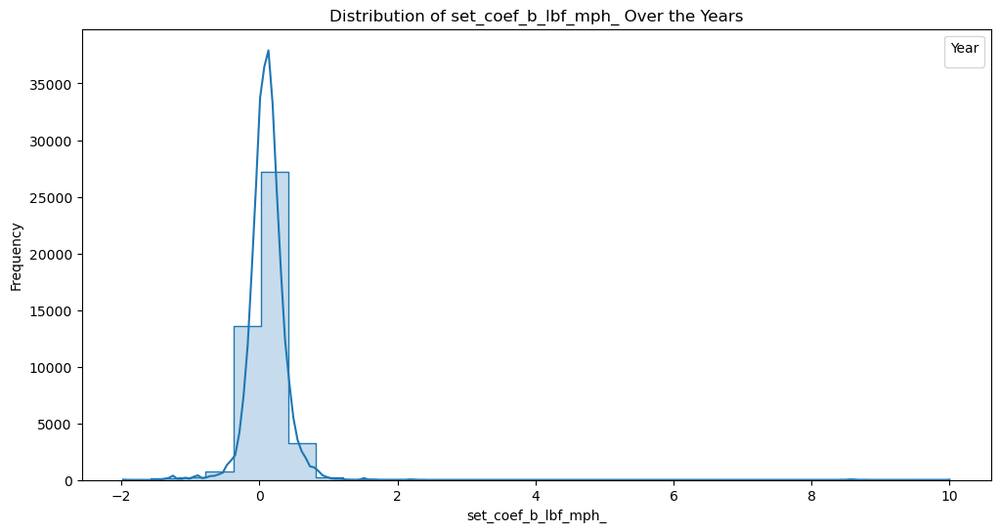

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


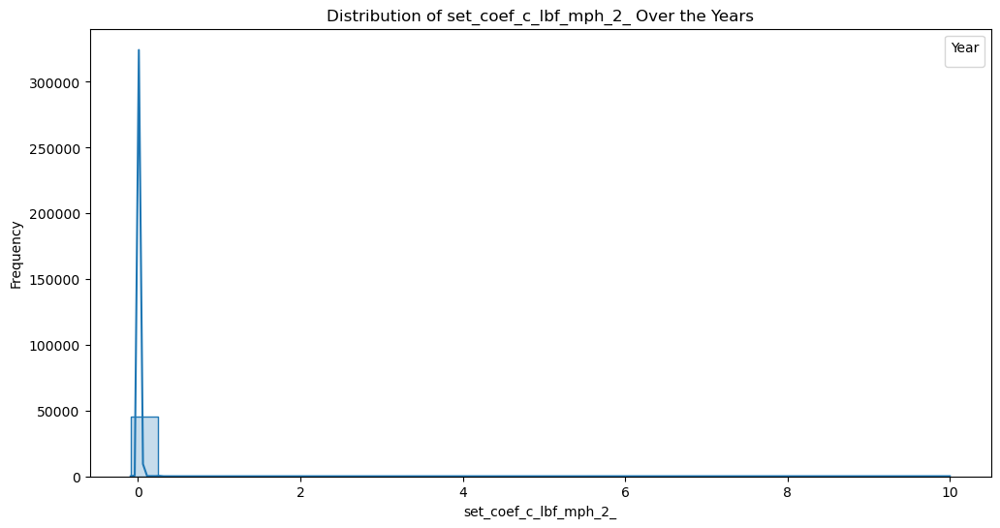

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


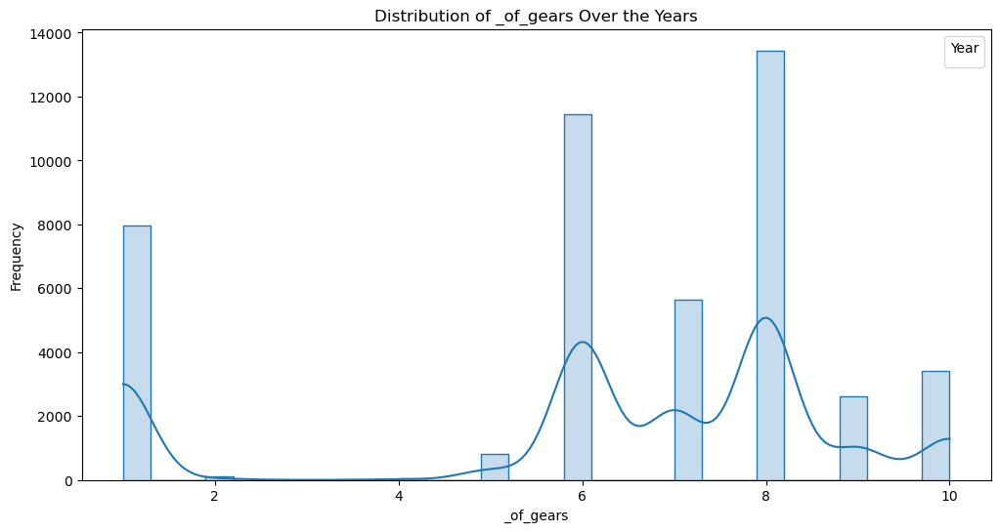

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


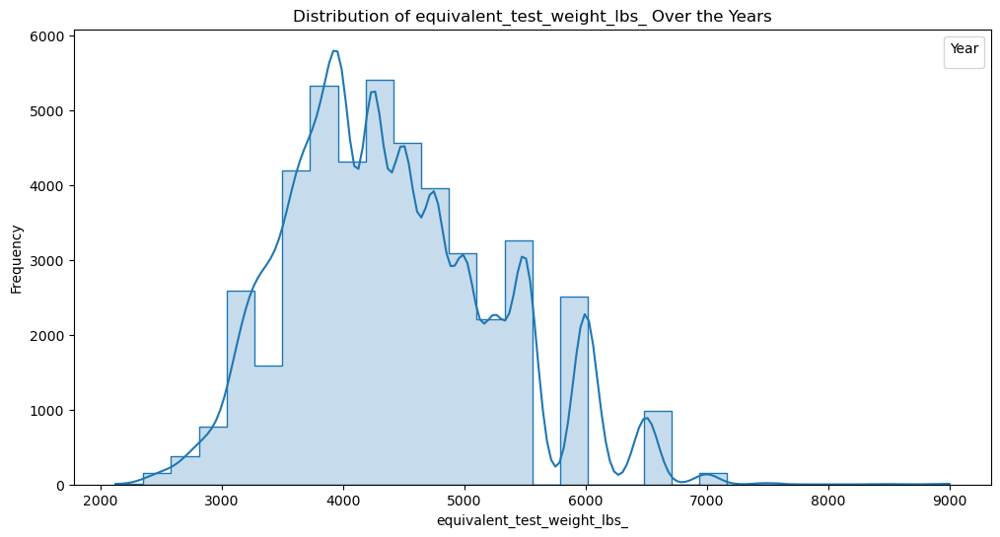

C:\Users\vpkul\AppData\Local\Temp\ipykernel_12844\341242396.py:47: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Year", loc='upper right')


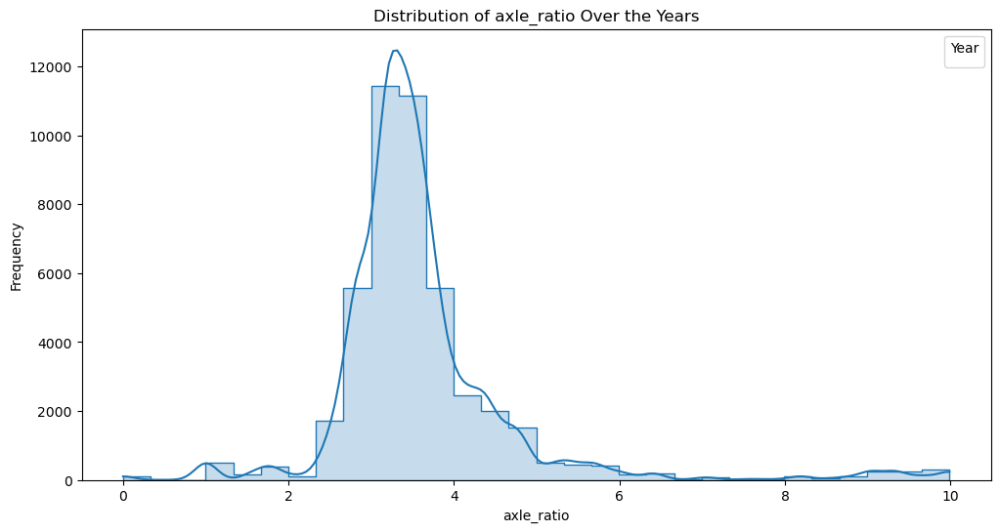

Time taken to process the block: 0:00:10.973735


In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime

start_time = datetime.datetime.now()

# Step 1: Clean numerical column names for analysis
# Convert all column names in 'num_cols' to lowercase and standardize using the 'clean_column_name' function.
num_cols = [clean_column_name(col) for col in num_cols]

# Print merged_data for inspection
print(merged_data)

# Ensure 'merged_data' is a list of DataFrames. If it's a single DataFrame, convert it into a list.
if isinstance(merged_data, pd.DataFrame):
    merged_data = [merged_data]  # Convert to list if it's a single DataFrame

# List of years corresponding to each DataFrame
years = [2015 + i for i in range(len(merged_data))]

# Step 2: Combine all DataFrames into a single DataFrame with a 'Year' column
# Each DataFrame in 'merged_data' is assigned a 'Year' column corresponding to its year, and the DataFrames are concatenated.
combined_df = pd.concat(
    [df.assign(Year=year) for df, year in zip(merged_data, years) if isinstance(df, pd.DataFrame)], 
    ignore_index=True
)

# Convert 'Year' to a categorical type
# This ensures that 'Year' is treated as a categorical variable in visualizations.
combined_df['Year'] = combined_df['Year'].astype('category')

# Step 3: Plot the distribution of each key numerical variable over the years
for variable in num_cols:
    if variable in combined_df.columns:
        plt.figure(figsize=(12, 6))
        
        # Create a histogram with KDE (Kernel Density Estimate) for each variable, grouped by year.
        sns.histplot(data=combined_df, x=variable, hue="Year", bins=30, kde=True, palette="tab10", element="step")
        
        # Add titles and labels for clarity
        plt.title(f"Distribution of {variable} Over the Years")
        plt.xlabel(variable)
        plt.ylabel("Frequency")
        
        # Add a legend to differentiate between years
        plt.legend(title="Year", loc='upper right')
        
        # Display the plot
        plt.show()
    else:
        # Print a message if the variable is not found in the DataFrame
        print(f"Variable '{variable}' not found in the dataset.")

# End time and display the total time taken to process the block
stop_time = datetime.datetime.now()
print(f"Time taken to process the block: {stop_time - start_time}")


### Distribution of key variables in processed, imputed data

Plotting distribution of test_veh_displacement_l_


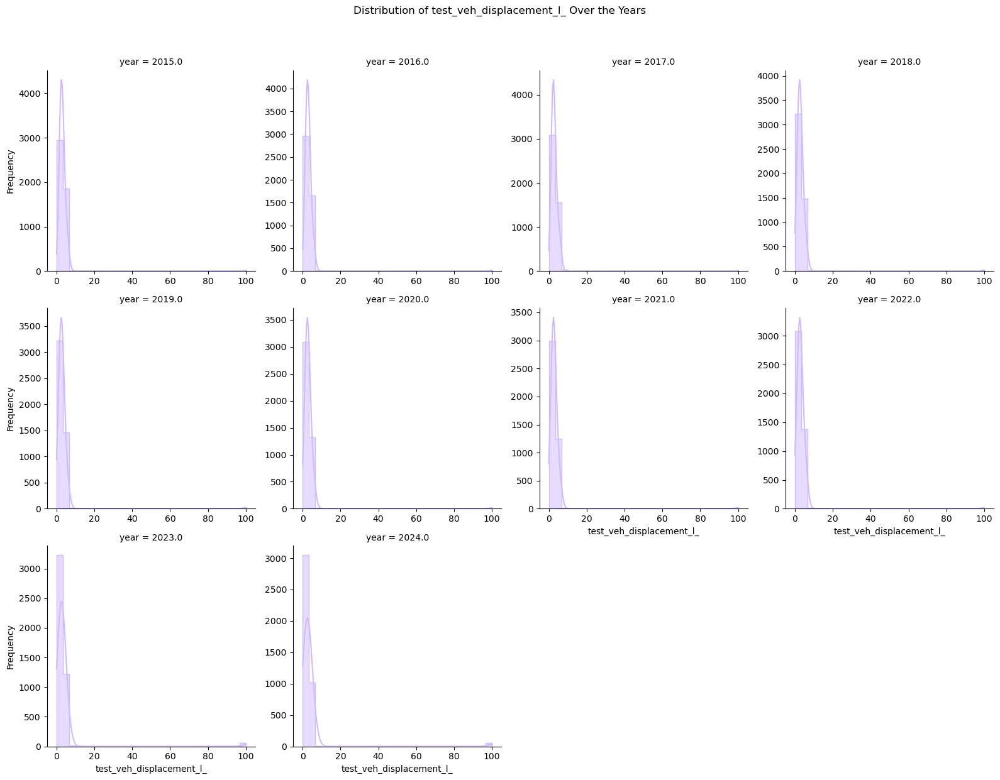

Plotting distribution of set_coef_a_lbf_


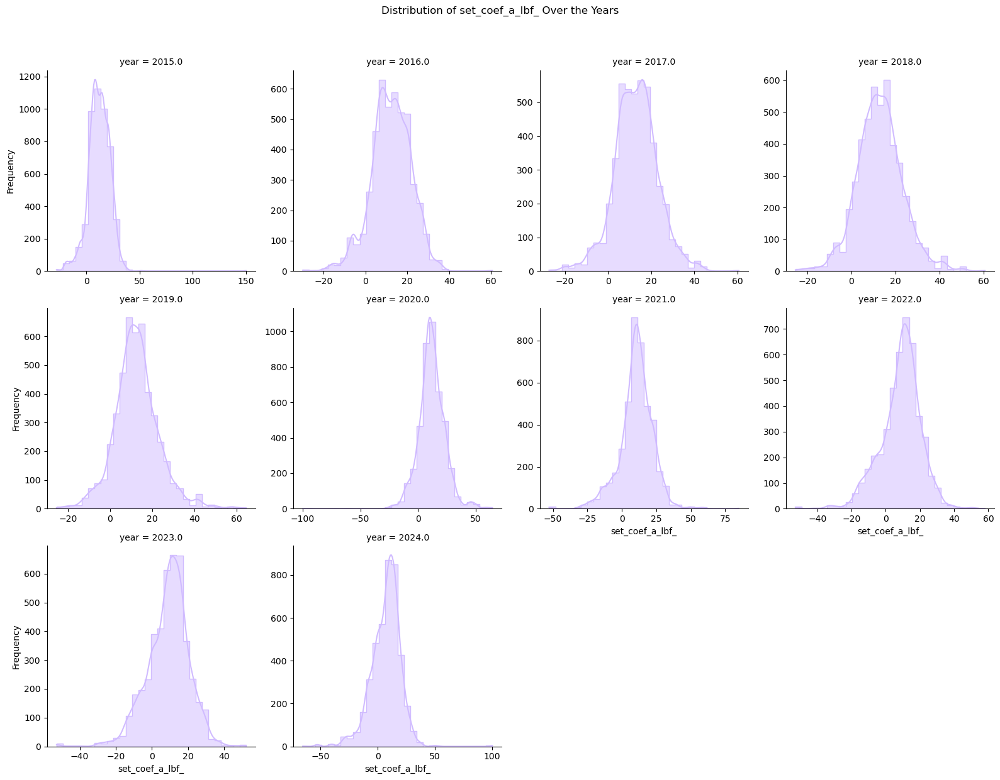

Plotting distribution of rated_horsepower


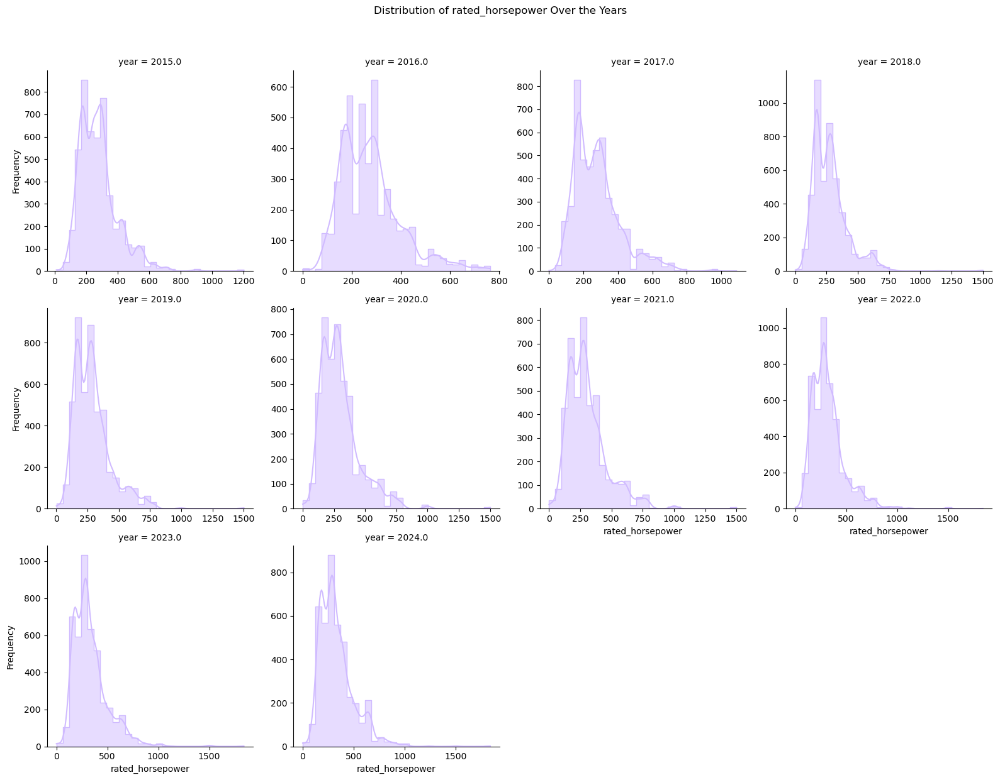

Plotting distribution of set_coef_b_lbf_mph_


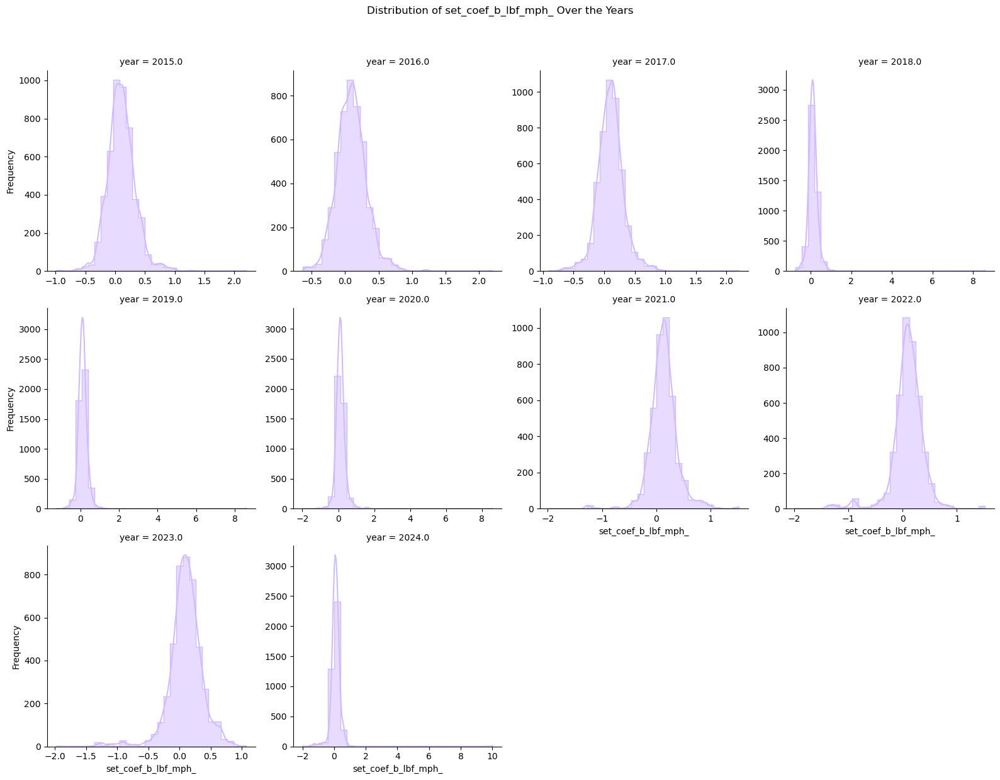

Plotting distribution of set_coef_c_lbf_mph_2_


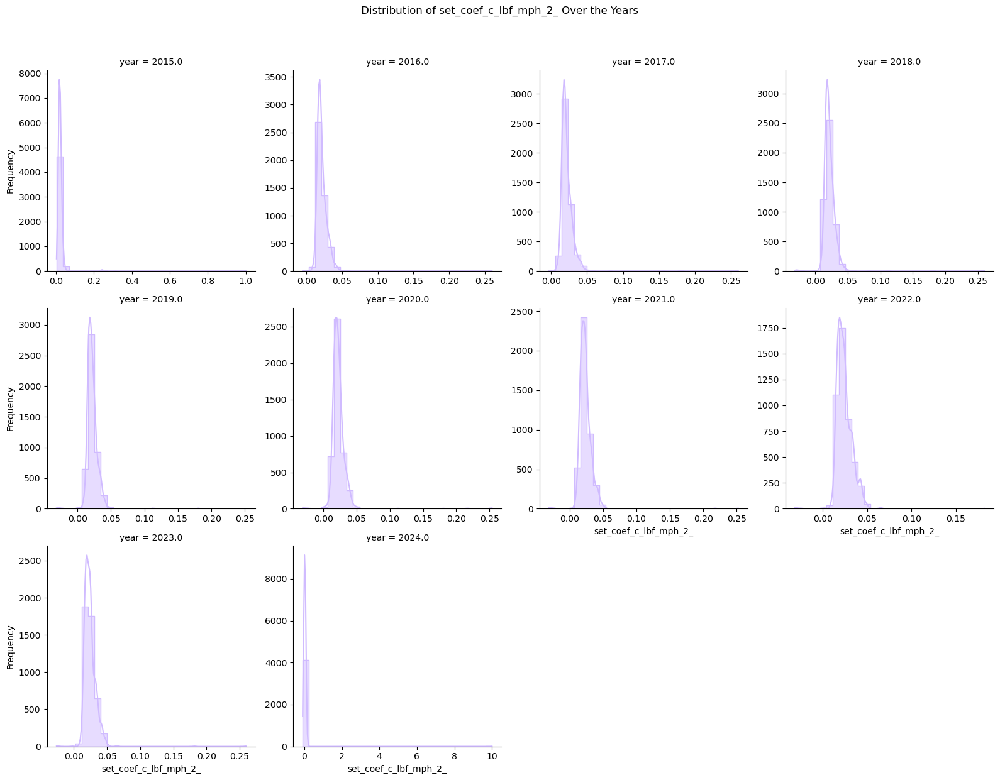

Plotting distribution of _of_gears


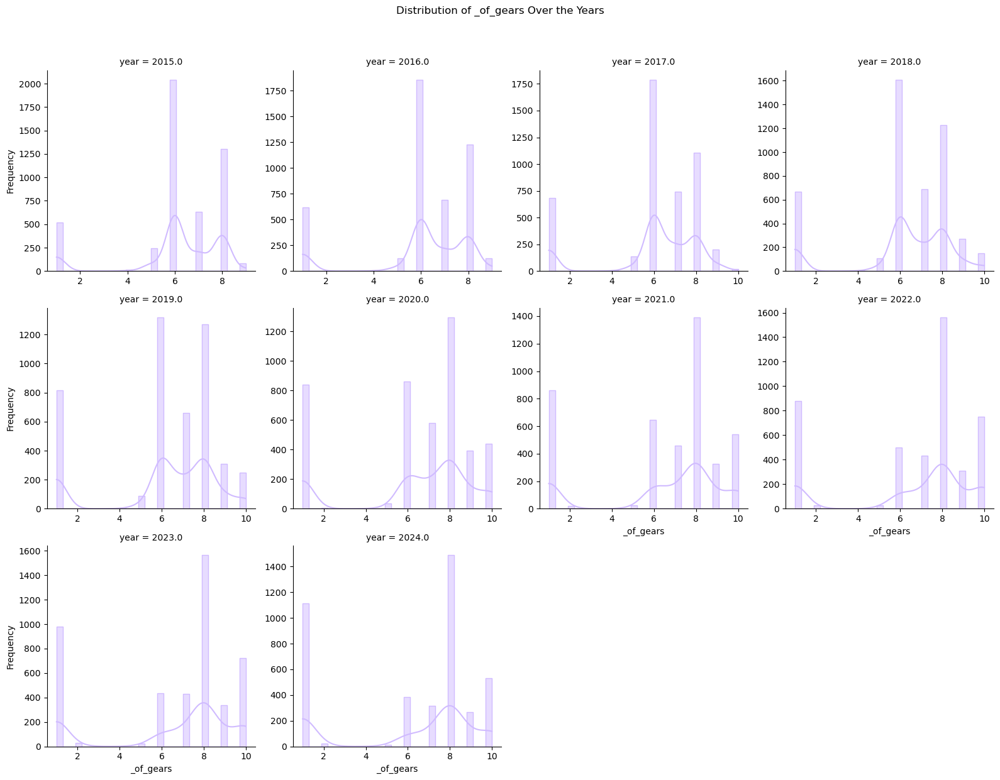

Plotting distribution of equivalent_test_weight_lbs_


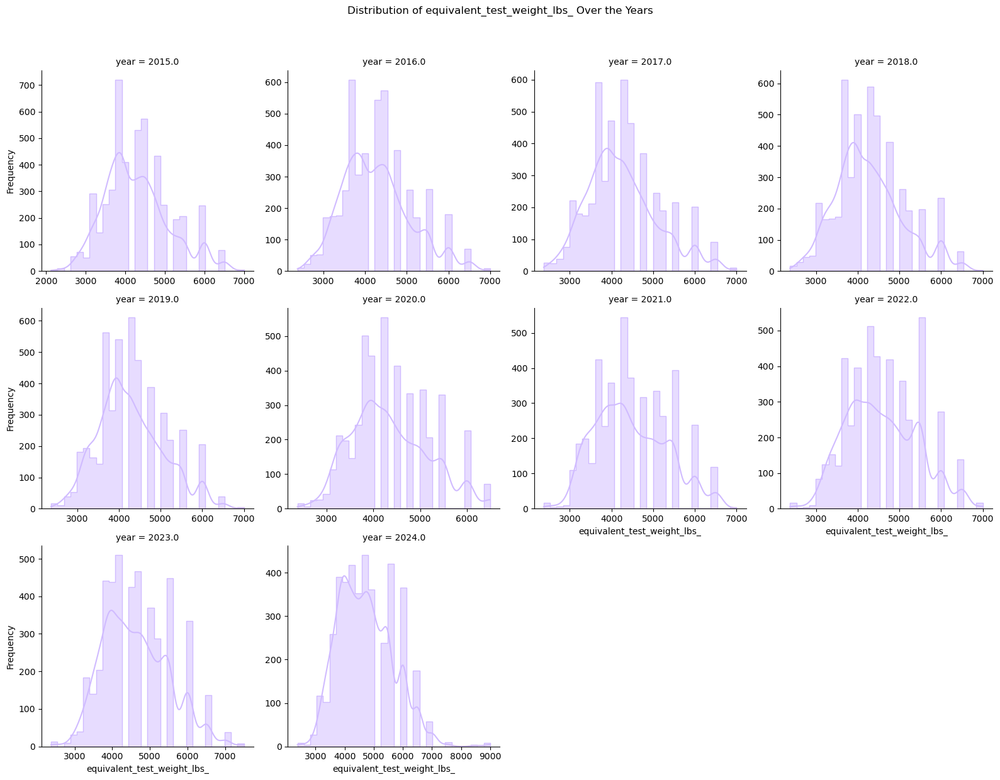

Plotting distribution of axle_ratio


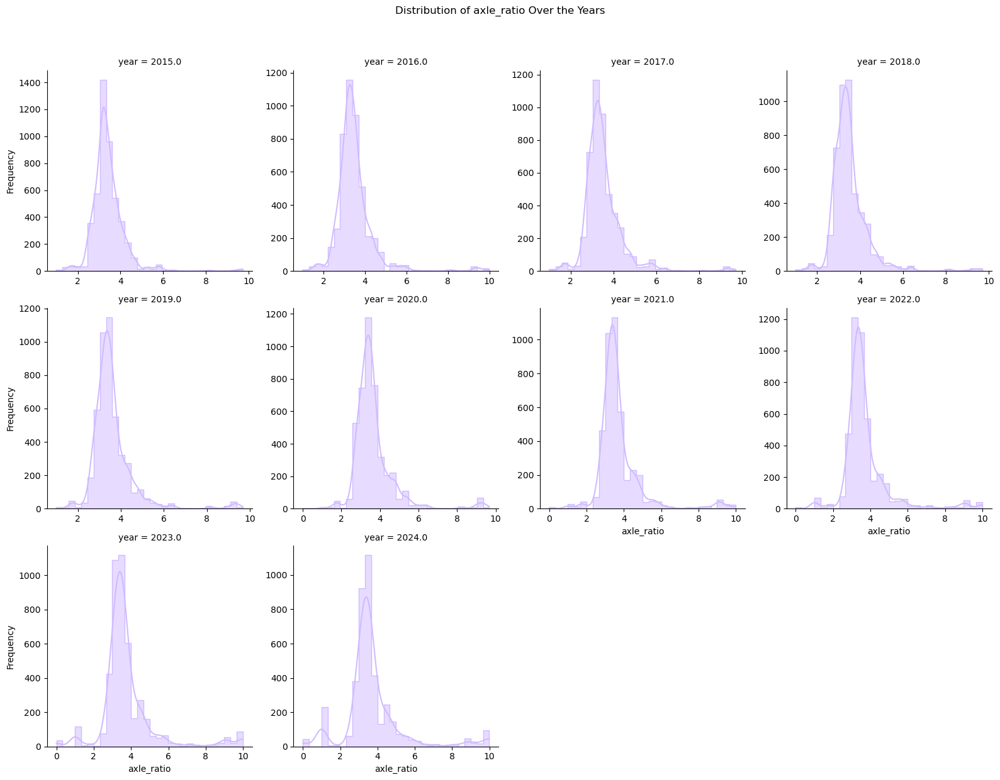

Time taken to process the block: 0:01:06.016712


In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime

start_time = datetime.datetime.now()

# Ensure num_cols are in lowercase and clean column names if necessary
num_cols = [clean_column_name(col) for col in num_cols]
# Assuming clean_column_name is a function that cleans a single column name
car_markers_imputed.columns = [clean_column_name(col) for col in car_markers_imputed.columns]
# Assuming clean_column_name is a function that cleans a single column name

# Check that the 'Year' column exists
if 'year' not in car_markers_imputed.columns:
    raise KeyError("The 'Year' column is missing from the dataset.")

# Ensure 'Year' is in a proper format (e.g., integer or category)
if car_markers_imputed['year'].dtype != 'category':
    car_markers_imputed['year'] = car_markers_imputed['year'].astype('category')

# Step 2: Plot the distribution of each key variable over the years
for variable in num_cols:
    if variable == 'model_year':
        continue

    if variable in car_markers_imputed.columns:
        
        # Debugging info: Print the variable being plotted
        print(f"Plotting distribution of {variable}")
        
        # Using FacetGrid to create multiple distributions per year
        g = sns.FacetGrid(car_markers_imputed, col="year", col_wrap=4, height=4, sharex=False, sharey=False, palette="pastel")
        g.map(sns.histplot, variable, bins=30, kde=True, element="step", color=sns.color_palette("pastel")[4])

        # Add a common title for all the subplots
        g.fig.suptitle(f"Distribution of {variable} Over the Years", y=1.03)
        
        # Add labels for individual subplots
        g.set_axis_labels(variable, "Frequency")
        
        # Display the plot
        plt.tight_layout()
        plt.show()
    else:
        print(f"Variable '{variable}' not found in the dataset.")

stop_time = datetime.datetime.now()
print(f"Time taken to process the block: {stop_time - start_time}")


### Results
> The distribution of `test_veh_displacement_l` remains largely consistent over time, with most vehicles having low displacements (below 20 liters) across all years. There is no significant shift in the core distribution, though there appears to be a slight increase in higher-displacement outliers (above 50 liters) in recent years, possibly indicating a rise in specialized or heavy-duty vehicles. Overall, vehicle engine sizes have stayed stable over time.

> The variable `set_coef_a_lbf_` remains centered around similar values over the years, with no drastic changes in its central tendency. However, the variability (spread) of the distribution changes slightly between years, and there are some noticeable outliers or extreme values in specific years, such as 2015 and 2020.

> The distribution of `rated_horsepower` remains consistent over the years, with most vehicles falling in the 200–500 horsepower range. While there is some minor variability in the distribution spread from year to year, no significant trend or shift is apparent. High horsepower vehicles remain outliers in all years.

> The distribution of `set_coef_b_lbf_mph_` remains largely stable around 0 in most years, with values tightly clustered within a narrow range. However, specific years like 2018 and 2020 show significant outliers, while others like 2019 and 2024 display shifts in the distribution's peak.


> The distribution of `set_coef_c_lbf_mph_2` remains consistent over the years, with a highly skewed distribution concentrated around 0 and a small number of outliers. There are only minor variations between years, with occasional outliers in 2015 and 2019. Overall, the variable shows stability over time.


> The `number of gears` shows a stable distribution over the years, with 6 and 8 gears being the most common configurations. However, there is a growing trend of vehicles with 10 gears in more recent years, reflecting potential advancements in transmission design. Other configurations remain less common but stable in frequency.


> The distribution of `equivalent_test_weight_lbs_` shows a bimodal pattern with peaks around 4,000 lbs and 5,000 lbs. Over time, there is a visible trend toward heavier vehicles, with more vehicles in the 5,000–7,000 lbs range being tested in recent years. However, lighter vehicles around 4,000 lbs remain a stable part of the distribution. This suggests a diverse range of vehicle weights, with a gradual increase in heavier vehicles being tested.


> The `axle ratio` distribution is right-skewed, with most vehicles clustering around the 3 to 4 axle ratio range. The distribution is relatively stable across all years, with minor variation in spread and a consistent presence of outliers. The year 2024 shows a noticeable increase in vehicles with lower axle ratios, while outliers with high axle ratios (above 6) remain rare but present throughout the years.


### Summary
* **Equivalent Test Weight (lbs)** and **Number of Gears** show the most clear and significant upward shifts.
* **Rated Horsepower** and **Axle Ratio** show some variability, with notable outliers and shifts in specific years, but not as dramatic as the first two.


## 5. Correlation Analysis:
Task Description: Perform a correlation analysis on the numeric variables in each dataset. Are there any strong correlations between certain variables, particularly those related to vehicle performance or emissions? What insights can be drawn from these correlations?

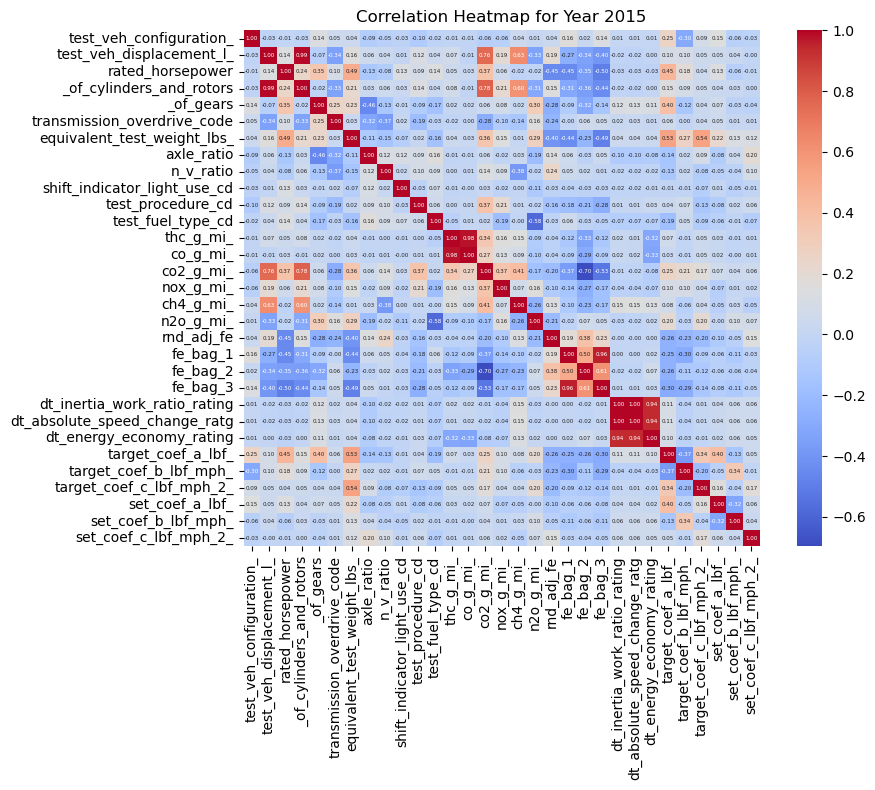

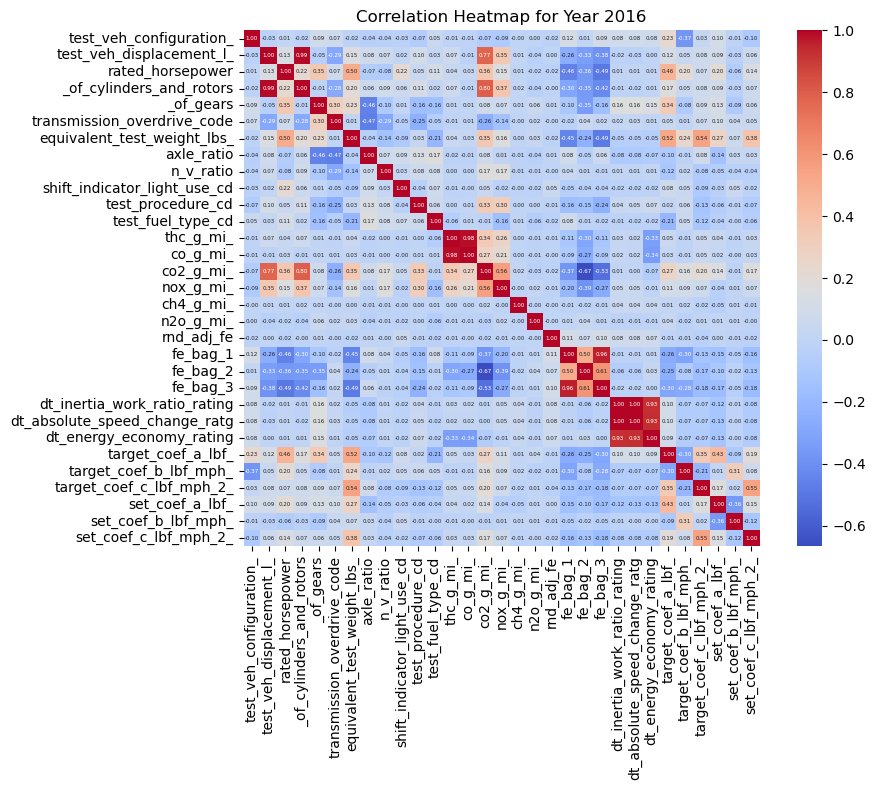

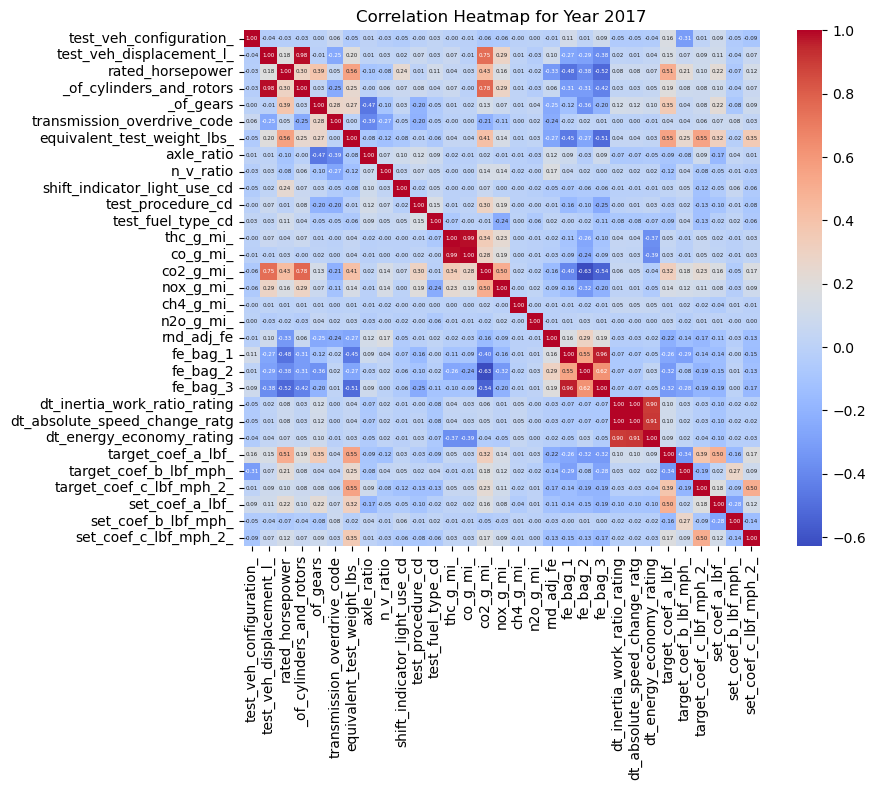

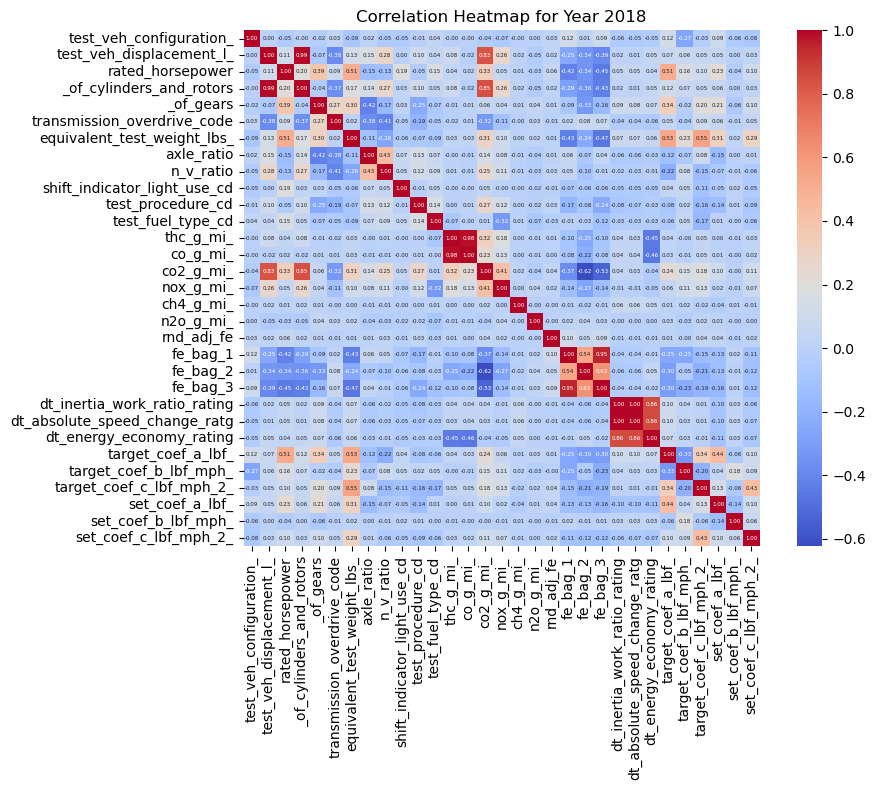

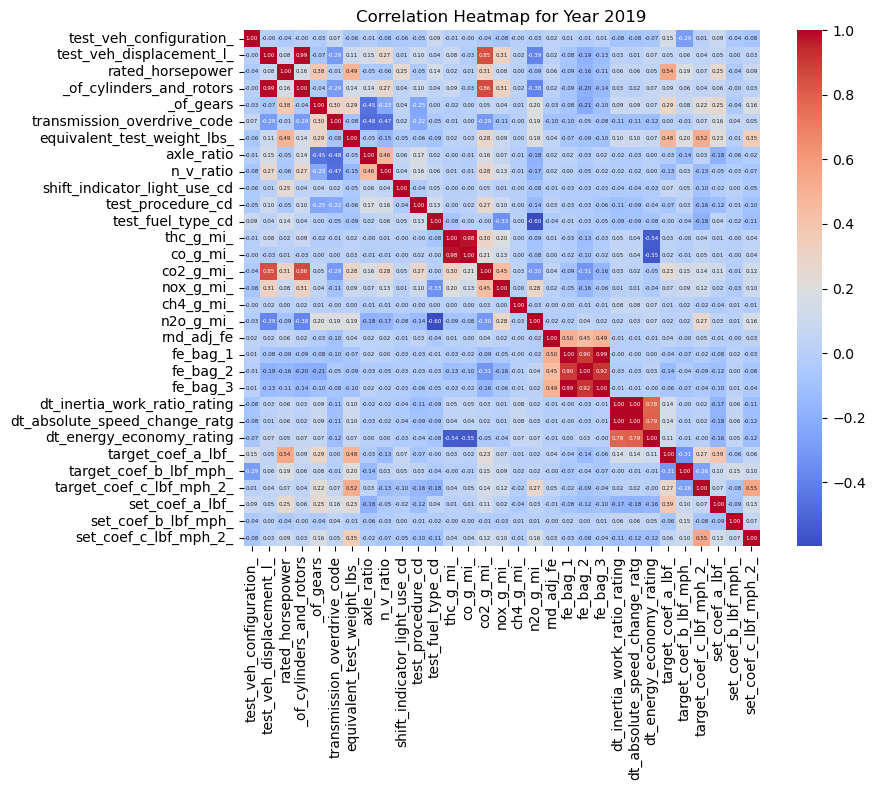

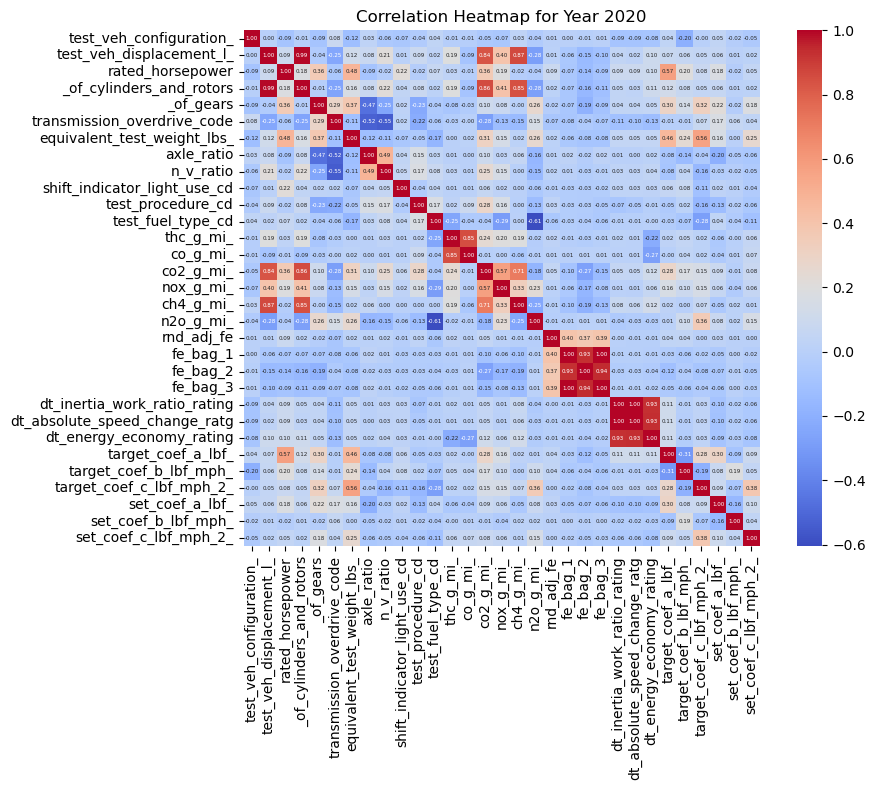

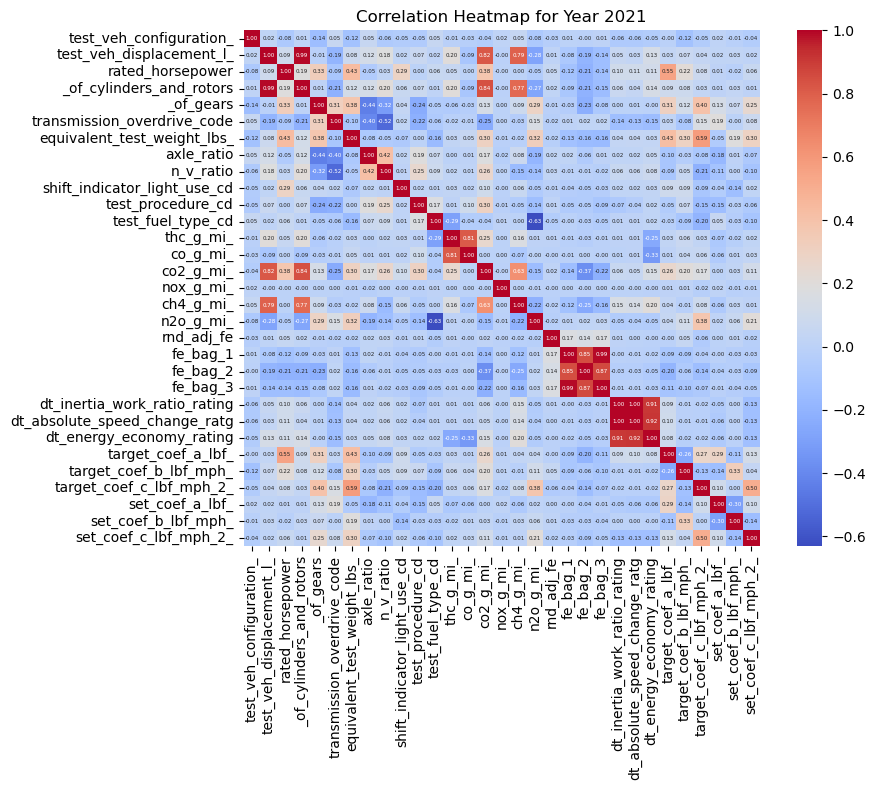

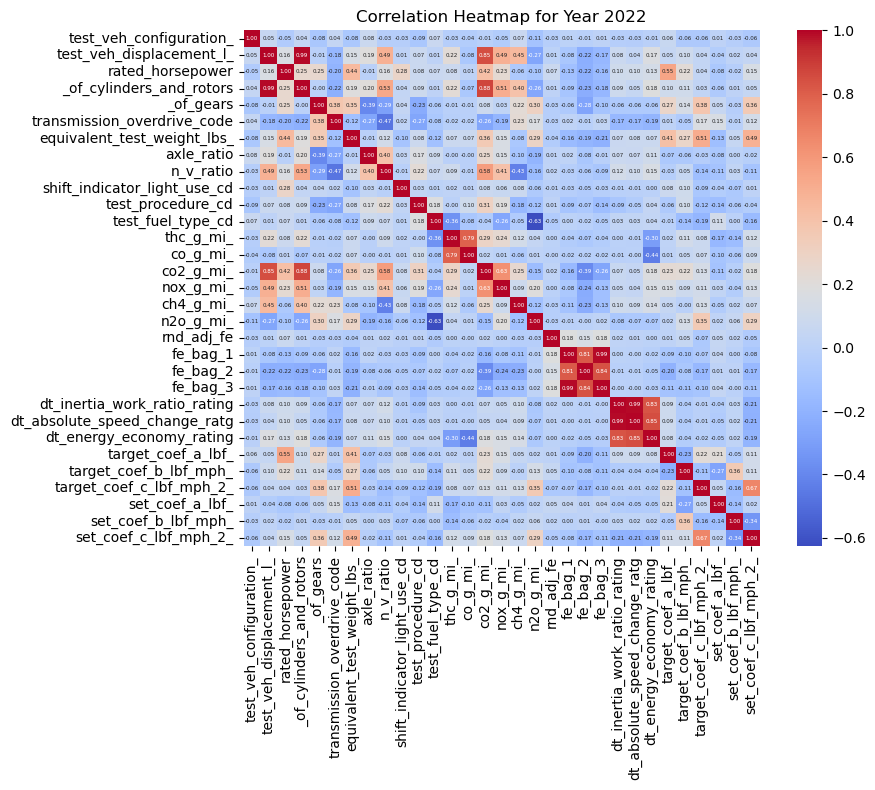

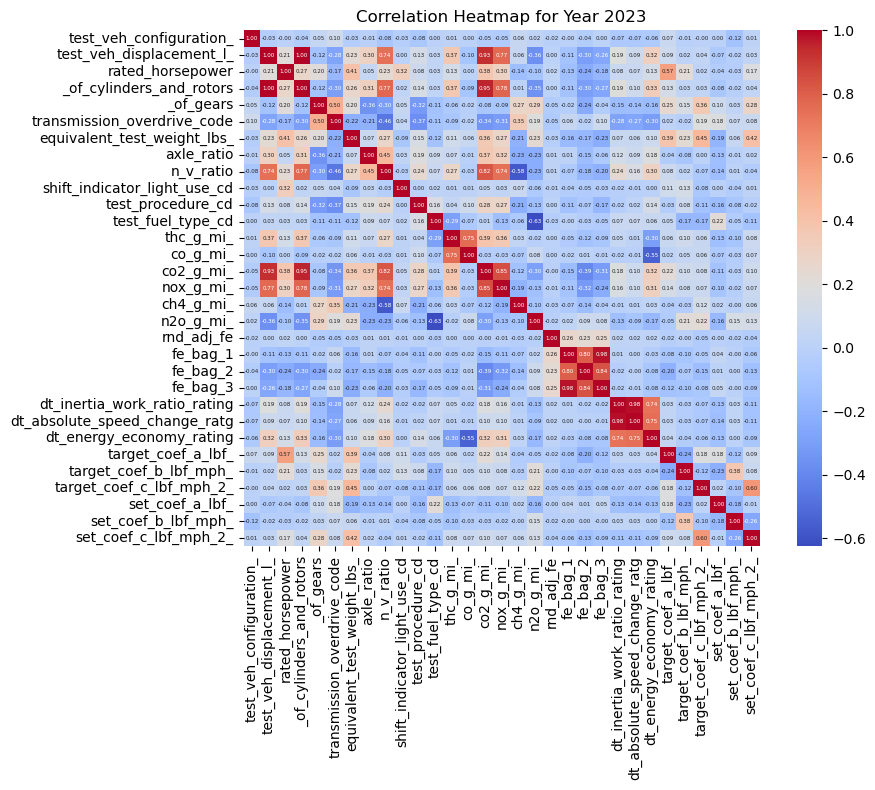

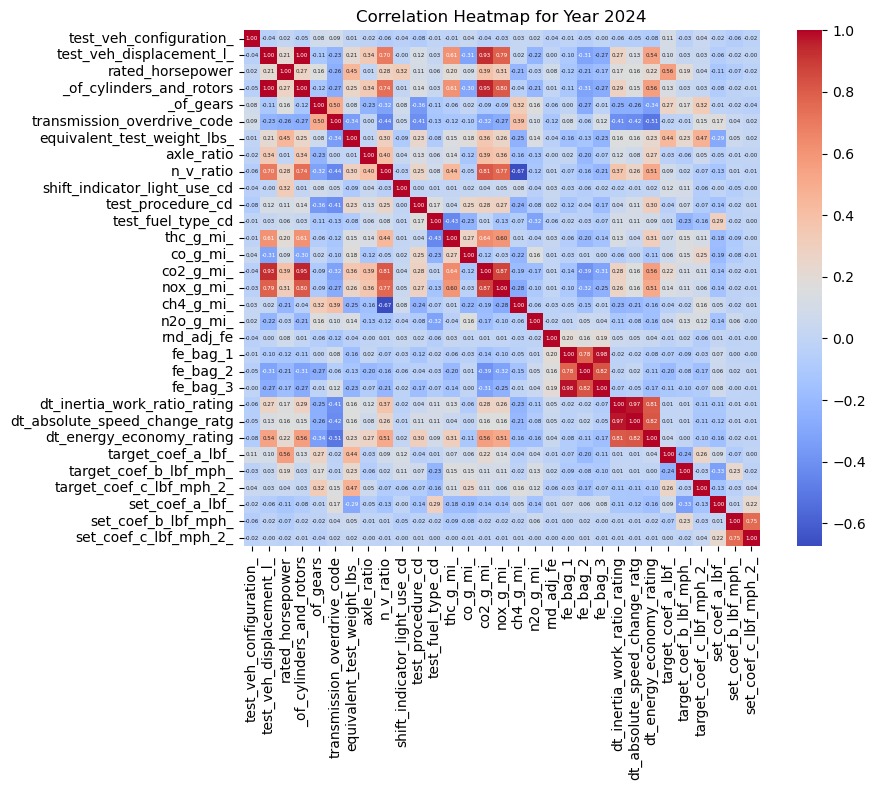

2024-11-05 13:44:22 - INFO - Time taken to process the block: 0:00:51.816706


In [30]:
start_time = datetime.datetime.now()

# Step 1: Select only the numeric columns
# We first extract a list of all the numeric columns from the 'car_markers_imputed' DataFrame.
# Then, we exclude the 'model_year' column, as it is categorical, and keep only the relevant numeric columns for correlation analysis.
numeric_cols = car_markers_imputed.select_dtypes(include='number').columns.tolist()
numeric_cols_corr = [col for col in numeric_cols if col != 'model_year']

# Step 2: Group the DataFrame by 'model_year'
# Group the data based on 'model_year', which allows us to analyze each year separately.
# Each group represents data for one specific year.
grouped = car_markers_imputed.groupby('model_year')

# Step 3: Loop over each group (each year) and plot the heatmap of the correlation matrix
# For each year in the grouped data:
for year, group in grouped:

    plt.figure(figsize=(10, 8))  # Set the figure size for better visualization of the heatmap
    
    # Compute the correlation matrix for the numeric columns within the group (i.e., for each year)
    correlation_matrix = group[numeric_cols_corr].corr()
    
    # Plot the correlation matrix as a heatmap
    sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm',
                annot_kws={"size": 4}, cbar=True, square=True)
    
    # Add a title indicating the year for which the heatmap is generated
    plt.title(f"Correlation Heatmap for Year {int(year)}")
    
    # Use 'tight_layout()' to ensure that the plot components fit well within the figure without overlapping
    plt.tight_layout()
    
    # Display the heatmap plot for the current year
    plt.show()

# Log the time taken to complete the entire process
stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")


Explain procedure, outcome, findings or report analysis for each block and cumulative task as well.

### Analysis
#### <ins>2015</ins>:
>The analysis reveals a strong negative correlation between fuel economy and CO2 emissions, emphasizing that improving fuel efficiency is critical for reducing emissions. Additionally, vehicles with higher-rated horsepower tend to produce more CO2, highlighting a trade-off between performance and emissions. The choice of fuel type also significantly influences emissions, making it a key factor in policies targeting emission reductions. Finally, optimizing transmission systems, including gear numbers, can enhance both vehicle performance and fuel efficiency, further contributing to emission control efforts.

#### <ins>2016</ins>:
>Improving fuel economy through advancements in engine technologies, transmission designs, and lighter vehicle structures is crucial for reducing CO2 emissions, as shown by the strong inverse relationship between emissions and fuel economy. Regulatory policies targeting fuel efficiency can significantly lower emissions. However, the positive correlation between rated horsepower and CO2 emissions points to a trade-off between vehicle performance and efficiency, with higher-performance vehicles generally producing more emissions. Additionally, optimizing axle ratios for different driving conditions and improving transmission systems, such as increasing the number of gears, can enhance fuel efficiency and overall performance, balancing both environmental and performance goals.

#### <ins>2017</ins>:
>Improving fuel economy is strongly linked to reducing CO2 emissions, as evidenced by the inverse relationship between emissions and various fuel economy metrics. Enhancing engine efficiency, reducing vehicle weight, and optimizing transmission systems are key strategies for cutting emissions. However, the positive correlation between rated horsepower and CO2 emissions highlights the environmental trade-off of high-performance vehicles, where greater power results in higher emissions. Emission reduction strategies focused on improving combustion efficiency and upgrading emission control systems can reduce multiple pollutants at once. Additionally, optimizing transmission designs and downsizing engines, possibly through turbocharging, are important steps toward balancing performance and environmental impact.

#### <ins>2018</ins>:
>There is a clear trade-off between emissions and fuel efficiency, with vehicles emitting more pollutants typically having lower fuel economy. Larger and more powerful engines, in terms of displacement, cylinders, and horsepower, are associated with higher emissions, emphasizing the environmental cost of performance-oriented vehicles. Additionally, heavier vehicles, as indicated by test weight and inertia work ratio, tend to produce more emissions, reinforcing the importance of reducing vehicle weight as a key strategy for lowering emissions.

#### <ins>2019</ins>:
>The heatmap reveals several key correlations between vehicle performance and emissions. Strong positive correlations include rated horsepower and engine displacement (r ≈ 0.84), reflecting the link between larger engines and higher power, and CO and NOx emissions (r ≈ 0.65), suggesting inefficiencies in combustion processes. Notably, CO2 emissions are strongly negatively correlated with fuel economy (r ≈ -0.78), confirming that more fuel-efficient vehicles emit less CO2. Negative correlations also show that heavier vehicles (r ≈ -0.70) and higher axle ratios (r ≈ -0.60) tend to reduce fuel economy. Additionally, more gears are associated with lower CO2 emissions (r ≈ -0.57), emphasizing the role of efficient transmission systems. Overall, vehicles with higher horsepower and displacement produce worse emissions profiles, while reducing vehicle weight and optimizing transmission design enhance fuel efficiency and reduce emissions.

#### <ins>2020</ins>:
>The 2020 vehicle correlation heatmap highlights key relationships between performance and emissions. Strong positive correlations show that larger, heavier vehicles with higher engine displacement, more cylinders, and greater horsepower emit more CO2 (ranging from 0.63 to 0.83). Rated horsepower and engine displacement are highly correlated (r ≈ 0.87), confirming that bigger engines produce more power and emissions. Fuel economy measures (FE) are consistently correlated across different tests, indicating stable performance under various conditions. There are strong negative correlations between fuel economy and CO2 emissions (-0.91 to -0.96), as well as with engine size and power, reinforcing the inverse relationship between efficiency and emissions. While CO emissions show some modest links to other pollutants like THC and CH4, NOx and N2O emissions appear less correlated with other factors, potentially influenced by combustion conditions or emission control technologies. In summary, larger and more powerful vehicles have worse emissions profiles, while improving fuel efficiency and reducing engine size can significantly lower CO2 emissions.

#### <ins>2021</ins>:
>The 2021 correlation heatmap highlights key patterns between vehicle performance and emissions. Heavier vehicles (equivalent_test_weight_lbs_) have strong positive correlations with CO2 (r = 0.77) and NOx emissions (r = 0.60), indicating that heavier cars emit more pollutants due to higher energy demands. Larger engines (test_veh_displacement_l_) show strong correlations with rated horsepower (r = 0.89) and CO2 emissions (r = 0.78), reflecting that higher displacement results in more power but greater fuel consumption and emissions. Fuel economy (rnd_adj_fe) has a strong negative correlation with CO2 (r = -0.97) and NOx emissions (r = -0.53), showing that more fuel-efficient vehicles produce fewer emissions. Additionally, fuel economy declines with increasing vehicle weight (r = -0.85) and engine size (r = -0.67). Axle ratio is highly correlated with n_v_ratio (r = 0.97), relating to gearing and speed relationships in vehicles. Overall, the data emphasizes that heavier and more powerful vehicles have worse emissions profiles, while improving fuel efficiency is key to reducing emissions, especially in vehicles with smaller engines and lower weights.

#### <ins>2022</ins>:
>The heatmap highlights several key relationships between vehicle performance and emissions. Performance indicators show a strong positive correlation between rated horsepower and engine displacement (r = 0.88), as larger engines typically produce more power, and with the number of cylinders/rotors (r = 0.86), indicating that more cylinders contribute to higher horsepower. Additionally, heavier vehicles require more powerful engines, as shown by the correlation between rated horsepower and test weight (r = 0.76).
Emissions indicators reveal a strong negative correlation between CO2 emissions and fuel economy (r = -0.78 with fe_bag_1, r = -0.76 with fe_bag_2), reinforcing that vehicles with better fuel efficiency produce fewer emissions. There is also a notable positive correlation between CO and NOx emissions (r = 0.77), suggesting overlapping factors in their production, potentially allowing for simultaneous control strategies.
Other observations include a strong relationship between inertia work ratio and absolute speed change (r = 0.91), indicating the influence of vehicle dynamics on performance, and the very strong correlation between axle ratio and NV ratio (r = 0.97), relating to drivetrain efficiency and gear selection. Overall, engine size and the number of cylinders are major drivers of performance, while improving fuel economy remains key to reducing CO2 emissions, with potential synergies in controlling CO and NOx.

#### <ins>2023</ins>:
>The correlation heatmap reveals several key relationships between vehicle performance and emissions. Rated horsepower shows a moderate positive correlation with vehicle configuration and the number of gears, suggesting that higher horsepower is linked to specific configurations and transmission designs. Engine displacement is moderately correlated with higher CO2 and NOx emissions, reinforcing the trend that larger engines produce more emissions. Axle ratio also shows a moderate correlation with horsepower, indicating its role in affecting vehicle power, efficiency, and acceleration.
Fuel economy (rnd_adj_fe) is negatively correlated with CO2 and NOx emissions, meaning more fuel-efficient vehicles emit fewer pollutants, particularly CO2. CO2 and NOx emissions are positively correlated, highlighting the need for emission control strategies that target both pollutants simultaneously. There are also moderate correlations among THC, CO, CH4, and N2O emissions, suggesting that inefficiencies in combustion can lead to increases in multiple pollutants.
Vehicles with more horsepower, larger engine displacement, and higher gear numbers tend to emit more CO2 and NOx, while fuel economy is inversely related to emissions. Axle ratio and transmission configurations play a key role in balancing performance and efficiency, but they also influence emission levels. Fuel type also significantly impacts vehicle emissions, further underscoring its importance in emission control strategies.

#### <ins>2024</ins>:
>The heatmap reveals several key correlations between vehicle performance and emissions. CO2 emissions are strongly positively correlated with vehicle weight and rated horsepower, indicating that heavier and more powerful vehicles consume more fuel and emit more CO2. Rated horsepower also has strong positive correlations with engine displacement and the number of cylinders, reflecting that more powerful engines are typically larger. THC and CO emissions are closely linked, suggesting that vehicles emitting higher levels of one pollutant often emit more of others as well.

>On the negative side, fuel efficiency is strongly negatively correlated with CO2 emissions, vehicle weight, and rated horsepower, meaning that more fuel-efficient vehicles are lighter, less powerful, and emit less CO2. Additionally, vehicles with higher inertia work and energy economy ratings tend to produce fewer emissions, suggesting that improvements in energy efficiency, such as lighter materials or advanced powertrains, can significantly reduce CO2 and NOx emissions. These insights reinforce the trade-offs between vehicle performance and environmental impact, emphasizing the benefits of focusing on fuel economy to lower emissions.

## 6. Combining Datasets:
Task Description: Standardize the column names and stack the datasets for all the years (2015 onward) into a single dataset. After stacking, check for any discrepancies or issues that arise (e.g., data types, missing values).

In [31]:
start_time = datetime.datetime.now()

merged_data_dataframe = merged_data.copy()

# Define the clean_column_name function
def clean_column_name(col_name):
    # Convert to lowercase, remove special characters, and replace spaces/underscores with a common format
    col_name = col_name.lower()
    col_name = re.sub(r'[^a-zA-Z0-9]', '_', col_name)  # Replace non-alphanumeric characters with underscores
    col_name = re.sub(r'_+', '_', col_name)  # Replace multiple underscores with a single one
    return col_name

# Apply the clean_column_name function to each DataFrame in the list
for i, df in enumerate(merged_data):
    if isinstance(df, pd.DataFrame):  # Ensure it's a DataFrame before processing
        merged_data[i].columns = [clean_column_name(col) for col in df.columns]

# Display the cleaned column names for the first DataFrame as an example
print(merged_data[0].columns)

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")


2024-11-05 13:44:22 - INFO - Time taken to process the block: 0:00:00


Index(['model_year', 'vehicle_manufacturer_name', 'veh_mfr_code',
       'represented_test_veh_make', 'represented_test_veh_model',
       'test_vehicle_id', 'test_veh_configuration_',
       'test_veh_displacement_l_', 'actual_tested_testgroup', 'vehicle_type',
       'rated_horsepower', '_of_cylinders_and_rotors', 'engine_code',
       'tested_transmission_type_code', 'tested_transmission_type',
       '_of_gears', 'transmission_lockup_', 'drive_system_code',
       'drive_system_description', 'transmission_overdrive_code',
       'transmission_overdrive_desc', 'equivalent_test_weight_lbs_',
       'axle_ratio', 'n_v_ratio', 'shift_indicator_light_use_cd',
       'shift_indicator_light_use_desc', 'test_number', 'test_originator',
       'analytically_derived_fe_', 'adfe_test_number',
       'adfe_total_road_load_hp', 'adfe_equiv_test_weight_lbs_',
       'adfe_n_v_ratio', 'test_procedure_cd', 'test_procedure_description',
       'test_fuel_type_cd', 'test_fuel_type_description', 'tes

We have already stacked the dataset for all years in the data frame - merged_data. We are standardizing the column names in that data frame here and there are no discrepancies in terms of column names. Each year has the same 69 columns. However, the missing values vary from year to year. Another finding is that the same columns have the most missing data for each year. We have done the code for that as a part of task 2. Also, the data types for each column is the same across all the years. 

## 7. Standardizing Continuous Variables:
Task Description: Standardize the continuous variables (such as vehicle displacement and coefficients) across the years. How does standardization affect the interpretation of the data? Why is it important to standardize these variables before performing regression analysis?

Identifying continuous variables:

In [32]:
start_time = datetime.datetime.now()

def find_continuous_variables(df):
    # Select numeric columns
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Filter continuous variables by setting a threshold for unique values
    continuous_vars = [col for col in numeric_cols if df[col].nunique() > 20]  # Adjust the threshold as needed
    
    return continuous_vars

# Initialize a dictionary to store continuous variables for each DataFrame
continuous_vars_by_year = {}

# Loop through each DataFrame in the list of 'merged_data'
for i, df in enumerate(merged_data):
    # Apply the function to each DataFrame to find continuous variables
    continuous_vars_by_year[years[i]] = find_continuous_variables(df)

# Display the continuous variables for each year
for year, variables in continuous_vars_by_year.items():
    print(f"Continuous Variables for {year}: {variables}")

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")


2024-11-05 13:44:22 - INFO - Time taken to process the block: 0:00:00.079213


Continuous Variables for 2015: ['test_veh_configuration_', 'test_veh_displacement_l_', 'rated_horsepower', 'equivalent_test_weight_lbs_', 'axle_ratio', 'n_v_ratio', 'adfe_total_road_load_hp', 'adfe_equiv_test_weight_lbs_', 'adfe_n_v_ratio', 'thc_g_mi_', 'co_g_mi_', 'co2_g_mi_', 'nox_g_mi_', 'pm_g_mi_', 'ch4_g_mi_', 'n2o_g_mi_', 'rnd_adj_fe', 'fe_bag_1', 'fe_bag_2', 'fe_bag_3', 'fe_bag_4', 'dt_inertia_work_ratio_rating', 'dt_absolute_speed_change_ratg', 'dt_energy_economy_rating', 'target_coef_a_lbf_', 'target_coef_b_lbf_mph_', 'target_coef_c_lbf_mph_2_', 'set_coef_a_lbf_', 'set_coef_b_lbf_mph_', 'set_coef_c_lbf_mph_2_']


Performing Standardization using Z Score Normalization since this method ensures that each feature contributes equally to the model, avoiding bias toward features with larger ranges

In [33]:
start_time = datetime.datetime.now()

from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Loop through each DataFrame in the list of 'merged_data'
for i, df in enumerate(merged_data):
    # Ensure continuous variables are present in the current DataFrame
    continuous_vars_in_df = [col for col in continuous_vars_by_year[years[i]] if col in df.columns]
    
    # Apply standardization only to the specified continuous columns
    if continuous_vars_in_df:  # Only scale if there are continuous variables in the DataFrame
        merged_data[i][continuous_vars_in_df] = scaler.fit_transform(df[continuous_vars_in_df])

# Display the standardized dataframe for the first DataFrame as an example (optional)
print(merged_data[0].head())

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")


   model_year vehicle_manufacturer_name veh_mfr_code  \
0        2015              aston martin          ASX   
1        2015              aston martin          ASX   
2        2015              aston martin          ASX   
3        2015              aston martin          ASX   
4        2015              aston martin          ASX   

  represented_test_veh_make represented_test_veh_model test_vehicle_id  \
0              Aston Martin                        DB9       143TT1042   
1              Aston Martin                        DB9       143TT1042   
2              Aston Martin                   Rapide S       410TT4202   
3              Aston Martin                   Rapide S       410TT4202   
4              Aston Martin              V12 Vantage S       288TT2087   

   test_veh_configuration_  test_veh_displacement_l_ actual_tested_testgroup  \
0                -0.579731                  0.349398            DASXV05.9VH1   
1                -0.579731                  0.349398      

2024-11-05 13:44:22 - INFO - Time taken to process the block: 0:00:00.158728


#### **How does standardization affect the interpretation of the data?**

Standardization (e.g., z-score normalization) transforms the data such that each feature has a mean of 0 and a standard deviation of 1. This affects the interpretation of the data in the following ways:

**Equal Scale:** After standardization, all variables are on the same scale, so their units no longer influence the model. This allows the model to treat each feature equally, regardless of its original magnitude or unit.

**Interpretation of Coefficients:** In regression models, standardization makes it easier to compare the relative importance of variables by their regression coefficients. A larger coefficient after standardization means that the corresponding variable has a greater impact on the target variable, but the coefficients will not reflect the original data's units.

**Centering and Spread:** Standardized data has a mean of 0 and a standard deviation of 1, meaning that all features are centered around their mean. This can simplify interpretation in terms of "how much a variable deviates from the average" rather than its absolute value.

#### **Why is it important to standardize these variables before performing regression analysis?**

* **Ensures Equal Contribution of Features:** In regression analysis, if your variables have different units or scales (e.g., weight in pounds vs. horsepower), features with larger magnitudes will disproportionately influence the model, potentially leading to misleading results. Standardization prevents this by putting all features on the same scale.

* **Improves Algorithm Performance:** Many regression algorithms, especially regularized models like Ridge or Lasso regression, are sensitive to the scale of the input variables. Standardizing variables helps the algorithms work more efficiently and produce more accurate models.

* **Facilitates Regularization:** In models like Ridge and Lasso, the regularization penalties depend on the magnitudes of the coefficients. Standardization ensures that the regularization term is applied fairly across all variables, as each feature contributes equally, irrespective of its original scale.

* **Improves Model Stability and Convergence:** For gradient-based optimization methods (used in many regression algorithms), standardized data leads to faster and more stable convergence. Without standardization, features with large values can dominate the gradient, causing slower convergence.

## 8. Temporal Analysis:
Task Description: Investigate how certain variables evolve over time. Plot these variables against the "Model Year" and describe any noticeable patterns or shifts in vehicle design or emissions standards.

Vehicle Type  Both   Car  Truck
Year                           
2015           656  3014   1162
2016           601  2895   1154
2017           496  2966   1223
2018           517  2865   1345
2019           486  2846   1387
2020           565  2473   1412
2021           511  2094   1660
2022           560  1975   1958
2023           633  1919   1969
2024           618  1674   1845


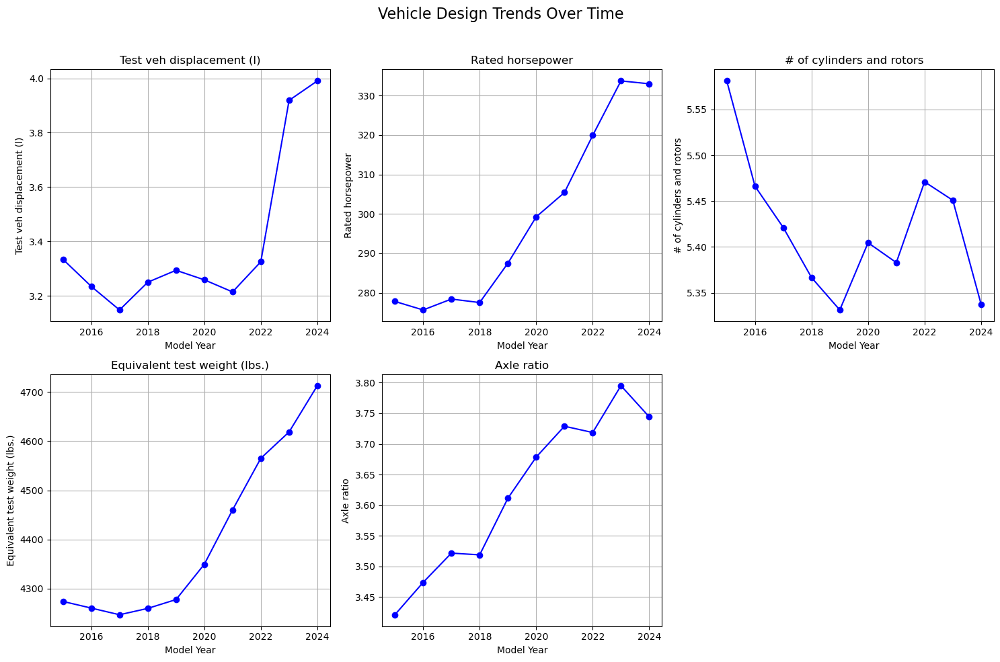

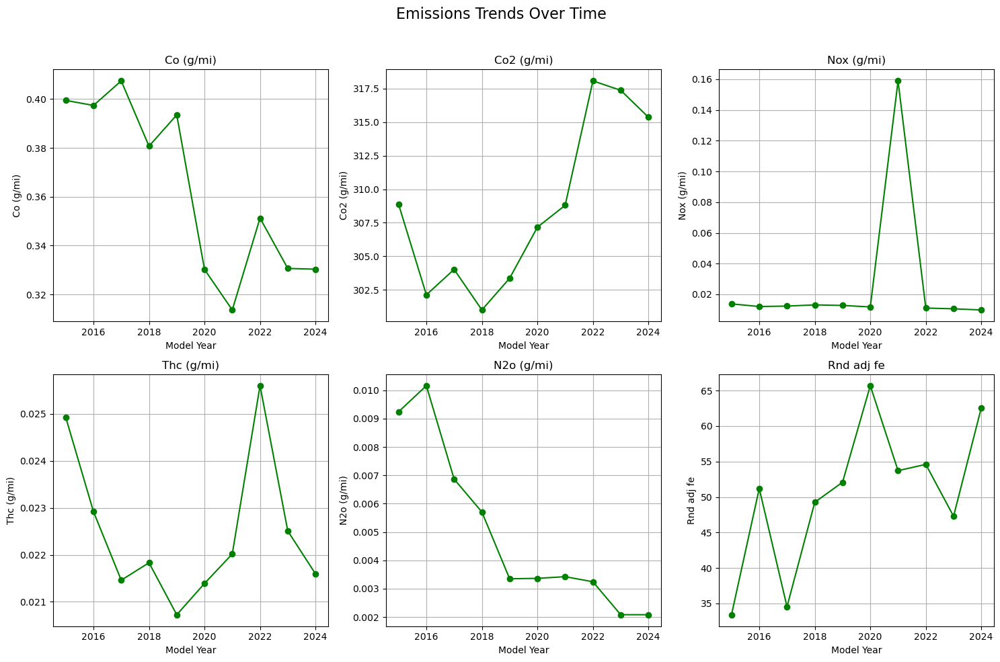

2024-11-05 13:44:26 - INFO - Time taken to process the block: 0:00:04.101642


In [34]:
start_time = datetime.datetime.now()

vehicle_type_counts = merged_data_missing_dropped.pivot_table(
    index='Year',
    columns='Vehicle Type',
    aggfunc='size',
    fill_value=0
)

# Display the table
print(vehicle_type_counts)

# Define vehicle design and emissions related columns
vehicle_design_columns = ['Test Veh Displacement (L)', 'Rated Horsepower', '# of Cylinders and Rotors', 
                          'Equivalent Test Weight (lbs.)', 'Axle Ratio']
emissions_columns = ['CO (g/mi)', 'CO2 (g/mi)', 'NOx (g/mi)', 'THC (g/mi)', 'N2O (g/mi)', 'RND_ADJ_FE']

# Calculate the mean grouped by 'Model Year'
temporal_vehicle_design = merged_data_missing_dropped.groupby('Model Year')[vehicle_design_columns].mean()
temporal_emissions = merged_data_missing_dropped.groupby('Model Year')[emissions_columns].mean()

# Create a 2x3 subplot for vehicle design trends (handling 5 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Vehicle Design Trends Over Time', fontsize=16)

for i, column in enumerate(vehicle_design_columns):
    row, col = divmod(i, 3)  # Calculate the row and column for 2x3 grid
    axes[row, col].plot(temporal_vehicle_design.index, temporal_vehicle_design[column], marker='o', color='blue')
    axes[row, col].set_title(column.replace('_', ' ').capitalize())
    axes[row, col].set_xlabel('Model Year')
    axes[row, col].set_ylabel(column.replace('_', ' ').capitalize())
    axes[row, col].grid(True)

# Hide the empty subplot if there are fewer than 6 columns
if len(vehicle_design_columns) < 6:
    fig.delaxes(axes[1, 2])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Create a 2x3 subplot for emissions trends (handling 6 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Emissions Trends Over Time', fontsize=16)

for i, column in enumerate(emissions_columns):
    row, col = divmod(i, 3)  # Calculate the row and column for 2x3 grid
    axes[row, col].plot(temporal_emissions.index, temporal_emissions[column], marker='o', color='green')
    axes[row, col].set_title(column.replace('_', ' ').capitalize())
    axes[row, col].set_xlabel('Model Year')
    axes[row, col].set_ylabel(column.replace('_', ' ').capitalize())
    axes[row, col].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Results
Vehicle Type counts for each year:
| Year/Vehicle Type | Both | Car  | Truck |
|-------------------|------|------|-------|
| 2015              | 656  | 3014 | 1162  |
| 2016              | 601  | 2895 | 1154  |
| 2017              | 496  | 2966 | 1223  |
| 2018              | 517  | 2865 | 1345  |
| 2019              | 486  | 2846 | 1387  |
| 2020              | 565  | 2473 | 1412  |
| 2021              | 511  | 2094 | 1660  |
| 2022              | 560  | 1975 | 1958  |
| 2023              | 633  | 1919 | 1969  |
| 2024              | 618  | 1674 | 1845  |
#### Vehicle Design Trends
1. **Test Veh Displacement (L)**:
> The displacement dropped from 2015 to 2021 but increased afterward. The initial decrease could be attributed to manufacturers striving to create more fuel-efficient engines in response to market demand. Additionally, there was a gradual decline in the number of cars and a steady increase in the number of trucks. Trucks (and SUVs) typically have larger engines, which may have contributed to the surge in displacement after 2021. Although the number of cars decreased, their lower engine displacement might have played a role in the earlier decline.

2. **Rated Horsepower**:
> The horsepower plot shows a steep increase starting in 2018. This could be due to the consistent rise in the number of trucks, which generally have higher horsepower. Cars, which typically have lower horsepower, might explain the stable trend before 2018. Additionally, advances in technology may have enabled manufacturers to increase horsepower. The growing demand for performance-oriented or larger vehicles is also driving this trend.

3. **Number of Cylinders and Rotors**:
> There is a slight decrease in the number of cylinders and rotors over time, with some fluctuations but an overall downward trend. The decline in the number of cars could be contributing to this trend, as they typically have fewer cylinders and smaller engines. Even though the number of trucks is increasing, manufacturers may be using modern technology or smaller, more powerful engines in trucks, which could balance the overall average and result in this trend.

4. **Equivalent Test Weight (lbs.)**:
> Test weight has steadily increased, peaking in 2024. The rise in test weight aligns with the increased number of trucks. Trucks are inherently heavier due to their structure and purpose. The declining number of cars, which are generally lighter, supports this finding.

5. **Axle Ratio**:
> Axle ratio steadily increases from 2015 to 2023, with a slight drop in 2024. Higher axle ratios are typical for trucks due to their structure and purpose. The rising number of trucks from 2020 onward is consistent with the increasing axle ratios, as trucks require higher ratios for better torque delivery at lower speeds

#### Emission Trends
1. **CO Emissions (g/mi)**:
> CO emissions drop significantly after 2020. Despite the rise in trucks, which generally produce more CO, emissions reduction technologies may have helped reduce CO emissions. The increase in trucks  may explain why CO emissions haven’t dropped further, as we might expect.

2. **CO2 Emissions (g/mi)**:
> CO2 emissions surge around 2022. This is a direct reflection of the growing number of trucks and their larger engines. Trucks consume more fuel and produce more CO2 per mile, hence the increase in CO2 emissions. The decline in cars further contributes to this trend, as they are more fuel-efficient and emit less CO2.

3. **NOx Emissions (g/mi)**:
> NOx emissions remain low except for a spike in 2021. NOx emissions are strictly regulated and kept under control, especially in cars. The 2020 spike could be an anomaly or a regulatory issue. Overall, trucks produce more NOx than cars, but regulations have kept these emissions stable.

4. **THC Emissions (g/mi)**:
> THC emissions fluctuate, with peaks in 2015 and 2022. Trucks typically produce more hydrocarbons due to incomplete combustion, particularly in older models. As the number of trucks increased, this could explain the slight rise in THC emissions. However, modern emissions control systems help in managing these emissions, keeping them in check despite the truck surge.

5. **N2O Emissions (g/mi)**:
> N2O emissions have consistently declined over time. Despite the rise in trucks, emissions control technology has successfully reduced N2O emissions. Trucks tend to emit more N2O, but modern systems may have likely played a key role in the decline.

6. **Rnd Adj FE (Fuel Economy)**:
> Fuel economy improves over time, peaking in 2020, with a slight dip afterward. The dip in fuel economy post-2020 can be linked to the increased number of trucks, which are generally less fuel-efficient than cars. The rise in fuel economy in 2020 might be due to improved technologies in car engines, before the truck surge became dominant in the dataset.

#### **Summary**:
>- The shift towards trucks is reflected in the increasing trends, but cars still play a role in keeping some metrics down. Overall, the trend is moving towards heavier and more powerful vehicles.
>- Emission control technologies have helped keep pollutants in check despite the shift towards heavier trucks. However, CO2 emissions, which are closely tied to fuel consumption, have increased as trucks become more prominent, reflecting the tradeoff between performance and environmental concerns.

Vehicle Type                          Both  Car  Truck
Model Year Vehicle Manufacturer Name                  
2015       BMW                         186  687     68
           FOMOCO                        0  187    191
           GM                           68  151    124
           Nissan                        0  205    185
           Toyota                        0  258    245
2016       BMW                         155  584     59
           FOMOCO                        0  177    213
           GM                           74  162    146
           Nissan                        0  239    105
           Toyota                        0  265    271
2017       BMW                          42  582     59
           FOMOCO                        0  205    203
           GM                           50  190    193
           Nissan                        0  277    151
           Toyota                        0  255    248
2018       BMW                          47  556     43
          

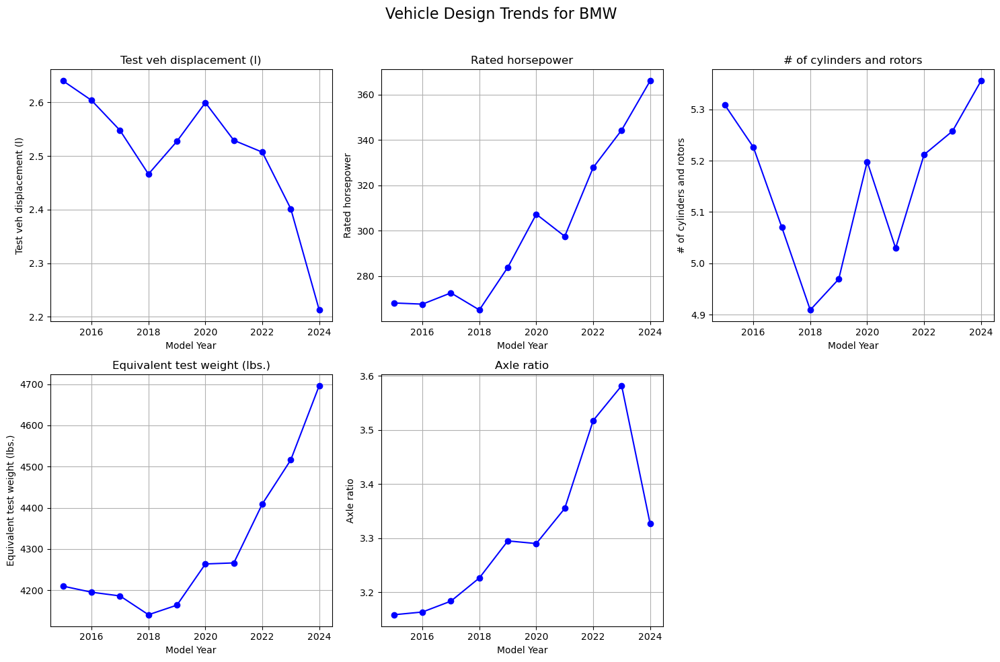

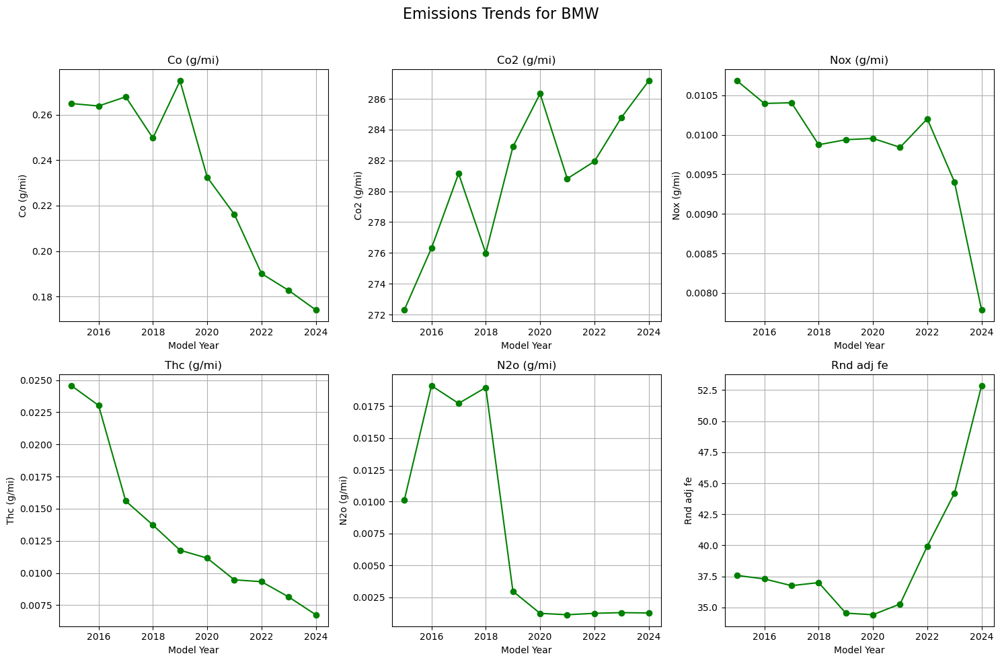

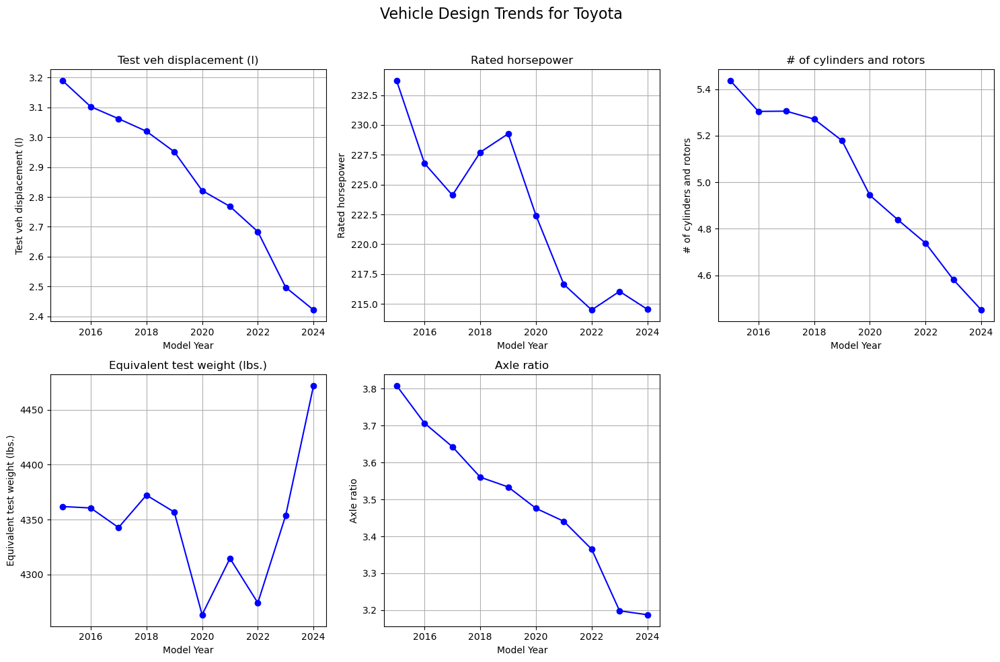

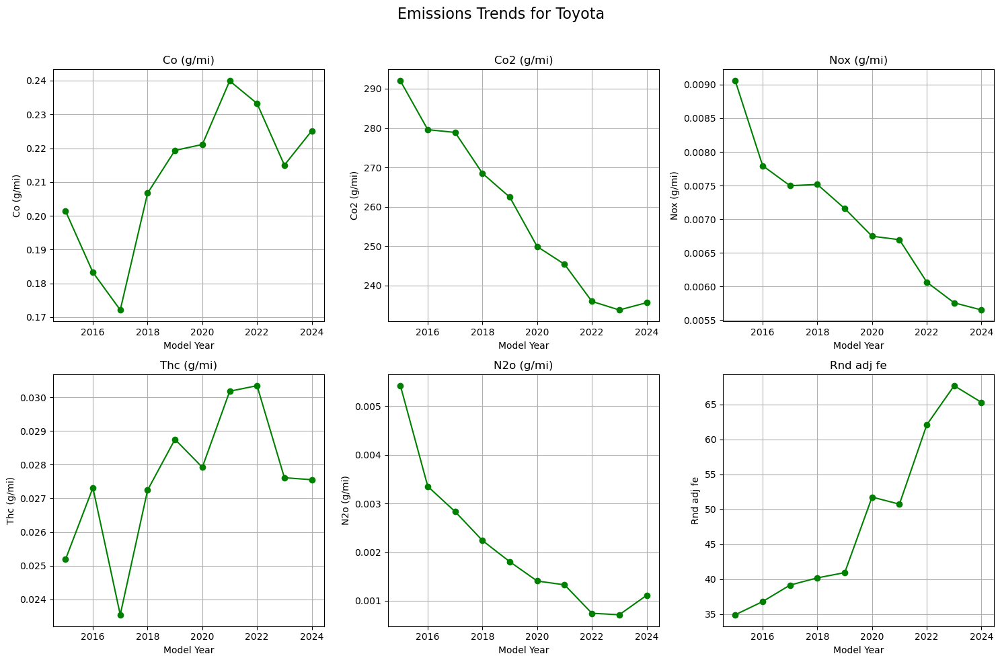

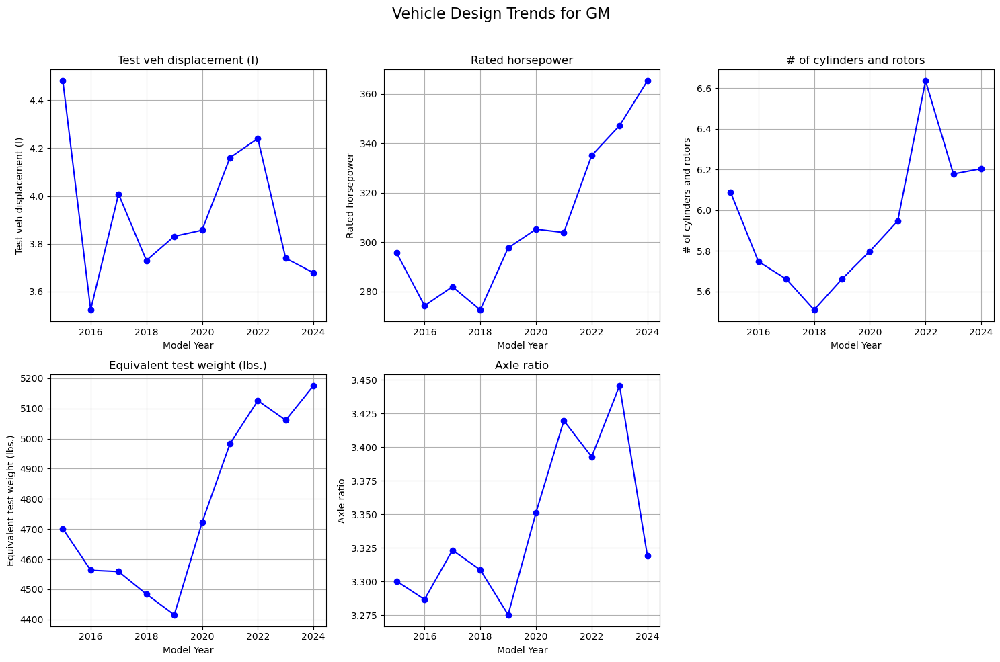

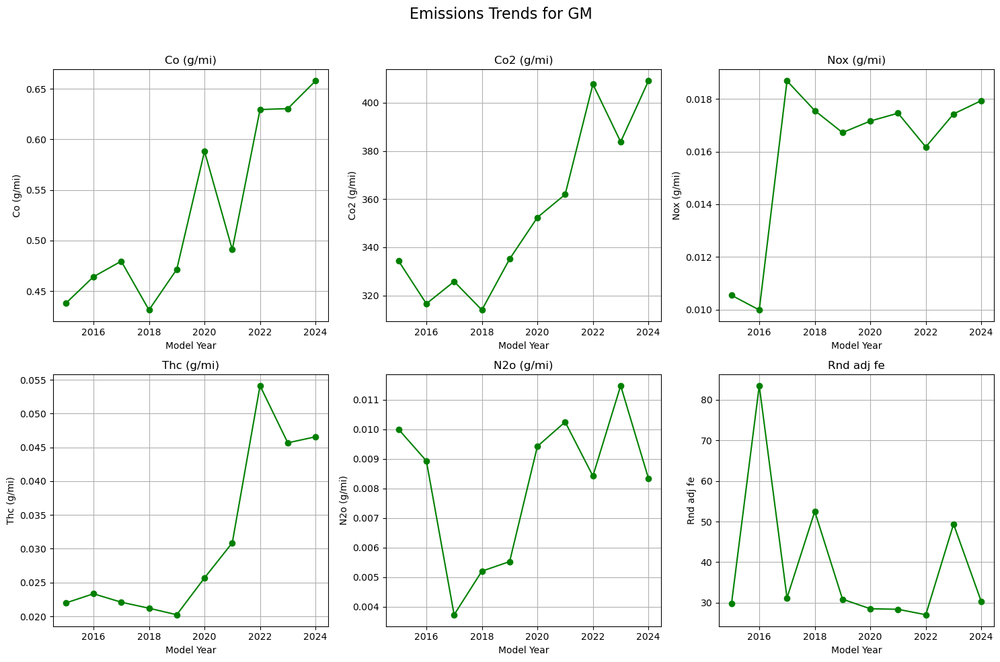

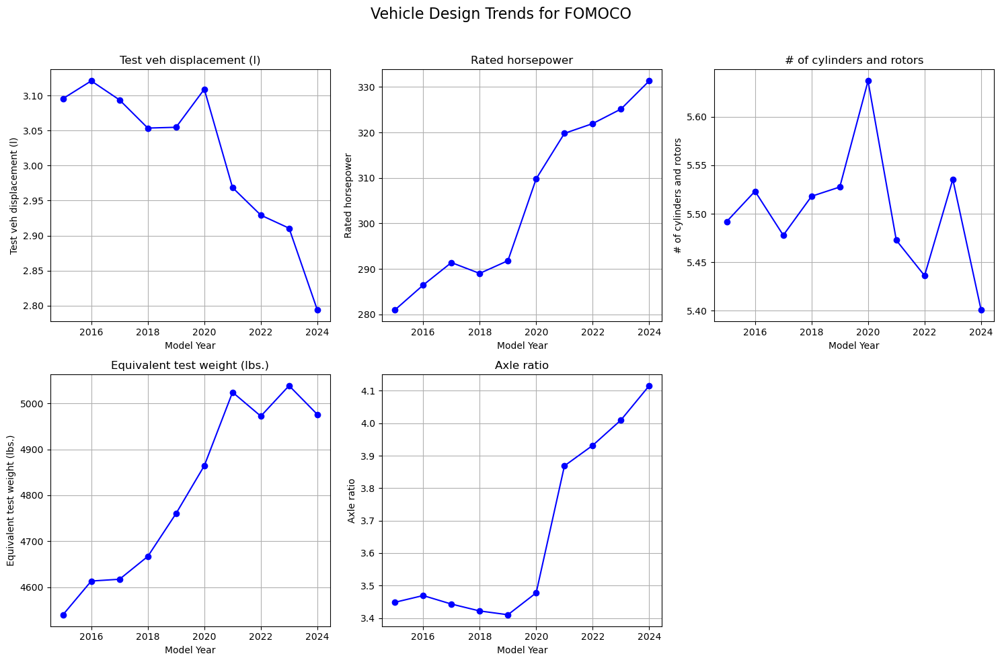

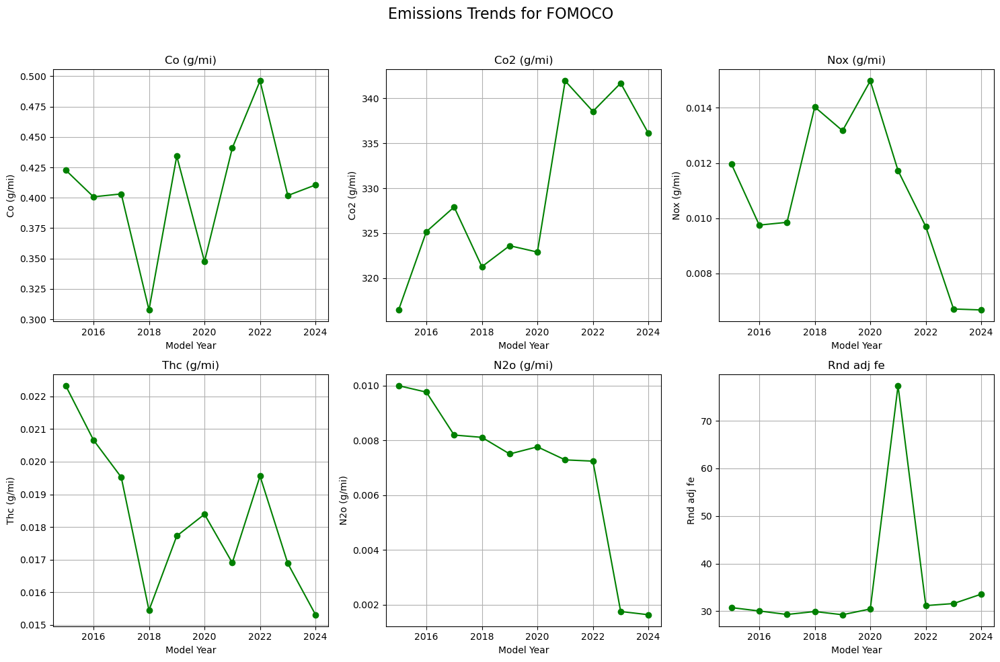

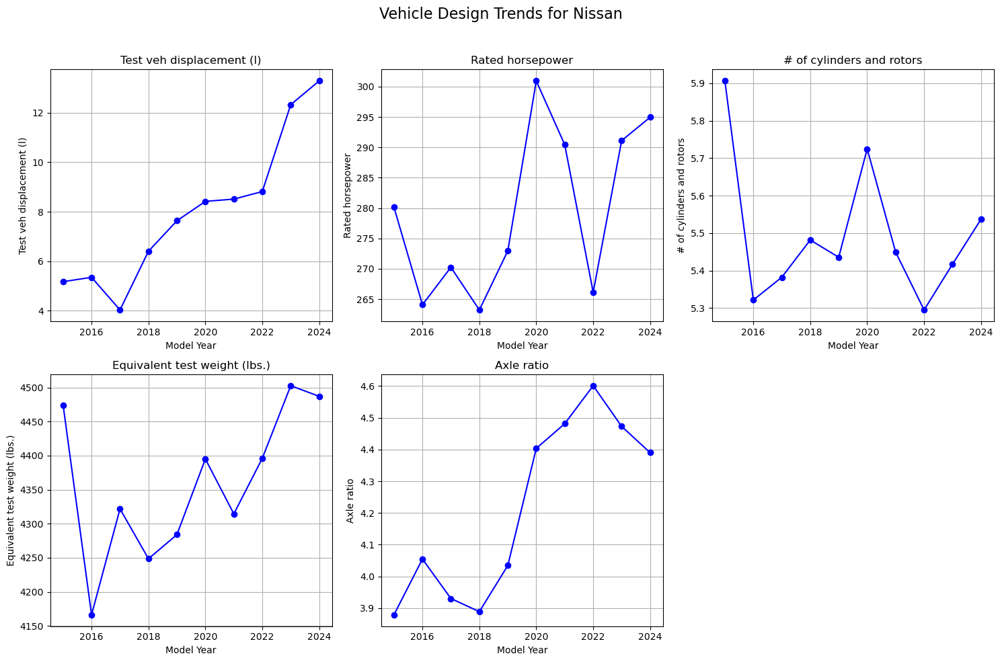

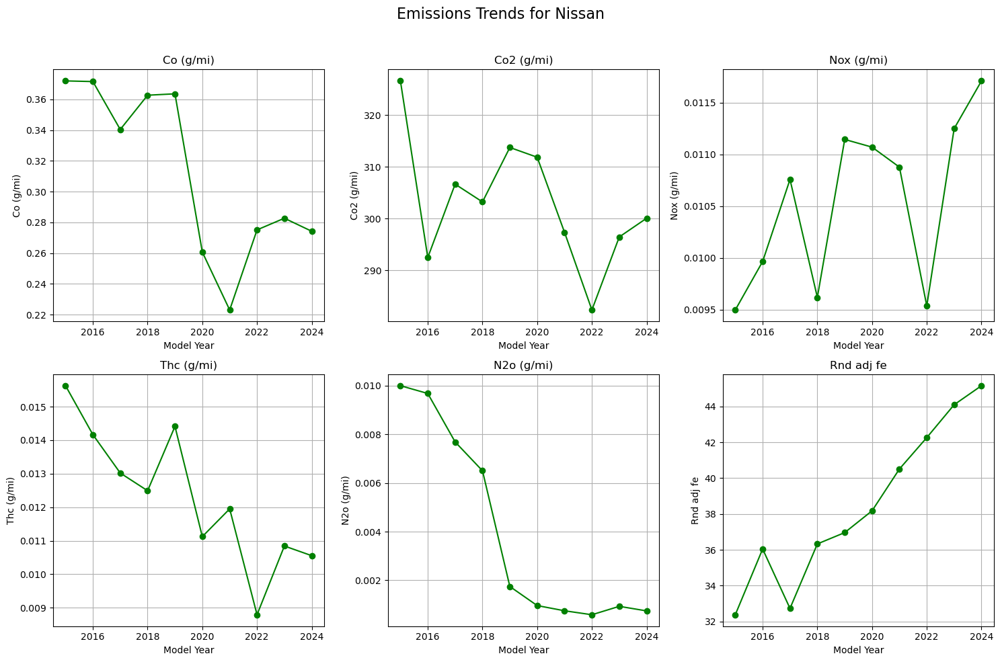

2024-11-05 13:44:49 - INFO - Time taken to process the block: 0:00:22.506263


In [35]:
start_time = datetime.datetime.now()

# Columns for Vehicle Design and Emissions
vehicle_design_columns = ['Test Veh Displacement (L)', 'Rated Horsepower', '# of Cylinders and Rotors', 
                          'Equivalent Test Weight (lbs.)', 'Axle Ratio']
emissions_columns = ['CO (g/mi)', 'CO2 (g/mi)', 'NOx (g/mi)', 'THC (g/mi)', 'N2O (g/mi)', 'RND_ADJ_FE']

# Select the manufacturers you want to compare
manufacturers = ['BMW', 'Toyota', 'GM', 'FOMOCO', 'Nissan']

# Calculate the number of Trucks, Cars, and Both vehicle types for each year and each manufacturer
vehicle_type_counts_by_manufacturer = merged_data_missing_dropped[
    merged_data_missing_dropped['Vehicle Manufacturer Name'].isin(manufacturers)
].pivot_table(
    index=['Model Year', 'Vehicle Manufacturer Name'],
    columns='Vehicle Type',
    aggfunc='size',
    fill_value=0
)

# Display the vehicle type counts for each manufacturer and year
print(vehicle_type_counts_by_manufacturer)

# Iterate through each manufacturer and plot their trends
for manufacturer in manufacturers:
    # Filter the data for the specific manufacturer
    manufacturer_data = merged_data_missing_dropped[merged_data_missing_dropped['Vehicle Manufacturer Name'] == manufacturer]
    
    # Calculate the mean grouped by 'Model Year'
    temporal_vehicle_design = manufacturer_data.groupby('Model Year')[vehicle_design_columns].mean()
    temporal_emissions = manufacturer_data.groupby('Model Year')[emissions_columns].mean()
    
    # Create a 2x3 subplot for vehicle design trends (handling 5 columns)
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Vehicle Design Trends for {manufacturer}', fontsize=16)

    for i, column in enumerate(vehicle_design_columns):
        row, col = divmod(i, 3)
        axes[row, col].plot(temporal_vehicle_design.index, temporal_vehicle_design[column], marker='o', color='blue')
        axes[row, col].set_title(column.replace('_', ' ').capitalize())
        axes[row, col].set_xlabel('Model Year')
        axes[row, col].set_ylabel(column.replace('_', ' ').capitalize())
        axes[row, col].grid(True)

    # Hide the empty subplot if there are fewer than 6 columns
    if len(vehicle_design_columns) < 6:
        fig.delaxes(axes[1, 2])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Create a 2x3 subplot for emissions trends (handling 6 columns)
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Emissions Trends for {manufacturer}', fontsize=16)

    for i, column in enumerate(emissions_columns):
        row, col = divmod(i, 3)
        axes[row, col].plot(temporal_emissions.index, temporal_emissions[column], marker='o', color='green')
        axes[row, col].set_title(column.replace('_', ' ').capitalize())
        axes[row, col].set_xlabel('Model Year')
        axes[row, col].set_ylabel(column.replace('_', ' ').capitalize())
        axes[row, col].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Results
Vehicle Type Counts:

| Model Year | Vehicle Manufacturer Name | Vehicle Type | Both | Car  | Truck |
|------------|---------------------------|--------------|------|------|-------|
| 2015       | BMW                       |              | 186  | 687  |  68   |
|            | FOMOCO                    |              |   0  | 187  | 191   |
|            | GM                        |              |  68  | 151  | 124   |
|            | Nissan                    |              |   0  | 205  | 185   |
|            | Toyota                    |              |   0  | 258  | 245   |
| 2016       | BMW                       |              | 155  | 584  |  59   |
|            | FOMOCO                    |              |   0  | 177  | 213   |
|            | GM                        |              |  74  | 162  | 146   |
|            | Nissan                    |              |   0  | 239  | 105   |
|            | Toyota                    |              |   0  | 265  | 271   |
| 2017       | BMW                       |              |  42  | 582  |  59   |
|            | FOMOCO                    |              |   0  | 205  | 203   |
|            | GM                        |              |  50  | 190  | 193   |
|            | Nissan                    |              |   0  | 277  | 151   |
|            | Toyota                    |              |   0  | 255  | 248   |
| 2018       | BMW                       |              |  47  | 556  |  43   |
|            | FOMOCO                    |              |   0  | 168  | 251   |
|            | GM                        |              |  32  | 229  | 234   |
|            | Nissan                    |              |   0  | 248  | 115   |
|            | Toyota                    |              |   0  | 265  | 228   |
| 2019       | BMW                       |              |  66  | 421  |  17   |
|            | FOMOCO                    |              |   0  | 172  | 266   |
|            | GM                        |              |  22  | 241  | 223   |
|            | Nissan                    |              |   0  | 231  | 118   |
|            | Toyota                    |              |   0  | 309  | 214   |
| 2020       | BMW                       |              | 211  | 251  |   6   |
|            | FOMOCO                    |              |   0  | 114  | 266   |
|            | GM                        |              |   0  | 206  | 342   |
|            | Nissan                    |              |   0  | 142  |  88   |
|            | Toyota                    |              |   7  | 307  | 186   |
| 2021       | BMW                       |              | 220  | 160  |  31   |
|            | FOMOCO                    |              |   0  |  71  | 366   |
|            | GM                        |              |   0  | 136  | 356   |
|            | Nissan                    |              |   0  | 136  |  83   |
|            | Toyota                    |              |   6  | 280  | 223   |
| 2022       | BMW                       |              | 216  | 129  |  33   |
|            | FOMOCO                    |              |   0  |  80  | 428   |
|            | GM                        |              |   0  | 156  | 475   |
|            | Nissan                    |              |   0  |  98  | 104   |
|            | Toyota                    |              |   6  | 260  | 217   |
| 2023       | BMW                       |              | 214  | 159  |  59   |
|            | FOMOCO                    |              |   0  |  62  | 414   |
|            | GM                        |              |   0  | 147  | 383   |
|            | Nissan                    |              |   0  | 107  | 126   |
|            | Toyota                    |              |  58  | 189  | 234   |
| 2024       | BMW                       |              | 213  | 183  |  70   |
|            | FOMOCO                    |              |   0  |  39  | 203   |
|            | GM                        |              |   2  | 168  | 460   |
|            | Nissan                    |              |   0  | 115  |  97   |
|            | Toyota                    |              |  64  | 177  | 316   |


#### Vehicle Design Trends
1. **BMW**
> BMW's design trends from 2016 to 2024 reveal a general downsizing in engine displacement. Despite this, rated horsepower increased significantly, highlighting BMW's commitment to maintaining power even with smaller engines. The number of cylinders and rotors increased slightly, suggesting the use of more sophisticated engine designs. The equivalent test weight also rose consistently, implying that BMW's vehicles are becoming heavier, potentially due to the addition of advanced technology and safety features. The rise in axle ratio emphasizes a continued focus on performance and power delivery.

2. **Toyota**
> Toyota's vehicle design trends from 2016 to 2024 exhibit a consistent downsizing in engine displacement, accompanied by reductions in rated horsepower, the number of cylinders and rotors, and axle ratio. These trends suggest Toyota's strong focus on fuel efficiency and environmental sustainability, as smaller engines typically result in lower fuel consumption and emissions. However, the equivalent test weight showed fluctuations, with a sharp rise in 2024, indicating that Toyota may have enhanced load-carrying capacity or durability while maintaining engine efficiency.

3. **GM**
> GM’s vehicle design trends indicate significant fluctuations in engine displacement, with a steady increase in rated horsepower, signaling a focus on high-performance engines. The number of cylinders and rotors also increased over time, reflecting the trend toward larger engines. Both the equivalent test weight and axle ratio show upward trends, indicating that GM's vehicles are becoming heavier and more performance-oriented, likely reflecting a focus on trucks and SUVs that require more power and torque.

4. **FOMOCO**
> FOMOCO's design trends point to a gradual increase in engine performance, with rated horsepower rising steadily from 2016 to 2024. Engine displacement shows a slight decrease, reflecting FOMOCO’s effort to balance power and efficiency. The number of cylinders and rotors fluctuated, peaking in 2020, indicating variations in engine configurations across the years. Both the equivalent test weight and axle ratio increased over time, suggesting that FOMOCO's vehicles are becoming heavier and more capable of handling increased loads, possibly reflecting a shift toward larger trucks and SUVs.

5. **Nissan**
> Nissan's design trends reveal significant increases in engine displacement from 2016 to 2024, accompanied by a substantial rise in rated horsepower. Although the number of cylinders and rotors fluctuated, it generally remained stable, indicating that Nissan continues to produce large, performance-oriented engines. Both the equivalent test weight and axle ratio show upward trends, indicating that Nissan’s vehicles are becoming heavier, likely prioritizing load capacity and towing power, particularly for SUVs and trucks.

#### Emission Trends
1. **BMW**
> BMW’s emissions trends show a clear decline in CO emissions, demonstrating effective emission control. However, CO2 emissions fluctuated, peaking in 2024, which suggests room for improvement in controlling greenhouse gas emissions. NOx emissions steadily decreased, and THC emissions remained stable, while N2O emissions saw a significant drop. BMW’s design improvements appear to focus on enhancing performance and power, though the rise in CO2 emissions may require additional attention to meet future regulatory standards.

2. **Toyota**
> Toyota’s CO emissions remained relatively stable, peaking in 2020 and declining by 2024. CO2 emissions showed a significant drop from 2016 to 2024, indicating improved fuel efficiency. NOx emissions followed a steady downward trend, showcasing Toyota’s efforts in reducing harmful pollutants. Both THC and N2O emissions saw consistent reductions, with N2O showing the most dramatic improvement. The Rnd Adj FE (fuel economy) saw a sharp increase from 2020 to 2024, highlighting Toyota's strong focus on improving fuel efficiency. Overall, Toyota’s smaller, more efficient engines have resulted in better fuel economy and cleaner emissions.

3. **GM**
> GM’s emissions data suggests a worsening trend in recent years. CO emissions increased significantly, with CO2 emissions also showing a marked rise. NOx emissions remained stable but relatively high, while THC emissions showed some volatility. GM's increasing focus on larger engines and higher performance appears to counteract efforts to reduce emissions, leading to poorer performance in key pollutants like CO and CO2.

4. **FOMOCO**
> FOMOCO’s emissions trends are inconsistent. CO emissions fluctuated, hitting a high in 2022 before dropping afterward. CO2 emissions also showed fluctuations over time. However, NOx emissions decreased significantly by 2024, indicating better control of this pollutant. THC emissions increased in 2022, and the Rnd Adj FE (fuel economy) spiked in 2016 (probably due to the bad data) but declined thereafter. FOMOCO’s unstable emission patterns suggest a need for refining their strategy, particularly in addressing CO and CO2 emissions more consistently.

5. **Nissan**
> Nissan’s emissions trends display mixed results. CO emissions decreased significantly between 2020 and 2022, only to rise again in 2024. CO2 emissions fluctuated, with a decline followed by a rise in 2024. NOx emissions were volatile, with a sharp increase in 2024, reflecting challenges in controlling this pollutant. Nissan’s move toward larger engines seems to be impacting emissions control, particularly with rising CO and NOx levels, indicating a need for more consistent emissions improvements.

#### Summary
- **BMW:** Focused on engine downsizing while increasing power and performance, with improved emission control but fluctuating CO2 levels.
- **Toyota:** Prioritized fuel efficiency and emissions reduction, with smaller engines and significant improvements in fuel economy and pollutant control.
- **GM:** Shifted towards larger, high-performance engines and heavier vehicles, but struggled with rising CO and CO2 emissions.
- **FOMOCO:** Balanced power and efficiency with rising vehicle weight, showing inconsistent emissions control, especially in CO and CO2.
- **Nissan:** Emphasized larger engines and higher power, but faced challenges in maintaining consistent emissions improvements, especially in CO and NOx.

## 9. Vehicle Manufacturer Analysis:
Task Description: Identify the top 10 vehicle manufacturers by the number of test records in the dataset. How does the performance (in terms of coefficients or displacement) vary across these manufacturers? What insights can be drawn from these differences?

Top 10 Vehicle Manufacturers by Test Records:
Vehicle Manufacturer Name
BMW                    5727
Toyota                 5088
GM                     4970
FOMOCO                 4076
Volkswagen Group of    3297
Nissan                 2970
FCA US LLC             2740
Honda                  2513
Hyundai                2306
Mercedes-Benz          2036
Name: count, dtype: int64

Performance Metrics for Top 10 Vehicle Manufacturers:
                           Test Veh Displacement (L)  Target Coef A (lbf)  \
Vehicle Manufacturer Name                                                   
BMW                                         2.521710             0.996874   
FCA US LLC                                  3.506870             0.052591   
FOMOCO                                      3.016409            -0.404837   
GM                                          3.915909            -0.167048   
Honda                                       2.168928            -0.578213   
Hyundai                     

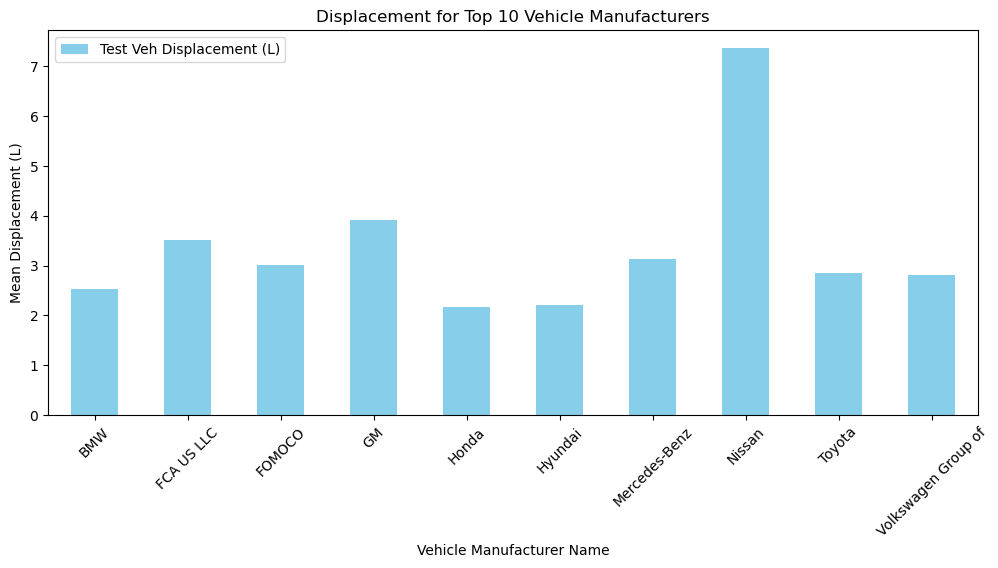

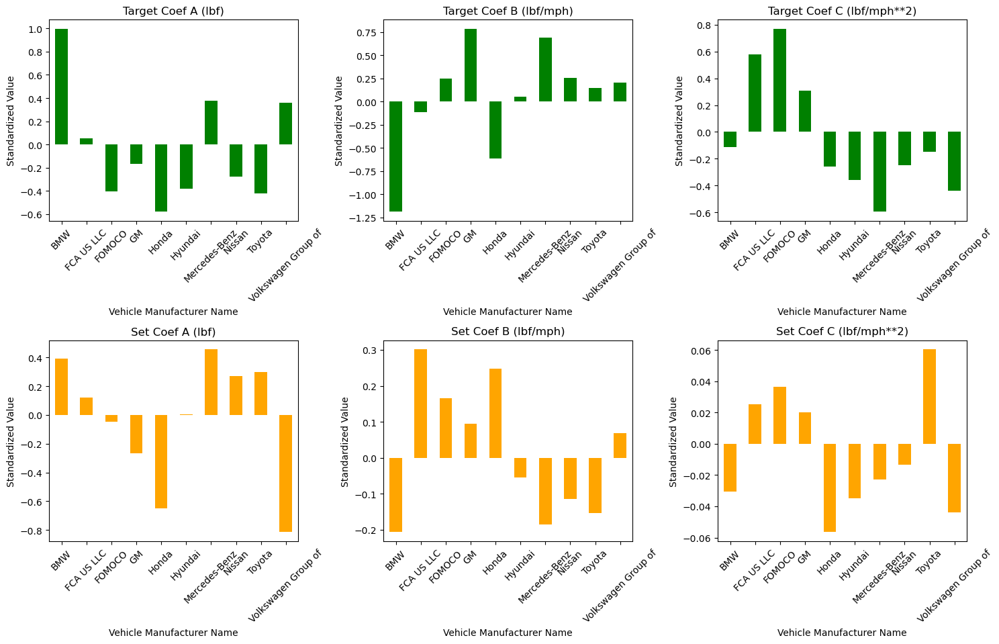

2024-11-05 13:44:53 - INFO - Time taken to process the block: 0:00:03.473025


In [36]:
start_time = datetime.datetime.now()

# Step 1: Identify the top 10 manufacturers by number of test records
top_10_manufacturers = merged_data_missing_dropped['Vehicle Manufacturer Name'].value_counts().head(10)

# Print the top 10 manufacturers
print("Top 10 Vehicle Manufacturers by Test Records:")
print(top_10_manufacturers)

# Step 2: Select the key performance columns for analysis, including all target and set coefficients
displacement_column = ['Test Veh Displacement (L)']
target_coeff_columns = ['Target Coef A (lbf)', 'Target Coef B (lbf/mph)', 'Target Coef C (lbf/mph**2)']
set_coeff_columns = ['Set Coef A (lbf)', 'Set Coef B (lbf/mph)', 'Set Coef C (lbf/mph**2)']

# Combine target and set coefficients to standardize them
coeff_columns = target_coeff_columns + set_coeff_columns

# Step 3: Filter the dataset for only the top 10 manufacturers
top_10_data = merged_data_missing_dropped[merged_data_missing_dropped['Vehicle Manufacturer Name'].isin(top_10_manufacturers.index)]

# Step 4: Standardize the target and set coefficients using .loc[] to avoid SettingWithCopyWarning
scaler = StandardScaler()
top_10_data.loc[:, coeff_columns] = scaler.fit_transform(top_10_data[coeff_columns])

# Step 5: Group by manufacturer and calculate mean performance metrics
manufacturer_performance = top_10_data.groupby('Vehicle Manufacturer Name')[displacement_column + coeff_columns].mean()

# Print the performance metrics for the top 10 manufacturers
print("\nPerformance Metrics for Top 10 Vehicle Manufacturers:")
print(manufacturer_performance)

# Step 6: Create subplots for displacement, target coefficients, and set coefficients

# Create a figure for the subplots
fig, axes = plt.subplots(1, 1, figsize=(12, 5))

# Subplot 1: Displacement (separate plot)
manufacturer_performance[displacement_column].plot(kind='bar', ax=axes, color='skyblue')
axes.set_title('Displacement for Top 10 Vehicle Manufacturers')
axes.set_ylabel('Mean Displacement (L)')
axes.set_xlabel('Vehicle Manufacturer Name')
axes.tick_params(axis='x', rotation=45)

# Create a 2x3 subplot for the 6 coefficients (target and set coefficients)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Subplot for the 3 Target Coefficients
for i, column in enumerate(target_coeff_columns):
    row, col = divmod(i, 3)
    manufacturer_performance[column].plot(kind='bar', ax=axes[row, col], color='green')
    axes[row, col].set_title(f'{column}')
    axes[row, col].set_xlabel('Vehicle Manufacturer Name')
    axes[row, col].set_ylabel('Standardized Value')
    axes[row, col].tick_params(axis='x', rotation=45)

# Subplot for the 3 Set Coefficients
for i, column in enumerate(set_coeff_columns):
    row, col = divmod(i + 3, 3)
    manufacturer_performance[column].plot(kind='bar', ax=axes[row, col], color='orange')
    axes[row, col].set_title(f'{column}')
    axes[row, col].set_xlabel('Vehicle Manufacturer Name')
    axes[row, col].set_ylabel('Standardized Value')
    axes[row, col].tick_params(axis='x', rotation=45)

# Adjust layout for both figures
plt.tight_layout(rect=[0, 0, 1, 0.97])

# Show plots
plt.show()

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Results
#### 1. **Vehicle Displacement**
> Nissan dominates in engine displacement, likely reflecting a focus on high-performance vehicles or trucks. GM and FCA US LLC also show relatively high displacement values, indicating a focus on larger, more powerful vehicles. In contrast, BMW, Honda, and Hyundai emphasize smaller, more efficient engines, aligning with their focus on fuel efficiency and emission reduction.

#### 2. **Target Coefficients**
- Target Coef A (lbf)
	> BMW leads with the highest value, suggesting a focus on higher rolling resistance, possibly due to performance-oriented tires or vehicle weight. FOMOCO, Honda, Hyundai, Toyota, Nissan, and GM have negative values, reflecting a design that reduces rolling resistance and enhances fuel efficiency.
- Target Coef B (lbf/mph)
	> GM leads in improving aerodynamic drag or powertrain friction, followed by Mercedes-Benz. BMW has a strong negative value, indicating a focus on minimizing forces for better handling and efficiency, with Honda showing a similar trend.
- Target Coef C (lbf/mph²)
	> FOMOCO, FCA US LLC, and GM lead, indicating that their vehicles are designed to handle higher acceleration forces, likely reflecting a focus on performance vehicles and trucks. Other manufacturers show negative values, emphasizing efficiency over acceleration performance.

#### 3. **Set Coefficients**
- Set Coef A (lbf)
	> Mercedes-Benz leads with a high value, followed by BMW, reflecting a design to withstand more road friction. Nissan, Toyota, and FCA US LLC also show positive values, while Volkswagen Group, Honda, and GM have negative values, indicating lower road friction and potentially better fuel economy.
- Set Coef B (lbf/mph)
	> FCA US LLC leads, reflecting a focus on reducing aerodynamic drag or improving the powertrain. Honda, FOMOCO, and GM follow with positive values, while BMW, Mercedes-Benz, Toyota, Nissan, and Hyundai show negative values, indicating varying design strategies.
- Set Coef C (lbf/mph²)
	> Toyota stands out with a significant positive value, likely due to efforts to optimize acceleration resistance, possibly in their SUV or hybrid models. FOMOCO, FCA US LLC, and GM also show positive values, while Honda, Hyundai, BMW, Mercedes-Benz, and Volkswagen Group display negative values, prioritizing smoother acceleration and fuel efficiency.
	
#### Summary
- Nissan focuses on high-performance or larger vehicles with the largest engine displacement.
- GM and FCA US LLC emphasize larger, powerful vehicles, leading in several coefficients related to acceleration and performance.
- BMW emphasizes a balance between performance and efficiency, leading in rolling resistance but focusing on minimizing powertrain friction.
- Mercedes-Benz stands out for designs handling higher road friction, while FCA US LLC leads in reducing aerodynamic drag.
- Toyota focuses on fuel efficiency and smoother acceleration, particularly in its SUVs and hybrids, while optimizing acceleration resistance.

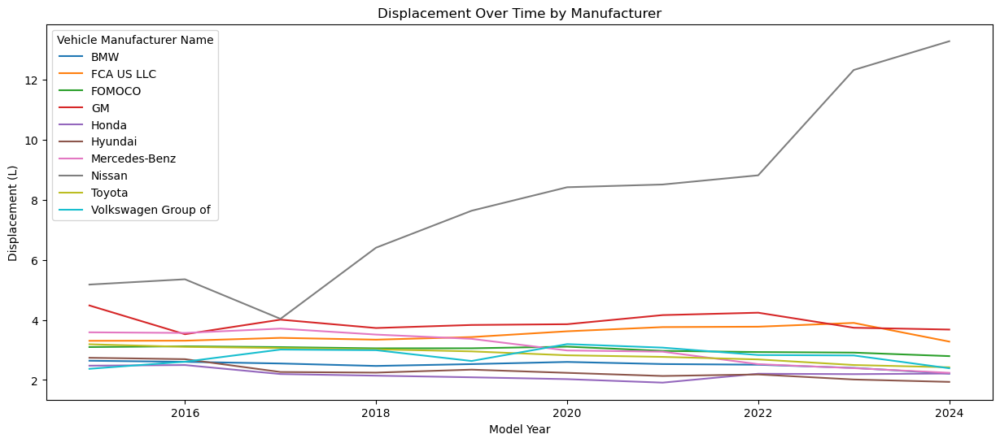

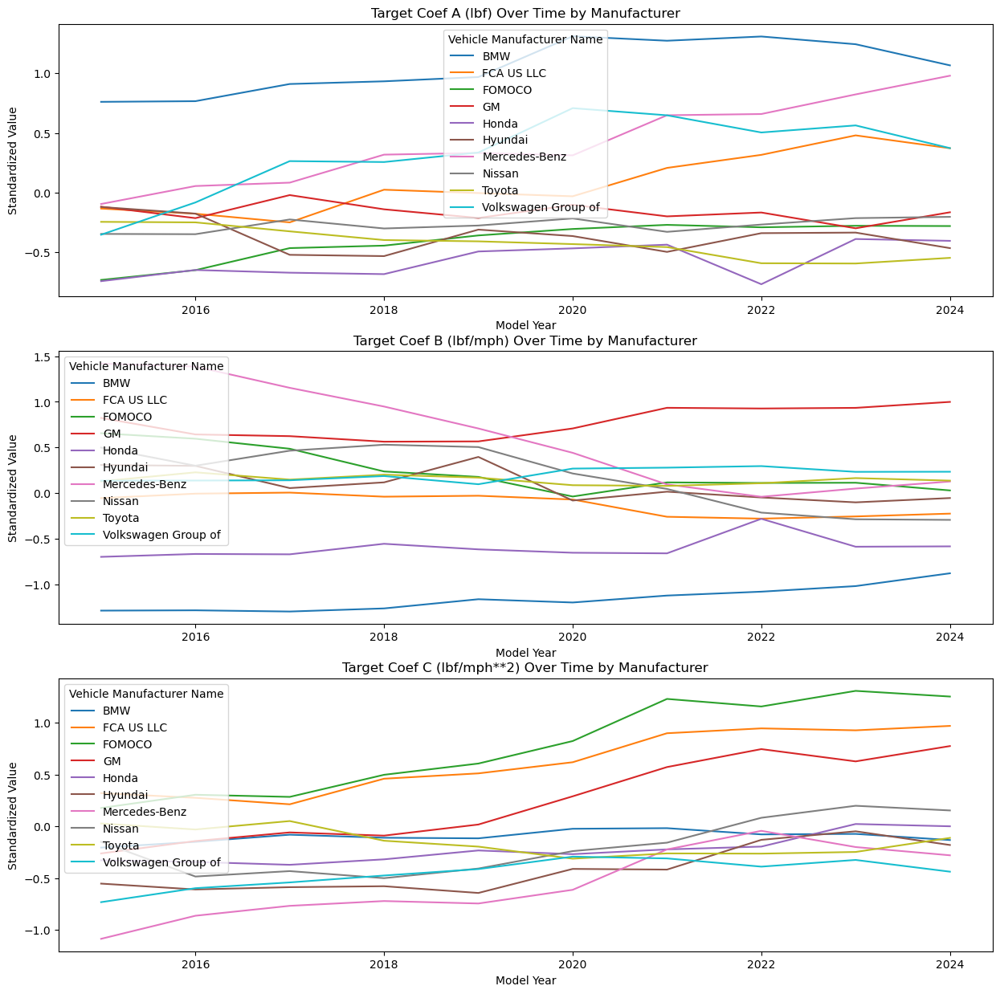

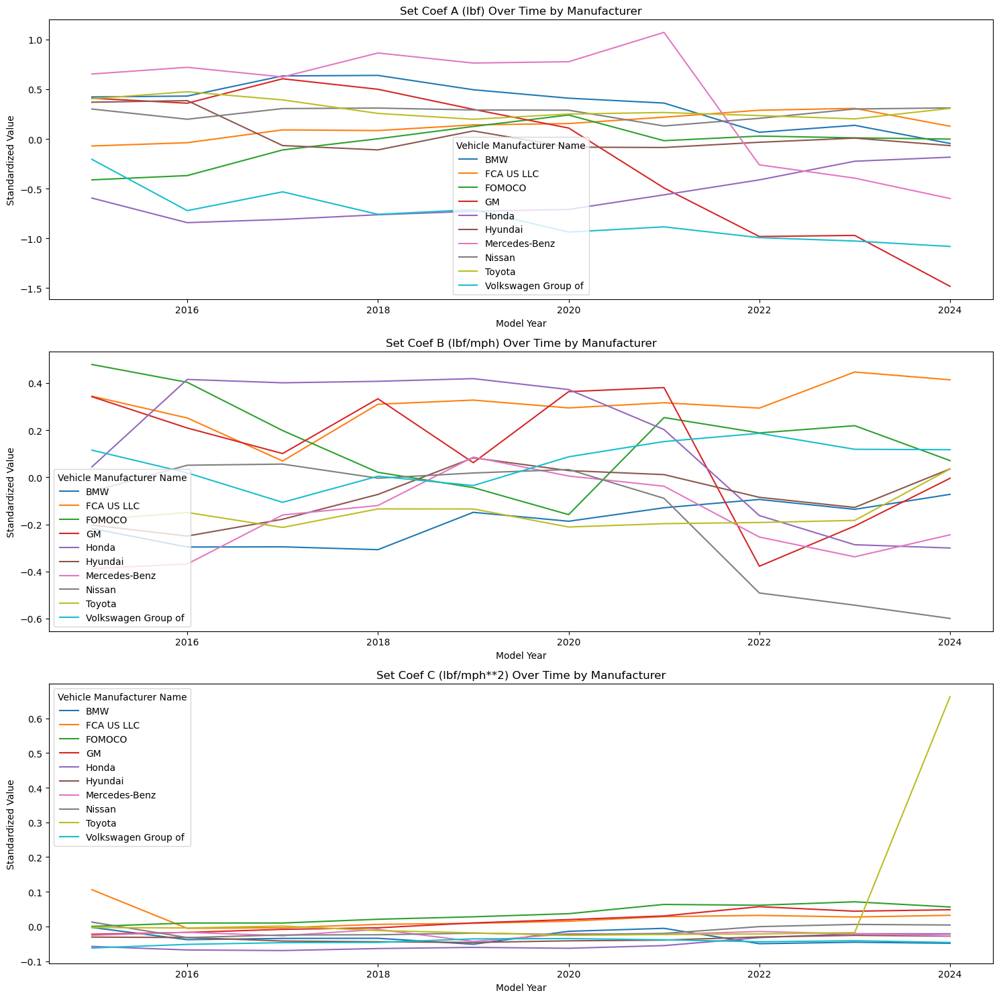

2024-11-05 13:44:58 - INFO - Time taken to process the block: 0:00:05.562133


In [37]:
start_time = datetime.datetime.now()

# Step 1: Identify the top 10 manufacturers by number of test records
top_10_manufacturers = merged_data_missing_dropped['Vehicle Manufacturer Name'].value_counts().head(10)

# Step 2: Select the key performance columns for analysis, including target and set coefficients
displacement_column = ['Test Veh Displacement (L)']
target_coeff_columns = ['Target Coef A (lbf)', 'Target Coef B (lbf/mph)', 'Target Coef C (lbf/mph**2)']
set_coeff_columns = ['Set Coef A (lbf)', 'Set Coef B (lbf/mph)', 'Set Coef C (lbf/mph**2)']
coeff_columns = target_coeff_columns + set_coeff_columns

# Step 3: Filter the dataset for the top 10 manufacturers
top_10_data = merged_data_missing_dropped[merged_data_missing_dropped['Vehicle Manufacturer Name'].isin(top_10_manufacturers.index)]

# Step 4: Standardize the target and set coefficients
scaler = StandardScaler()
top_10_data.loc[:, coeff_columns] = scaler.fit_transform(top_10_data[coeff_columns])

# Step 5: Group by 'Model Year' and 'Vehicle Manufacturer Name' to calculate mean performance metrics year-wise
year_manufacturer_performance = top_10_data.groupby(['Model Year', 'Vehicle Manufacturer Name'])[displacement_column + coeff_columns].mean().reset_index()

# Step 6: Plotting Year-wise trends

# Subplot 1: Displacement across years
fig, ax_displacement = plt.subplots(1, 1, figsize=(15, 6))
sns.lineplot(data=year_manufacturer_performance, x='Model Year', y='Test Veh Displacement (L)', hue='Vehicle Manufacturer Name', ax=ax_displacement)
ax_displacement.set_title('Displacement Over Time by Manufacturer')
ax_displacement.set_ylabel('Displacement (L)')
ax_displacement.set_xlabel('Model Year')

# Subplot 2: Target Coefficients (3 plots in 1 row)
fig, axes_target = plt.subplots(3, 1, figsize=(15, 15))  # Changed to 3 rows, 1 column
for i, column in enumerate(target_coeff_columns):
    sns.lineplot(data=year_manufacturer_performance, x='Model Year', y=column, hue='Vehicle Manufacturer Name', ax=axes_target[i])
    axes_target[i].set_title(f'{column} Over Time by Manufacturer')
    axes_target[i].set_ylabel('Standardized Value')
    axes_target[i].set_xlabel('Model Year')

# Subplot 3: Set Coefficients (3 plots in 1 row)
fig, axes_set = plt.subplots(3, 1, figsize=(15, 15))  # Changed to 3 rows, 1 column
for i, column in enumerate(set_coeff_columns):
    sns.lineplot(data=year_manufacturer_performance, x='Model Year', y=column, hue='Vehicle Manufacturer Name', ax=axes_set[i])
    axes_set[i].set_title(f'{column} Over Time by Manufacturer')
    axes_set[i].set_ylabel('Standardized Value')
    axes_set[i].set_xlabel('Model Year')

# Adjust layout
plt.tight_layout()
plt.show()

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Results
#### 1. **Vehicle Displacement**
> The "Displacement Over Time by Manufacturer" plot reveals several key trends in engine displacement across major manufacturers. Nissan stands out with a significant upward trend in engine displacement, far exceeding other manufacturers, indicating a focus on larger, high-performance vehicles, likely trucks or SUVs. In contrast, GM and FCA US LLC maintain relatively high engine displacement values over the years, though their trends remain more stable. On the other end of the spectrum, BMW, Toyota, Hyundai, and Honda consistently show lower engine displacement, reflecting a focus on smaller, more fuel-efficient engines. Most manufacturers, including FOMOCO and Volkswagen Group, demonstrate a stable or slightly declining trend, suggesting efforts to align with stricter fuel economy and emissions regulations.

#### 2. **Target Coefficients**
- Target Coef A (lbf)
> BMW consistently leads with the highest values in Target Coef A (lbf), indicating higher rolling resistance across all years. Volkswagen Group and Mercedes-Benz also show increases over time, reflecting a growing emphasis on performance-oriented or heavier vehicles. FCA US LLC maintains relatively consistent trends with positive values, while Hyundai and Honda show fluctuating patterns with negative values, reflecting a design geared toward reducing rolling resistance.

- Target Coef B (lbf/mph)
> GM shows the highest values in Target Coef B (lbf/mph), indicating that their vehicles are optimized to handle higher aerodynamic drag or powertrain friction. Mercedes-Benz shows a significant decline over time as well. BMW and Honda maintain negative values throughout, which may reflect their strategy of minimizing these forces to focus on performance handling and fuel efficiency.

- Target Coef C (lbf/mph²)
> FOMOCO leads with the highest values in Target Coef C (lbf/mph²), indicating vehicles designed to handle higher acceleration forces, possibly reflecting their focus on performance vehicles and trucks. GM and FCA US LLC also exhibit similar trends, which could point to an emphasis on vehicles with higher performance capabilities. Meanwhile, manufacturers such as BMW and Volkswagen show relatively flat trends, with negative or low values, suggesting an emphasis on smoother acceleration and efficiency rather than raw performance.

#### 3. **Set Coefficients**
- Set Coef A (lbf)
> Mercedes-Benz leads with consistently higher values in Set Coef A (lbf), showing their focus on increased road friction management, followed by BMW. In contrast, Volkswagen Group and Honda show lower values, likely aligning with a design focus on reducing friction for better fuel economy. GM shows a sharp decline toward 2024, indicating a potential design shift.

- Set Coef B (lbf/mph)
> FCA US LLC and GM maintain higher values in Set Coef B (lbf/mph), reflecting a design focus on reducing aerodynamic drag. BMW and Toyota, in contrast, show more negative values, aiming for streamlined designs and improved aerodynamics.

- Set Coef C (lbf/mph²)
> Toyota’s sharp rise in Set Coef C (lbf/mph²) in 2024 stands out, indicating a sudden focus on acceleration performance. FOMOCO and GM also show gradual increases, whereas the rest of the manufacturers remain focused on stability and efficiency with smaller variations.
	
#### Summary
Nissan stands out with a focus on larger engines, while BMW, Toyota, and others maintain smaller, more fuel-efficient designs. GM and FOMOCO lead in terms of aerodynamic and acceleration performance, with noticeable increases in target and set coefficients. Manufacturers like Mercedes-Benz and Volkswagen Group show varied focus areas, with consistent trends towards fuel efficiency and performance improvement.

## 10. Creating a Clean Dataset for Regression:
Task Description: After performing the EDA, create a clean dataset that can be used for regression analysis. What transformations did you perform (e.g., removing outliers, imputing missing values, standardizing variables)? Provide a brief summary of your cleaning process.

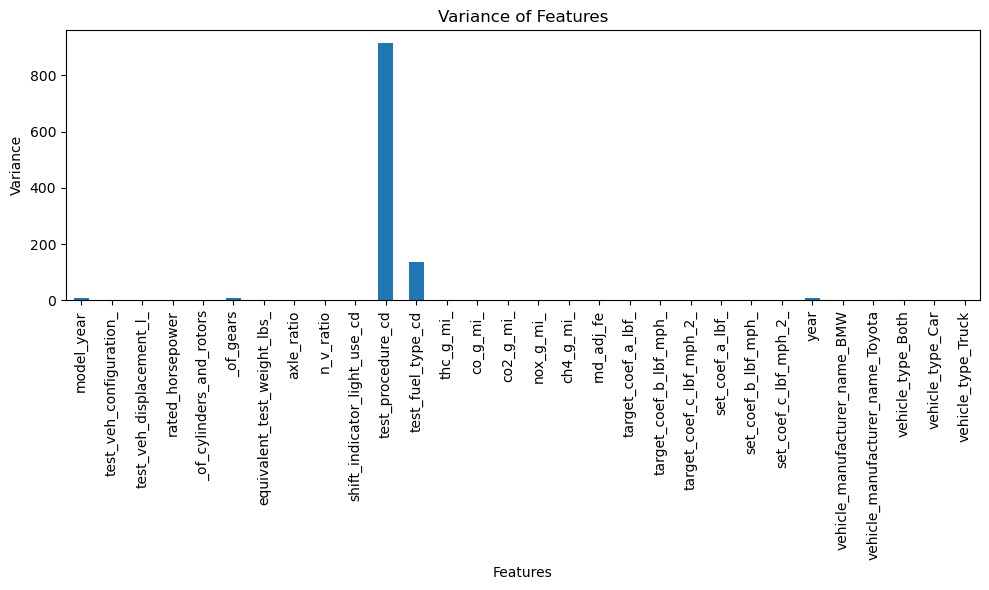

   model_year  test_veh_configuration_  test_veh_displacement_l_  \
0      2015.0                -0.579731                  0.349398   
1      2015.0                -0.579731                  0.349398   
2      2015.0                -0.579731                  0.363321   
3      2015.0                -0.579731                  0.363321   
4      2015.0                -0.579731                  0.363321   

   rated_horsepower  _of_cylinders_and_rotors  _of_gears  \
0          1.399203                      12.0        6.0   
1          1.399203                      12.0        6.0   
2          1.676468                      12.0        8.0   
3          1.676468                      12.0        8.0   
4          1.762288                      12.0        7.0   

   equivalent_test_weight_lbs_  axle_ratio  n_v_ratio  \
0                     0.120612   -0.135910  -0.042358   
1                     0.120612   -0.135910  -0.042358   
2                     0.411694   -0.768489  -0.229117   
3 

2024-11-05 13:48:04 - INFO - Time taken to process the block: 0:03:05.876151


In [38]:
start_time = datetime.datetime.now()

import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import IsolationForest

# Combine all dataframes into one
combined_data = pd.concat(merged_data, ignore_index=True)

# Step 1: Selecting only numerical columns and the specified non-numerical columns
numerical_cols = combined_data.select_dtypes(include=['float64', 'int64']).columns
selected_cols = numerical_cols.tolist() + ['vehicle_manufacturer_name', 'vehicle_type']
df = combined_data[selected_cols]

# Track initial number of rows
initial_row_count = df.shape[0]

# Step 2: Handling Missing Values
# 2a. Drop columns with more than 80% missing values
threshold = 0.8 * df.shape[0]  # 80% of the row count
df = df.dropna(thresh=threshold, axis=1)

# Update numerical columns after dropping
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# 2b. Apply KNN Imputation to handle the remaining missing values
# Use KNN Imputer with k=5 (default), which looks at 5 nearest neighbors to impute missing values
imputer = KNNImputer(n_neighbors=5)

# Apply KNN Imputer to numerical columns
df.loc[:, numerical_cols] = imputer.fit_transform(df[numerical_cols])

# After imputation, row count (shouldn't change row count, but keep track)
row_count_after_imputation = df.shape[0]

# Step 3: Outlier Detection using Isolation Forest
iso_forest = IsolationForest(contamination=0.02, random_state=42)  # 2% contamination for outlier removal
outlier_preds = iso_forest.fit_predict(df[numerical_cols])

# Filter out outliers (where prediction is -1)
df_filtered = df[outlier_preds == 1]

# Track rows remaining after outlier removal
row_count_after_outlier_removal = df_filtered.shape[0]

# Step 4: One-Hot Encoding for the selected categorical variables
encoder = OneHotEncoder(sparse_output=False)
encoded_cols = encoder.fit_transform(df_filtered[['vehicle_manufacturer_name', 'vehicle_type']])

# Convert encoded columns into DataFrame
encoded_df = pd.DataFrame(encoded_cols, columns=encoder.get_feature_names_out(['vehicle_manufacturer_name', 'vehicle_type']))

# Drop the original categorical columns and concatenate encoded ones
df_filtered = df_filtered.drop(columns=['vehicle_manufacturer_name', 'vehicle_type']).reset_index(drop=True)
df_filtered = pd.concat([df_filtered, encoded_df], axis=1)

# Step 5: Feature Selection
selector = VarianceThreshold(threshold=0.1)
df_filtered = pd.DataFrame(selector.fit_transform(df_filtered), columns=df_filtered.columns[selector.get_support()])

# Visualize the Variance of Each Feature
variances = df_filtered.var()

plt.figure(figsize=(10, 6))
variances.plot(kind='bar')
plt.title('Variance of Features')
plt.xlabel('Features')
plt.ylabel('Variance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Display the final cleaned dataset
print(df_filtered.head())
print(df_filtered.columns)

# Report statistics on row counts affected at each step
print(f"Initial Row Count: {initial_row_count}")
print(f"Rows after Imputation: {row_count_after_imputation} (0% affected)")
print(f"Rows after Outlier Removal: {row_count_after_outlier_removal} ({100 * (initial_row_count - row_count_after_outlier_removal) / initial_row_count:.2f}% rows affected)")

df_filtered.to_csv('data/Regression_Dataset.csv', index=False)

stop_time = datetime.datetime.now()
logger.info(f"Time taken to process the block: {stop_time - start_time}")

### Summary of Cleaning Process:
1. **Initial Data Overview**:
> The combined dataset was created by merging multiple dataframes into one, ensuring that all necessary columns were available. Since the data had already been standardized in earlier tasks, no further normalization was required. All numerical features were ready for further analysis without needing any transformations.

2. **Handling Missing Values**:

    - **Step 2(a): Dropping columns with more than 80% missing data**
    > We removed any columns with more than 80% missing values. This ensured that columns with excessive missing data were eliminated, as they were unlikely to contribute meaningfully to the analysis.
    
    - **Step 2(a): KNN Imputation**
    > After dropping the columns, missing values were filled using KNN imputation, which uses the 5 nearest neighbors to estimate and fill in missing values based on the patterns found in neighboring data points. This is a more sophisticated approach than median and mean imputation, as it considers relationships between data points.

3. **Outlier Detection Using Isolation Forest**:
> The Isolation Forest algorithm was applied to detect outliers by isolating points in the dataset through random partitioning. Points that were isolated quickly were considered outliers. A contamination rate of 2% was used, meaning 2% of the data points were flagged as outliers and removed from the dataset. This step ensured that extreme values did not skew the analysis.

4. **One-Hot Encoding of Categorical Variables**:
> The columns `vehicle_manufacturer_name` and `vehicle_type` were categorical in nature, so they were transformed into numerical format using One-Hot Encoding. This technique converts categorical variables into binary (0/1) variables. 

5. **Feature Selection Using Variance Threshold**:
> Columns with low variance were removed, as they did not provide much information to differentiate between data points, and their removal simplified the dataset. Features with very little variance are unlikely to be useful for predictive models because they provide little information to distinguish between data points. A bar plot was used to visualize the variance of all features remaining after cleaning, helping to identify which features were retained.

6. **Tracking**:
> The number of rows was tracked after each major step to provide insights into how much data was affected at each stage of the cleaning process. The total time taken to process the code block was also logged to assess the efficiency of the cleaning process.


### Cleaned Dataset

After the cleaning process:

- Rows affected by outlier removal and imputation were accounted for, leaving only valid, non-outlier rows.
- Only features with meaningful variance were retained, while the rest were removed to reduce noise in the dataset.
- The dataset is now free of missing values, outliers, and irrelevant features, making it ready for further analysis or modeling.

# Summarization of EDA:
In our EDA, we explored datasets from multiple years, focusing on key variables and analyzing summary statistics to identify trends, outliers, and anomalies. We examined the data structure, handled missing values, and addressed inconsistencies in column names to standardize and prepare the datasets for combining. By analyzing distributions and correlations, we observed shifts in vehicle performance and emissions over time. After stacking the datasets, we standardized continuous variables for comparability and cleaned the data by addressing outliers and missing values, creating a robust dataset ready for regression analysis.